**stage2_DANN_HPsearch.ipynb**. This notebook attempts to search the hyperparameter that yields the optimal validation performance.

**Edit**<br/>

**TODO**<br/>

# Import packages and get authenticated

In [1]:
from google.colab import drive
drive.mount('drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at drive


In [0]:
import numpy as np

import pandas as pd
pd.set_option('display.max_columns', 500)
from tqdm import tqdm_notebook as tqdm
from IPython.display import display
import os
import sys
sys.path.append('/content/drive/My Drive/中研院/repo/')

from utilities import *
from models import *
from dataset_util import *
from training_util import *
from eval_util import *

import time
import datetime
from datetime import datetime
import json

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
matplotlib.rc( 'savefig', facecolor = 'white' )

from sklearn.decomposition import PCA

import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F

In [0]:
CV_n = 17
tasks_list = [('UMAFall_wrist', 'UPFall_neck'), ('UMAFall_wrist', 'UPFall_belt'), ('UMAFall_wrist', 'UPFall_ankle'),
              ('UMAFall_waist', 'UPFall_neck'), ('UMAFall_waist', 'UPFall_wrist'), ('UMAFall_waist', 'UPFall_ankle'),
              ('UMAFall_ankle', 'UPFall_neck'), ('UMAFall_ankle', 'UPFall_wrist'), ('UMAFall_ankle', 'UPFall_belt')]

CV_n = 15
tasks_list = [('UMAFall_wrist', 'UPFall_rightpocket'), ('UMAFall_waist', 'UPFall_rightpocket'), ('UMAFall_ankle', 'UPFall_rightpocket'),
              ('UMAFall_leg', 'UPFall_neck'), ('UMAFall_leg', 'UPFall_wrist'), ('UMAFall_leg', 'UPFall_belt'), ('UMAFall_leg', 'UPFall_ankle')]


# new arch HP search

In [0]:
def get_optimal(df_performance_table_agg):
  df_performance_table_agg_temp = df_performance_table_agg.copy()

  result = df_performance_table_agg_temp[['HP_i0','HP_i1','HP_i2']].sort_values(by='DANN', ascending=False, axis=1)
  batch_size_optimal = result.loc['batch_size'][0]

  result = df_performance_table_agg_temp[['HP_i3','HP_i3_1','HP_i4']].sort_values(by='DANN', ascending=False, axis=1)
  channel_n_optimal = result.loc['channel_n'][0]

  result = df_performance_table_agg_temp[['HP_i5','HP_i5_1','HP_i6']].sort_values(by='DANN', ascending=False, axis=1)
  learning_rate_optimal = result.loc['learning_rate'][0]

  return int(batch_size_optimal), int(channel_n_optimal), learning_rate_optimal

outputdir for stage2 ('UMAFall_waist', 'UPFall_wrist') output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/
df_performance_table_agg saved at /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/HP_search/

======================  train on source, val on target(source=UMAFall_waist to target=UPFall_wrist)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UMAFall_loader...
train_data shape: (457, 3, 66)
val_data shape: (44, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.2603938730853392 0.045951859956236324 0.3851203501094092 1.0459518599562363
acc perf

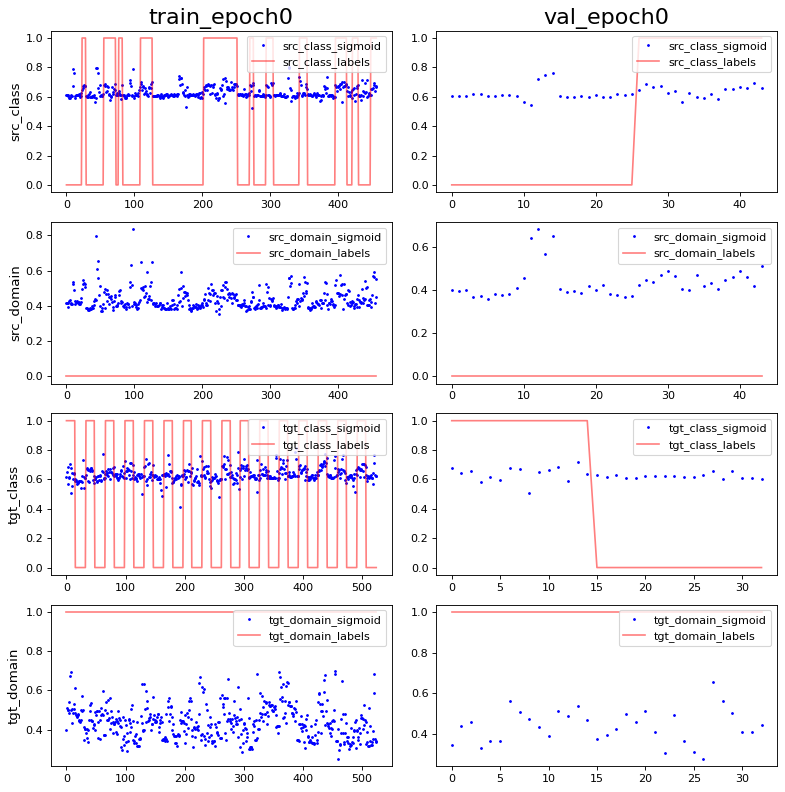

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 3.452996e-09 1.0
PCA var: [15.700001 29.100002 35.600002 41.600002 46.500004 50.500004 54.000004
 57.300003 60.000004 62.600002]
show standardize mean and std: 2.7523068e-09 0.9965218
PCA var: [22.5      36.3      45.699997 52.899998 58.399998 63.399998 67.6
 71.7      75.1      77.9     ]


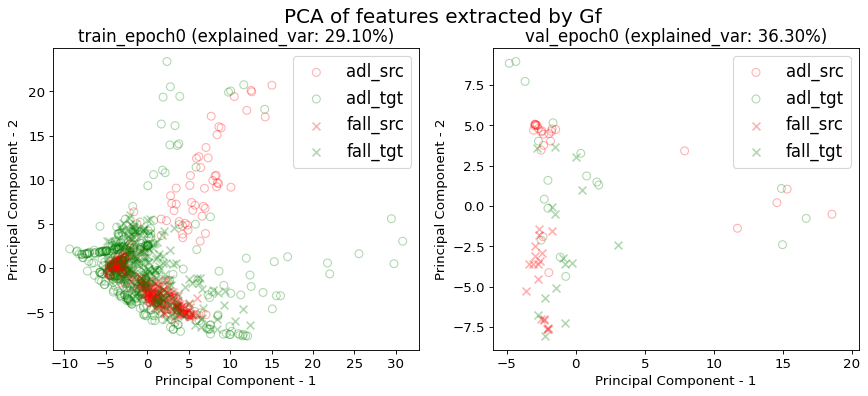

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


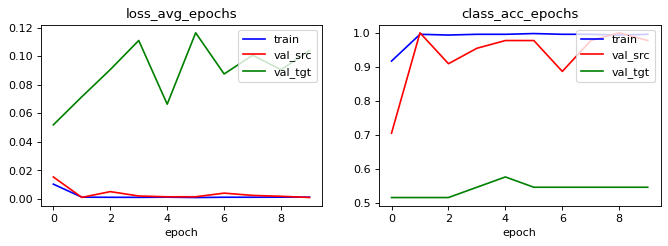

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.9956236323851203 0.2363238512035011 0.7439824945295405 0.9846827133479212
acc performance: 0.9772727272727273 0.22727272727272727 0.4090909090909091 0.75


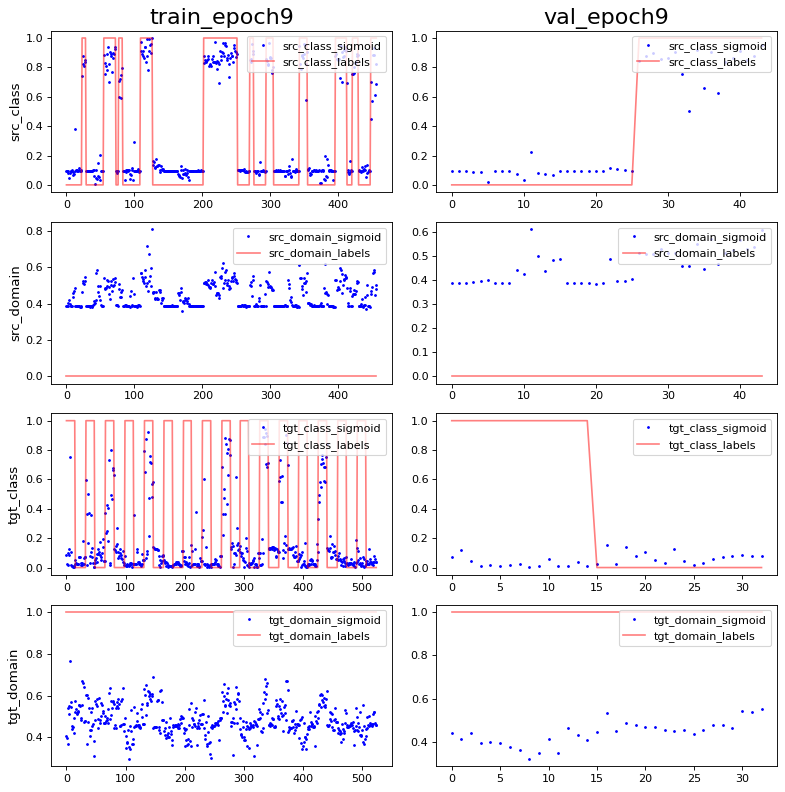

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 5.6111182e-09 1.0
PCA var: [58.899998 67.899994 75.299995 78.6      81.299995 83.299995 85.1
 86.7      87.899994 88.99999 ]
show standardize mean and std: 0.0 0.9965218
PCA var: [60.5      71.7      78.899994 83.49999  87.19999  89.59999  91.399994
 92.899994 94.299995 95.399994]


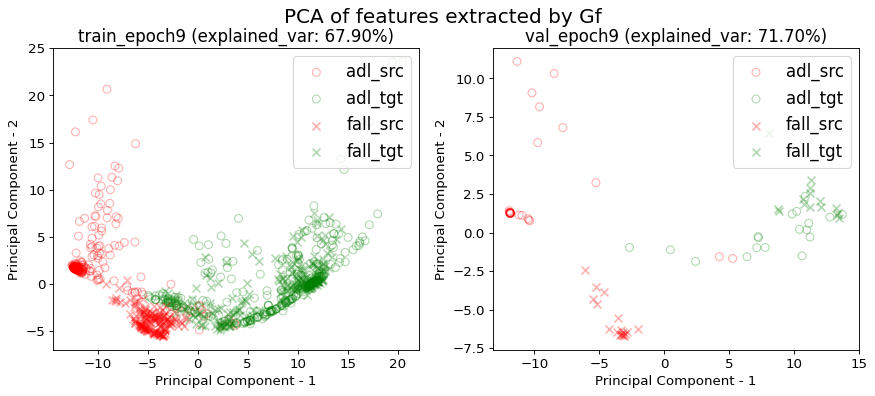

------------------------------Working on i_CV 1------------------------------
Working on get_UMAFall_loader...
train_data shape: (472, 3, 66)
val_data shape: (29, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.3686440677966102 0.0 0.510593220338983 1.1080508474576272
acc performance: 0.20689655172413793 0.0 0.5172413793103449 1.1379310344827587


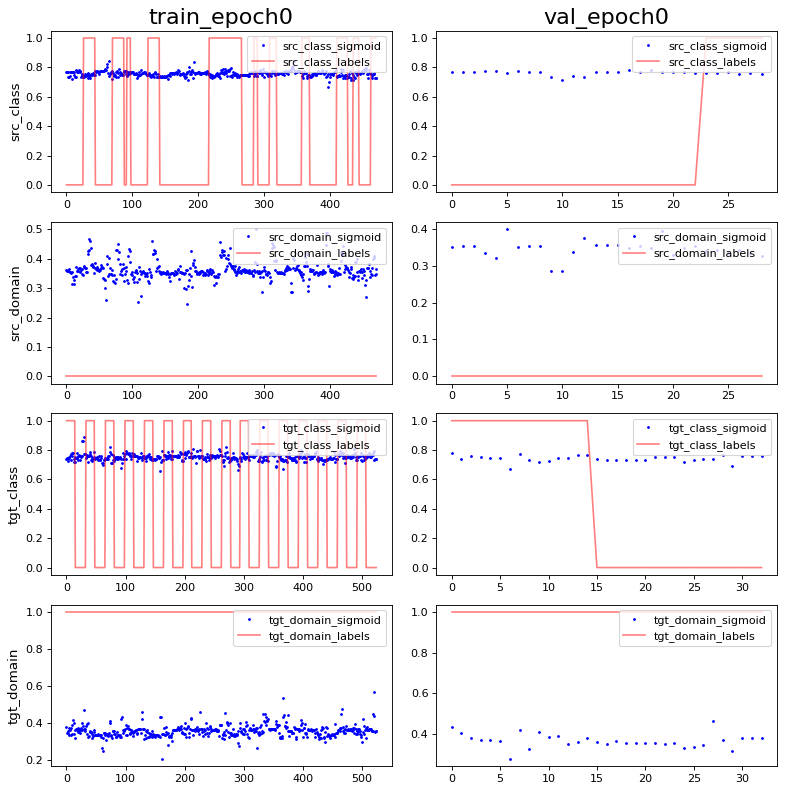

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 1.2753919e-09 0.9930312
PCA var: [24.1      40.2      48.4      54.300003 57.700005 60.600006 63.000008
 65.30001  67.40001  69.20001 ]
show standardize mean and std: 5.1272813e-09 0.98952854
PCA var: [30.5      41.6      51.3      60.       67.       71.9      76.3
 79.8      82.4      84.700005]


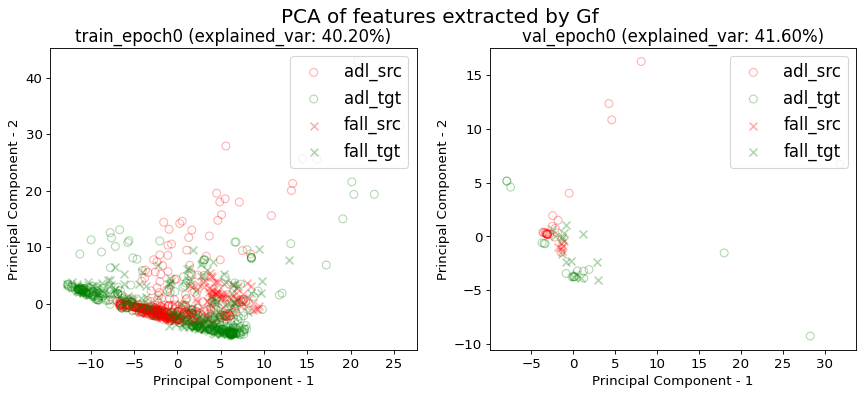

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


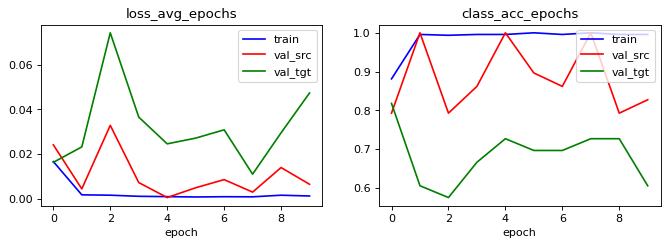

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.847457627118644 0.08050847457627118 0.6207627118644068 1.0889830508474576
acc performance: 0.8275862068965517 0.10344827586206896 0.6896551724137931 1.103448275862069


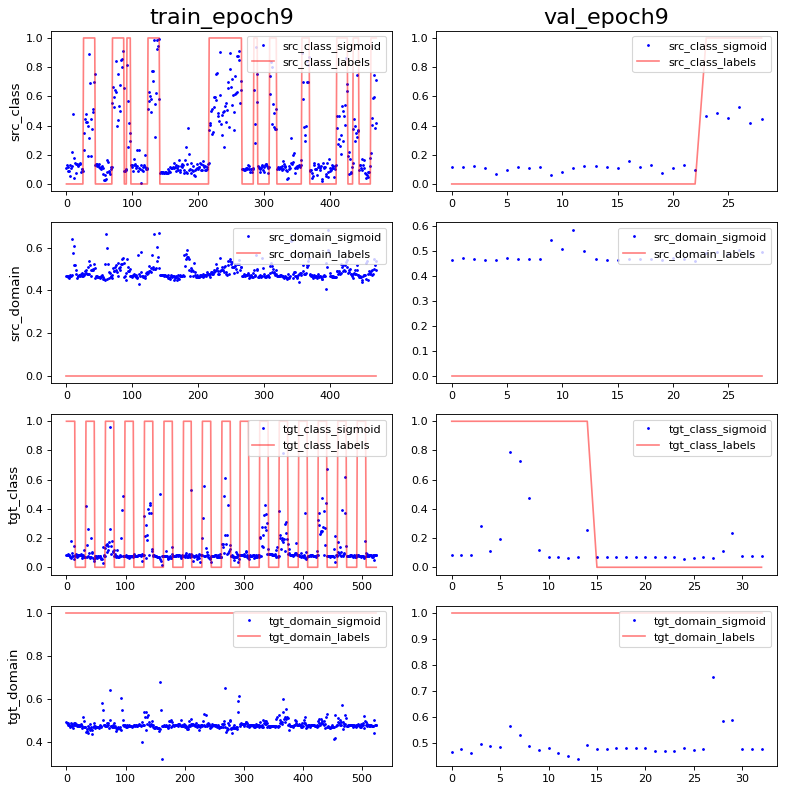

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: -2.9759144e-09 1.0
PCA var: [36.899998 48.699997 55.299995 59.799995 63.399994 66.799995 69.399994
 71.799995 73.899994 75.59999 ]
show standardize mean and std: 1.02545625e-08 0.98952854
PCA var: [37.9      63.600002 73.9      82.1      86.299995 89.49999  91.799995
 93.99999  95.09999  96.09999 ]


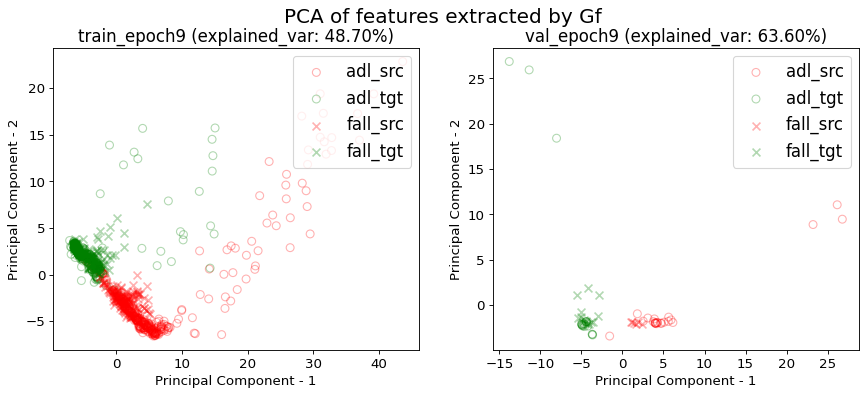

------------------------------Working on i_CV 2------------------------------
Working on get_UMAFall_loader...
train_data shape: (489, 3, 66)
val_data shape: (12, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.6359918200408998 0.5603271983640081 0.5746421267893661 0.5439672801635992
acc performance: 1.0 0.0 1.3333333333333333 1.5


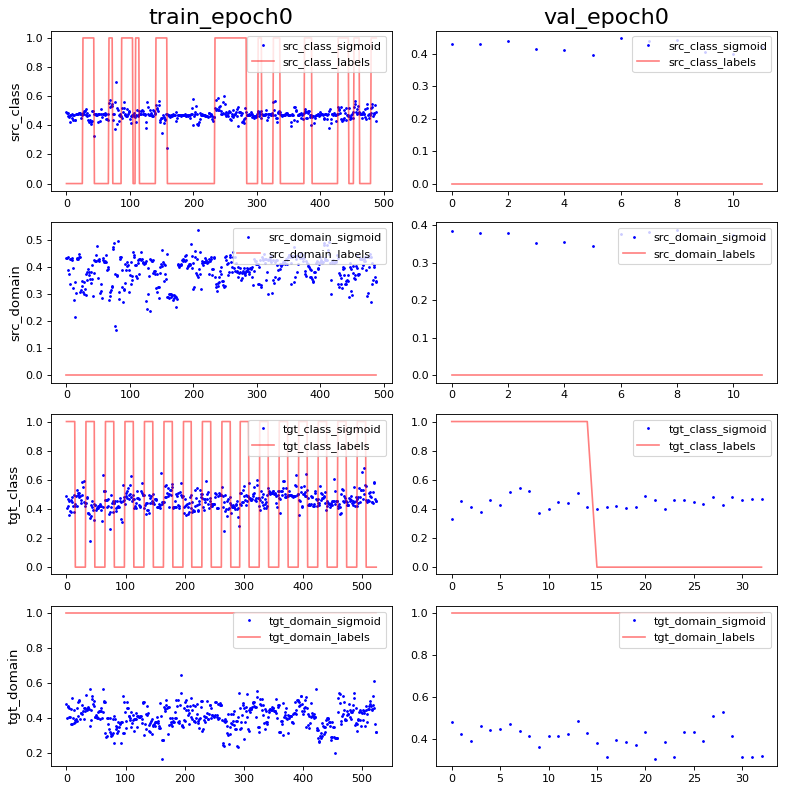

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 1.2540097e-09 0.9965218
PCA var: [21.699999 32.1      38.699997 44.399998 49.399998 52.999996 56.099995
 58.799995 61.199997 63.399998]
show standardize mean and std: 0.0 0.98952854
PCA var: [28.400002 44.       55.6      63.699997 70.5      75.2      79.
 82.1      84.9      87.200005]


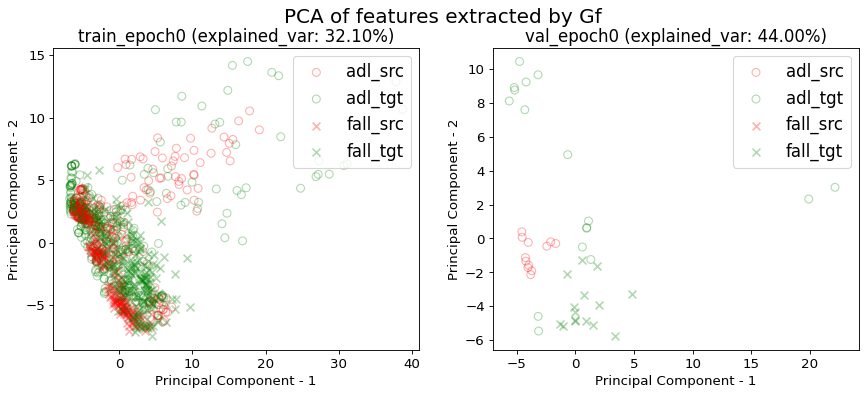

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


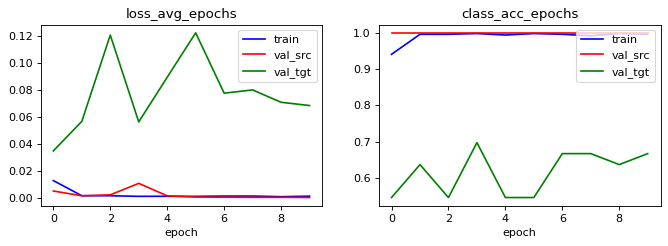

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.9529652351738241 0.4335378323108384 0.8077709611451943 0.65439672801636
acc performance: 1.0 1.0 1.8333333333333333 1.8333333333333333


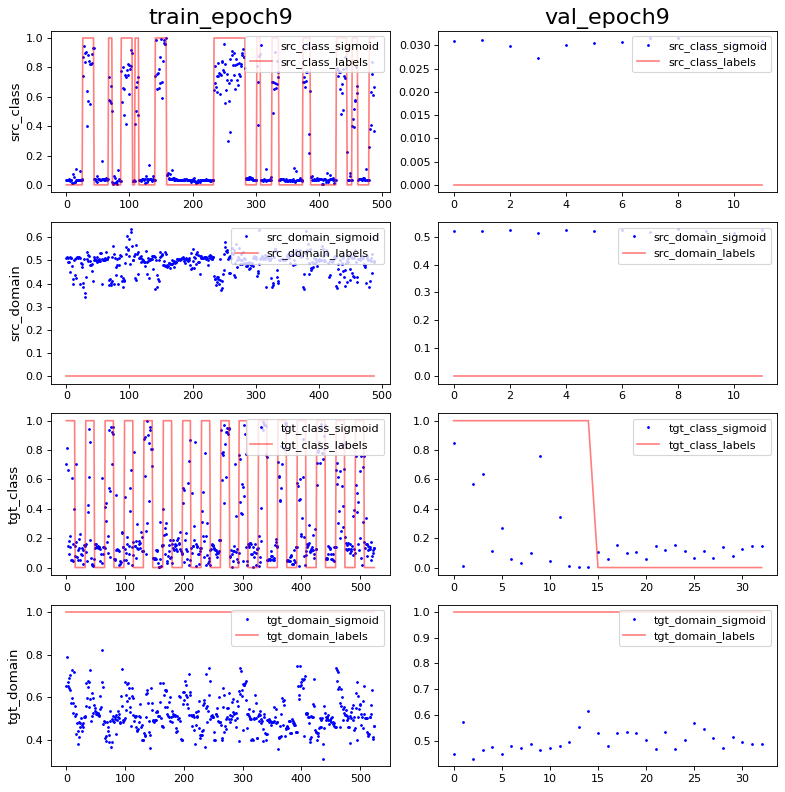

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: -5.0160387e-09 1.0
PCA var: [42.2      58.300003 65.       70.6      73.7      75.7      77.5
 79.1      80.5      81.7     ]
show standardize mean and std: 2.3547515e-09 0.9965218
PCA var: [46.3      65.7      73.299995 78.99999  82.69999  85.49999  87.899994
 89.99999  91.49999  92.899994]


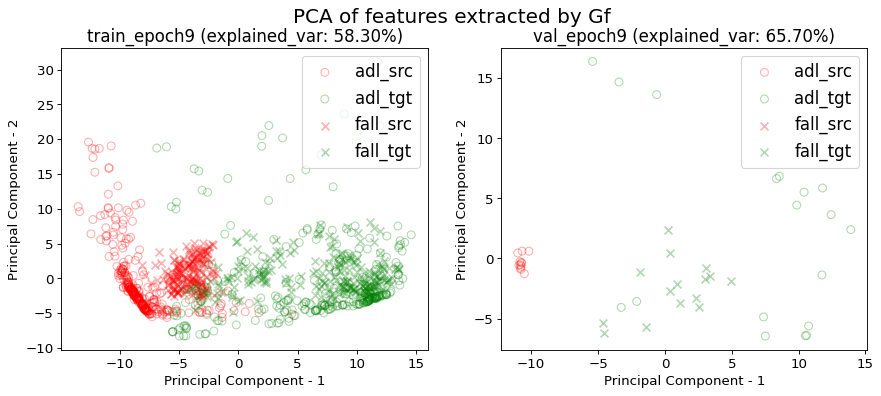

------------------------------Working on i_CV 3------------------------------
Working on get_UMAFall_loader...
train_data shape: (469, 3, 66)
val_data shape: (32, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.31556503198294245 0.9701492537313433 0.43710021321961623 0.03411513859275053
acc performance: 0.625 0.96875 0.53125 0.0625


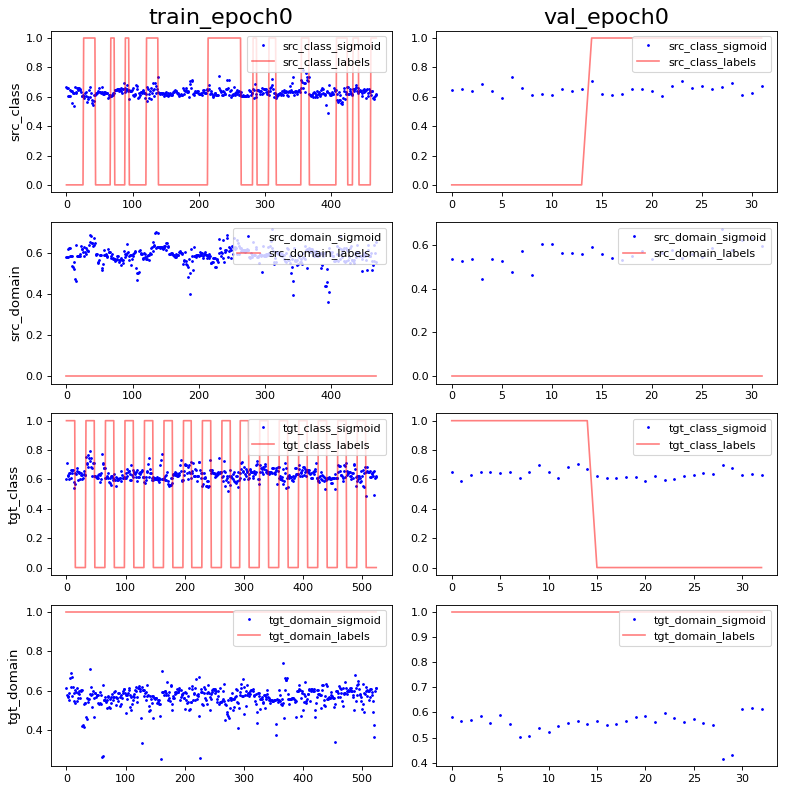

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 2.5584823e-09 0.9965218
PCA var: [22.8      33.399998 40.1      46.5      50.4      53.800003 56.800003
 59.200005 61.600006 63.800007]
show standardize mean and std: 0.0 0.99303126
PCA var: [24.1 35.2 44.4 51.7 57.7 62.3 66.4 70.1 73.5 76.6]


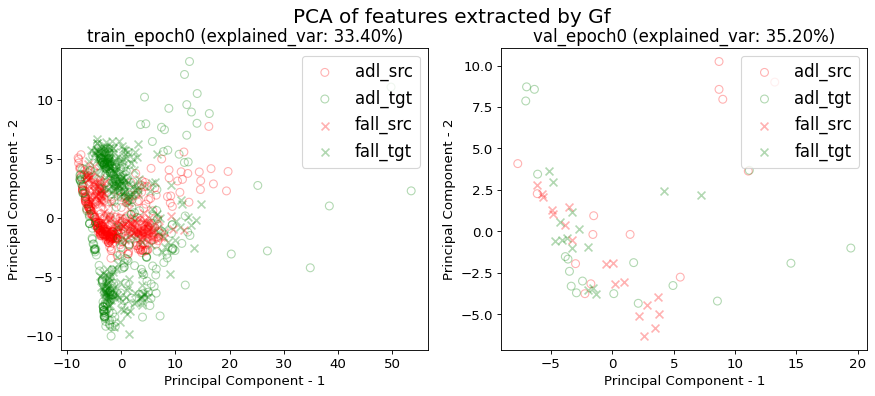

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


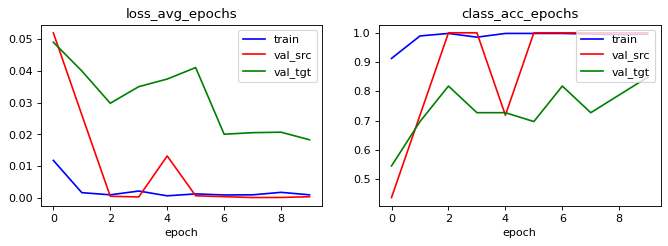

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.997867803837953 0.9381663113006397 0.8784648187633263 0.67590618336887
acc performance: 1.0 0.84375 0.875 0.375


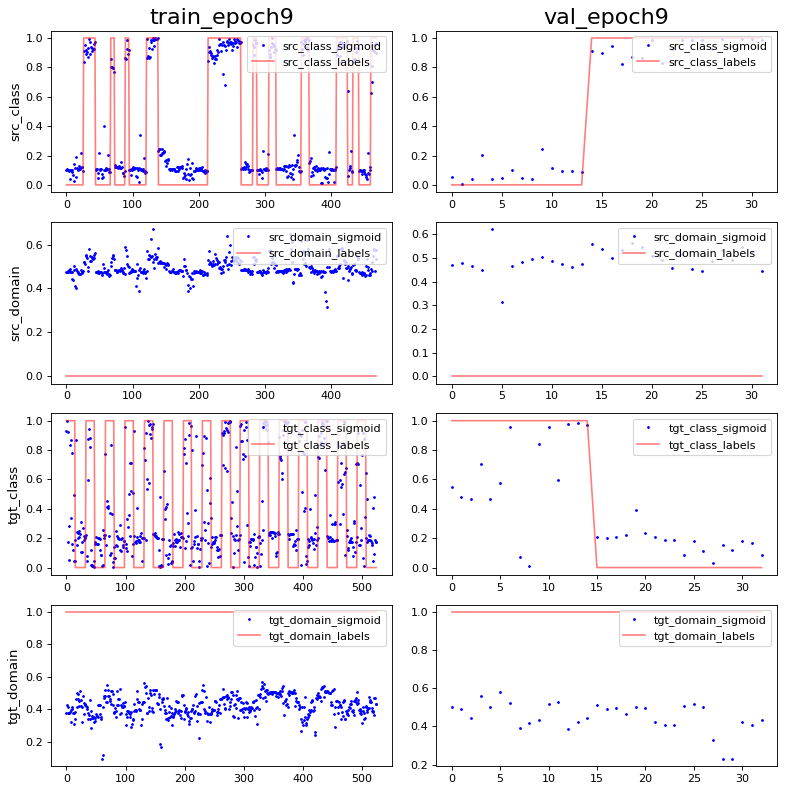

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: -7.675447e-09 0.9965218
PCA var: [64.       72.9      79.8      82.100006 84.00001  85.600006 86.90001
 88.00001  88.90001  89.70001 ]
show standardize mean and std: -6.52085e-09 0.99303126
PCA var: [48.8      64.4      76.700005 79.9      82.700005 85.3      87.3
 89.200005 90.700005 92.00001 ]


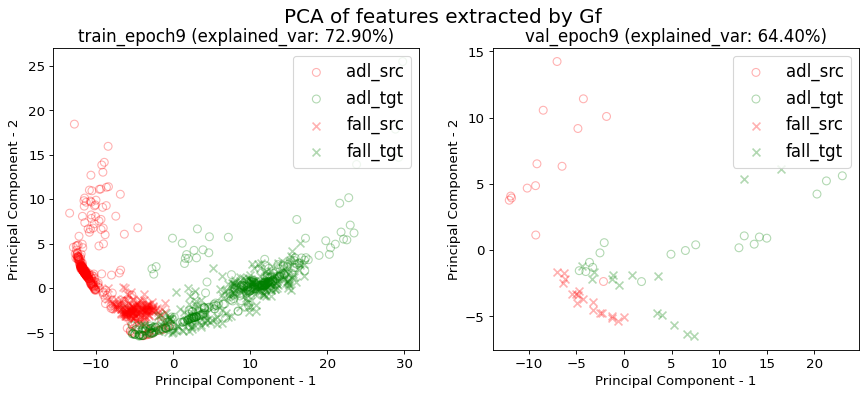

------------------------------Working on i_CV 4------------------------------
Working on get_UMAFall_loader...
train_data shape: (491, 3, 66)
val_data shape: (10, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.3543788187372709 0.8492871690427699 0.48676171079429736 0.5213849287169042
acc performance: 0.6 0.8 1.5 1.9


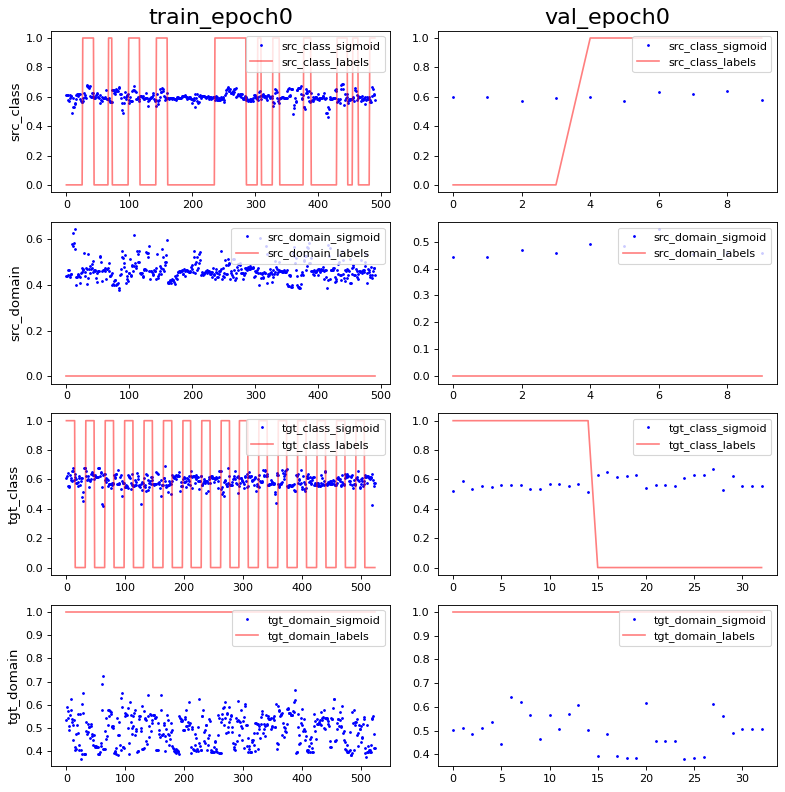

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 5.214755e-10 0.99303126
PCA var: [28.       40.3      49.699997 55.6      59.6      62.6      65.5
 67.7      69.6      71.4     ]
show standardize mean and std: 0.0 0.98952854
PCA var: [21.       39.7      52.9      59.300003 64.9      69.4      73.3
 76.700005 80.00001  82.700005]


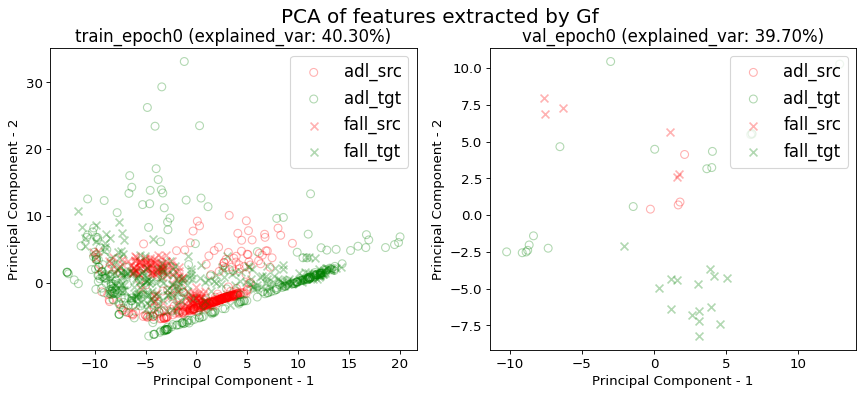

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


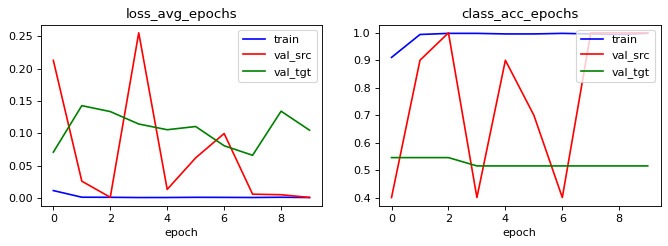

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.9979633401221996 1.0 0.6863543788187373 0.0
acc performance: 1.0 1.0 1.7 0.0


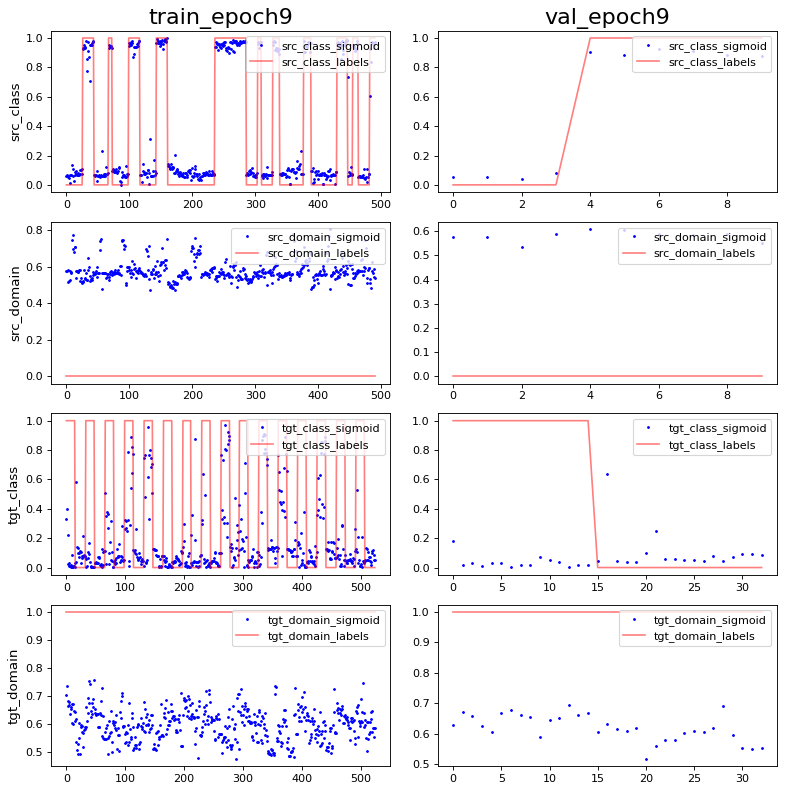

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: -4.380394e-09 0.99303126
PCA var: [61.1      71.2      78.899994 81.7      83.6      85.2      86.6
 87.799995 88.899994 89.799995]
show standardize mean and std: 0.0 0.98248553
PCA var: [72.899994 84.7      88.399994 91.2      93.1      94.299995 95.1
 95.9      96.700005 97.200005]


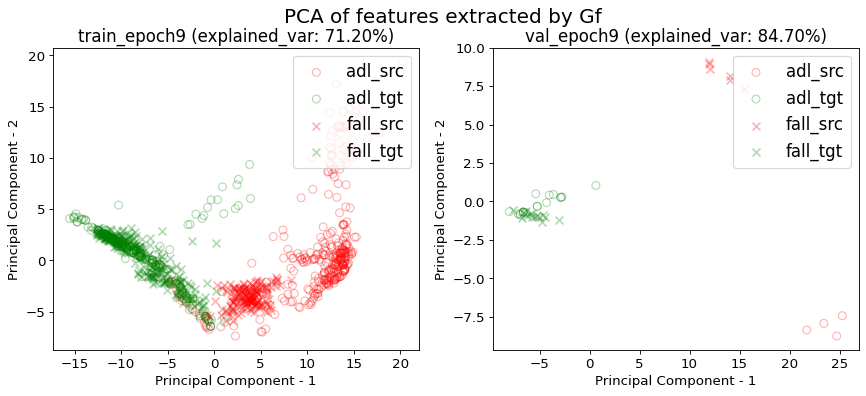

------------------------------Working on i_CV 5------------------------------
Working on get_UMAFall_loader...
train_data shape: (457, 3, 66)
val_data shape: (44, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.6280087527352297 0.8555798687089715 0.6608315098468271 0.2713347921225383
acc performance: 0.5454545454545454 0.9545454545454546 0.3181818181818182 0.11363636363636363


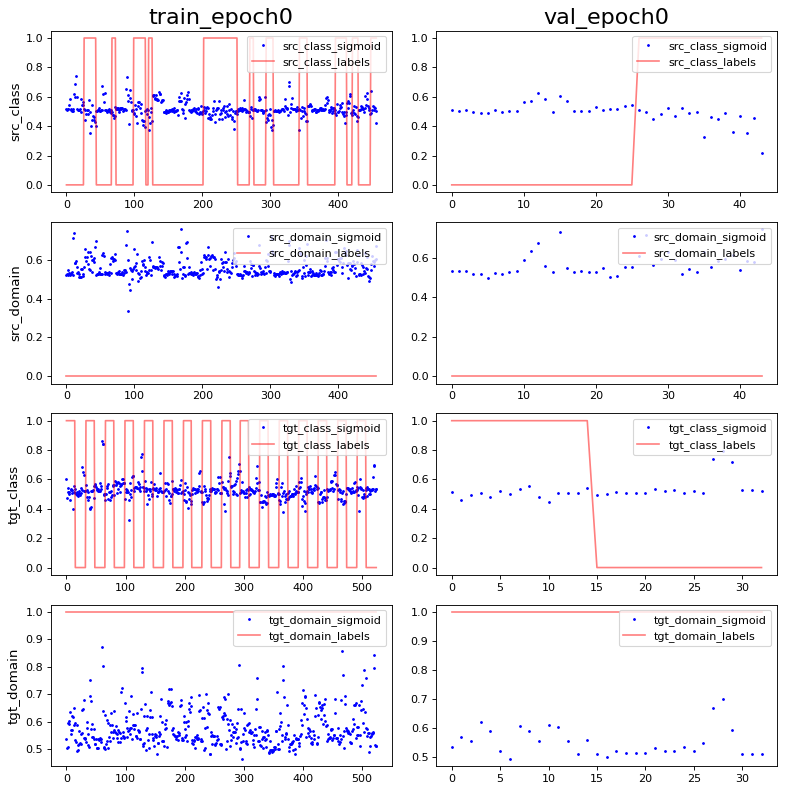

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: -2.1581226e-09 0.9965218
PCA var: [19.5      36.3      44.5      49.1      52.699997 55.899998 58.6
 60.699997 62.699997 64.6     ]
show standardize mean and std: 5.5046137e-09 0.98952854
PCA var: [29.800001 42.100002 51.300003 59.100002 65.100006 70.100006 73.700005
 76.9      79.5      81.5     ]


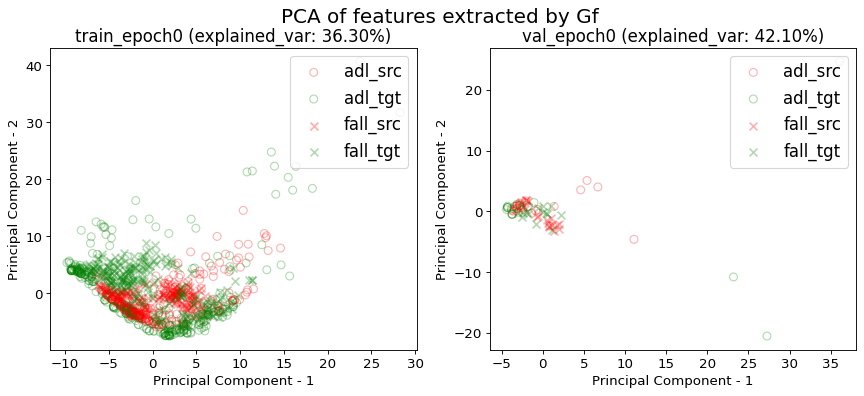

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


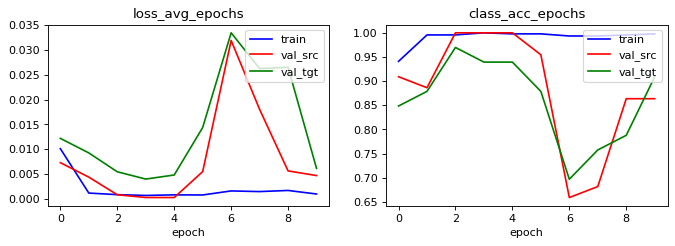

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.787746170678337 1.0 0.8468271334792122 0.002188183807439825
acc performance: 0.8636363636363636 1.0 0.6818181818181818 0.0


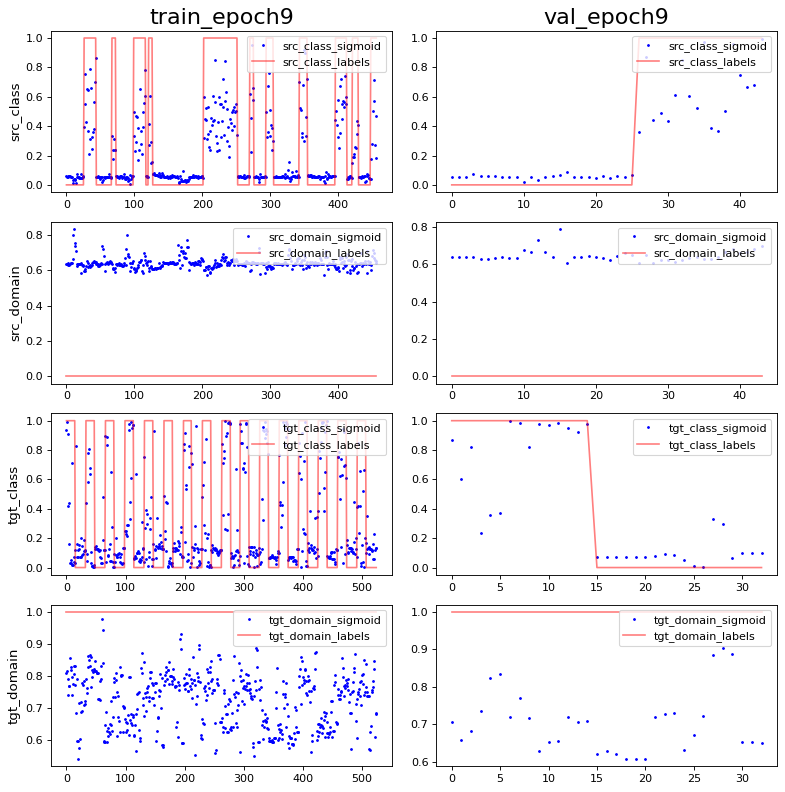

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: -1.726498e-09 1.0
PCA var: [49.7      70.       74.7      78.399994 81.2      83.399994 84.899994
 86.2      87.299995 88.2     ]
show standardize mean and std: 0.0 1.0
PCA var: [45.899998 62.899998 73.1      77.1      80.799995 83.7      86.5
 88.8      90.600006 92.00001 ]


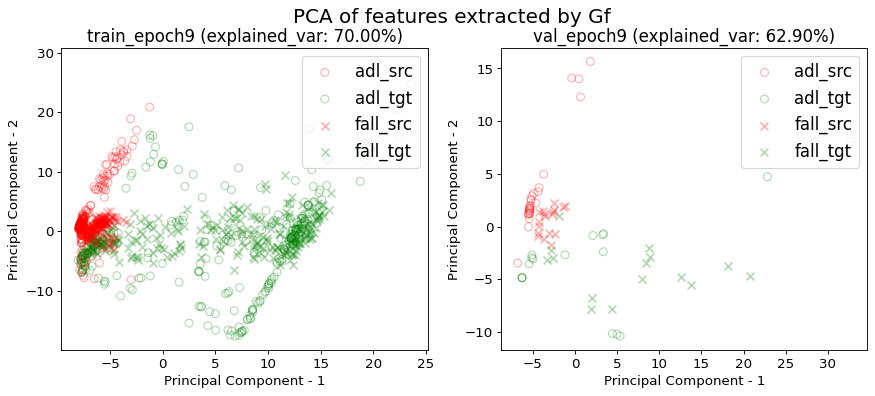

------------------------------Working on i_CV 6------------------------------
Working on get_UMAFall_loader...
train_data shape: (485, 3, 66)
val_data shape: (16, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.33814432989690724 0.004123711340206186 0.44742268041237115 1.0701030927835051
acc performance: 0.0 0.0 0.8125 2.0625


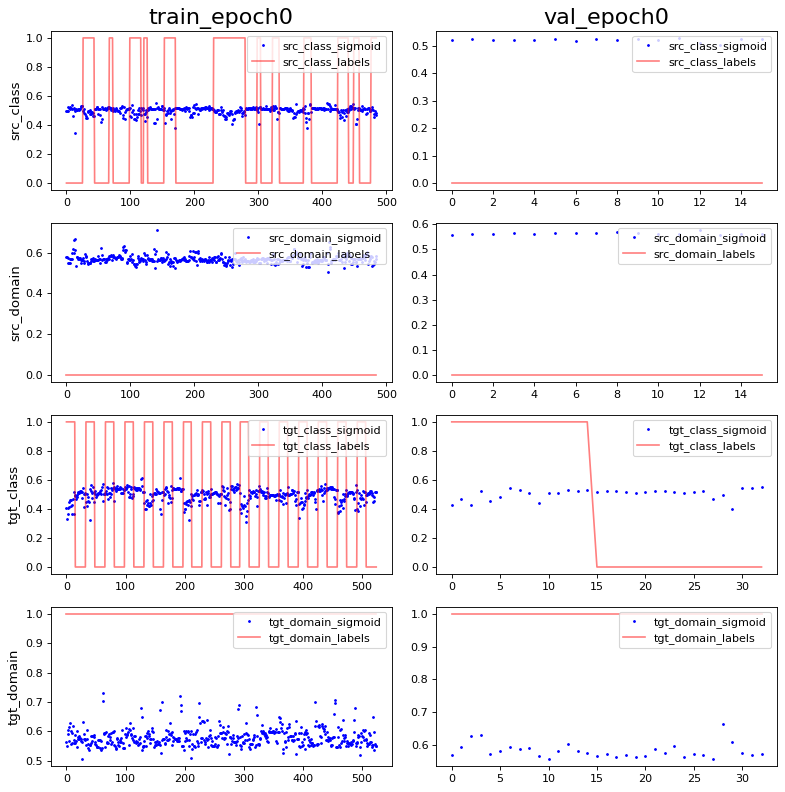

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 2.0982933e-10 0.99303126
PCA var: [25.400002 38.600002 46.000004 51.700005 55.400005 58.800007 61.500008
 63.90001  65.80001  67.50001 ]
show standardize mean and std: 4.3250536e-09 0.9860133
PCA var: [29.9      44.6      54.6      61.1      66.6      71.1      75.1
 78.7      81.7      84.399994]


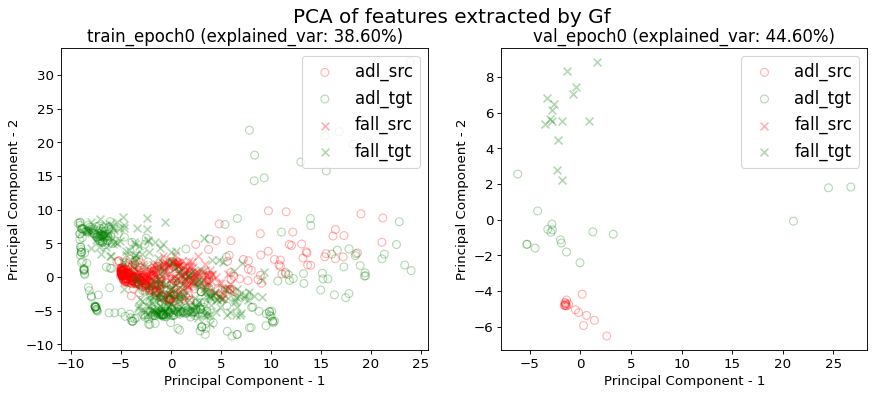

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


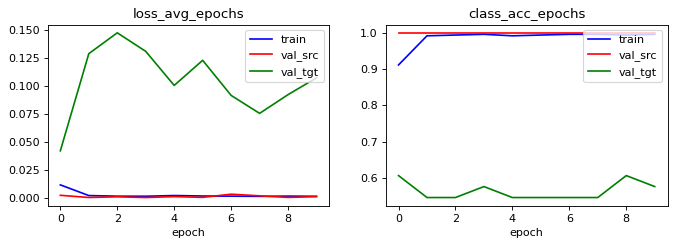

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.9463917525773196 0.23505154639175257 0.7814432989690722 0.15463917525773196
acc performance: 1.0 0.0 1.1875 0.0


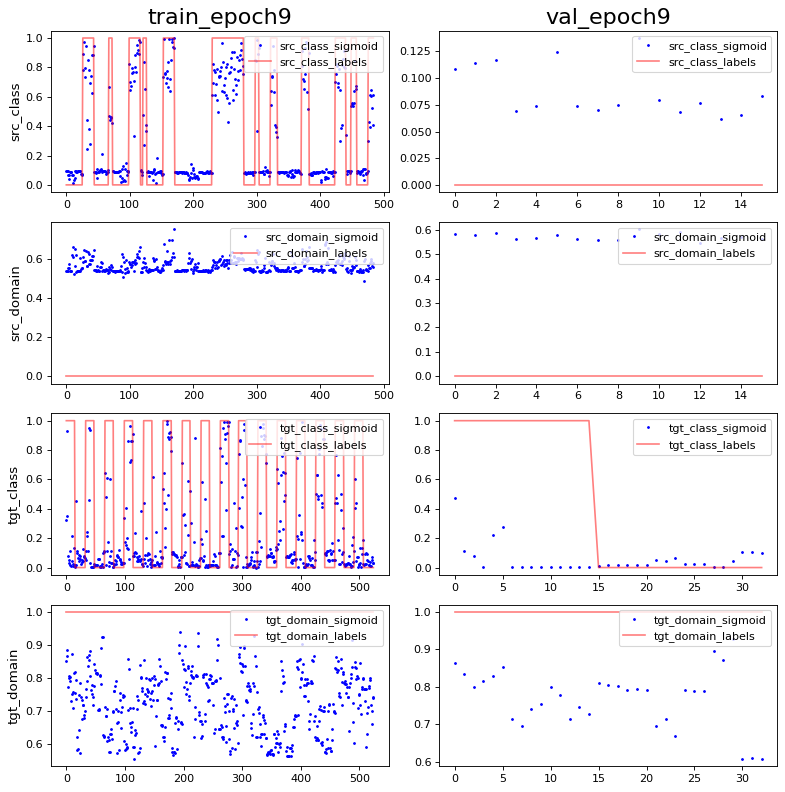

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 2.3081226e-09 1.0
PCA var: [60.9      69.2      75.7      79.1      81.4      83.3      84.8
 86.100006 87.200005 88.200005]
show standardize mean and std: -4.3250536e-09 1.0
PCA var: [71.9      82.9      86.700005 88.700005 90.600006 92.50001  93.700005
 94.8      95.700005 96.3     ]


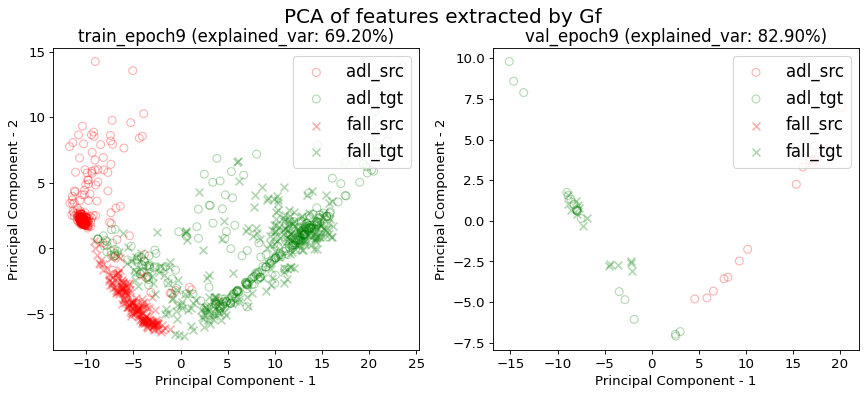

------------------------------Working on i_CV 7------------------------------
Working on get_UMAFall_loader...
train_data shape: (392, 3, 66)
val_data shape: (109, 3, 66)
Working on get_UPFall_loader...
train_data shape: (526, 3, 66)
val_data shape: (32, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.6071428571428571 0.9770408163265306 0.7959183673469388 0.37755102040816324
acc performance: 0.48623853211009177 0.9541284403669725 0.1743119266055046 0.07339449541284404


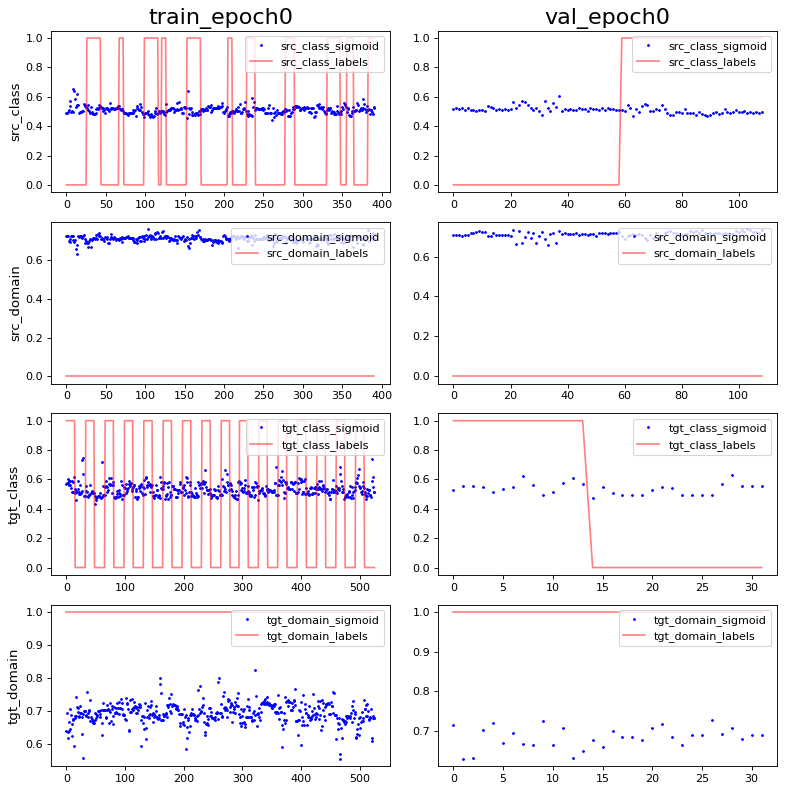

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: -1.3851479e-09 0.98952854
PCA var: [21.8      37.4      45.600002 51.600002 57.100002 60.4      63.100002
 65.4      67.200005 68.9     ]
show standardize mean and std: 1.5030328e-09 0.98952854
PCA var: [19.       33.5      43.3      52.1      57.199997 61.6      65.
 68.       70.5      72.7     ]


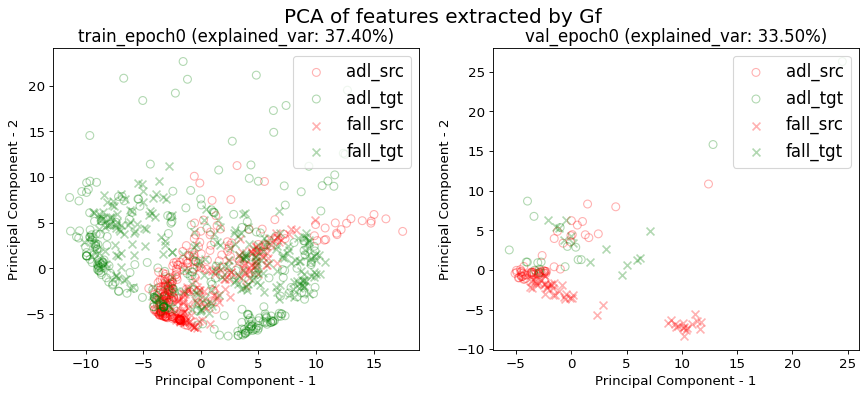

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


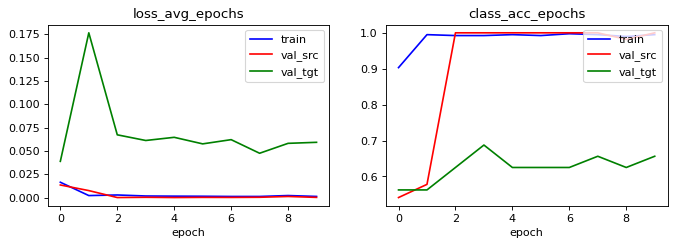

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.9872448979591837 0.8469387755102041 0.9923469387755102 1.0790816326530612
acc performance: 1.0 0.9724770642201835 0.1926605504587156 0.27522935779816515


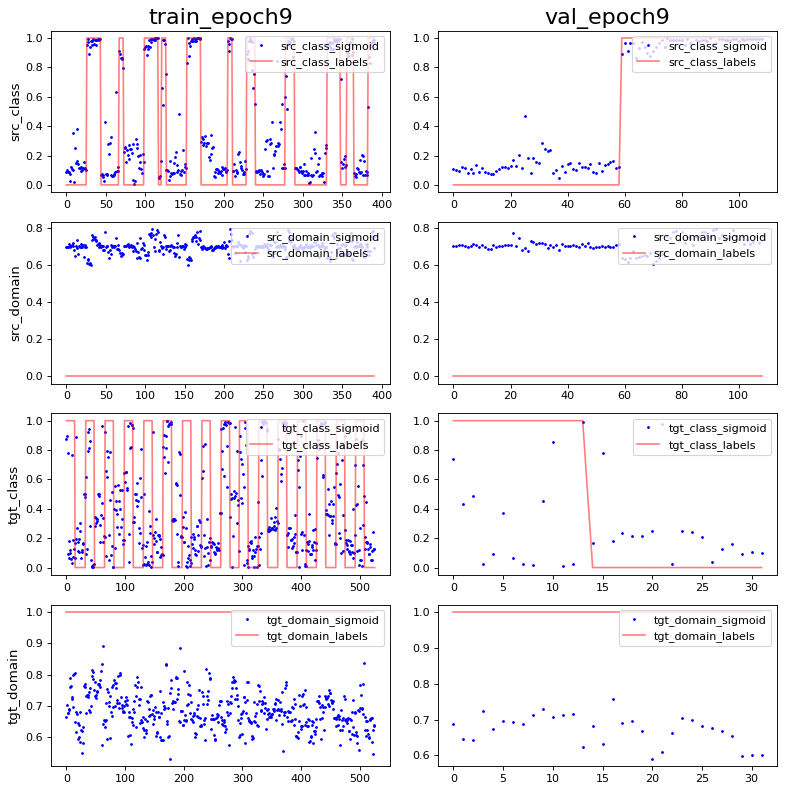

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 4.1554435e-09 0.99999994
PCA var: [60.000004 70.700005 77.600006 81.100006 83.40001  85.600006 87.200005
 88.600006 89.700005 90.50001 ]
show standardize mean and std: 6.0121312e-09 0.98952854
PCA var: [60.600002 76.8      81.8      84.600006 87.00001  88.700005 89.9
 90.8      91.600006 92.3     ]


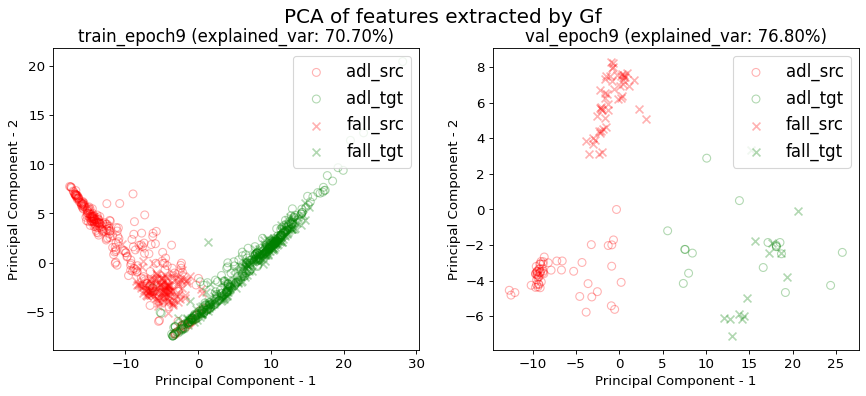

------------------------------Working on i_CV 8------------------------------
Working on get_UMAFall_loader...
train_data shape: (489, 3, 66)
val_data shape: (12, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.36809815950920244 0.0 0.49284253578732107 1.0613496932515338
acc performance: 0.0 0.0 1.25 2.75


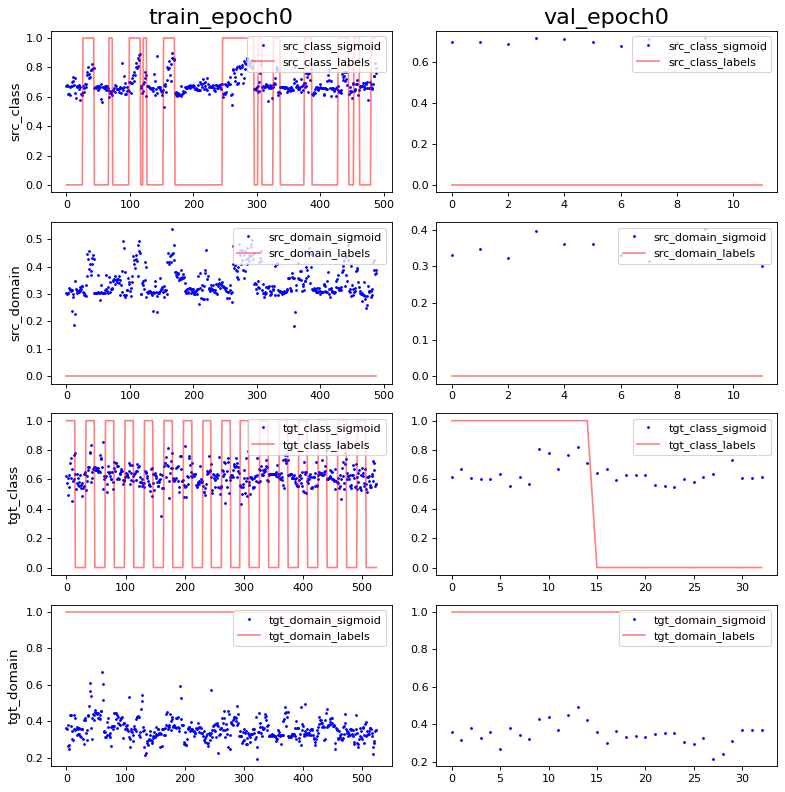

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: -8.3600643e-10 1.0
PCA var: [19.6      37.300003 44.100002 50.7      56.2      60.3      63.6
 65.9      67.9      69.700005]
show standardize mean and std: 4.709503e-09 1.0
PCA var: [25.7      40.       52.4      62.800003 71.5      76.       80.1
 83.299995 85.799995 88.2     ]


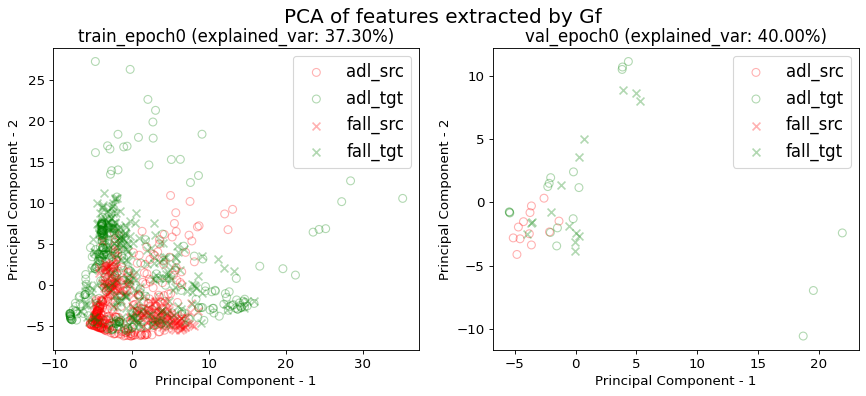

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


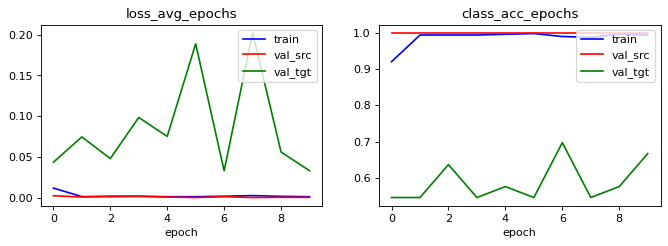

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.9959100204498977 0.024539877300613498 0.8650306748466258 1.0695296523517381
acc performance: 1.0 0.0 1.8333333333333333 2.75


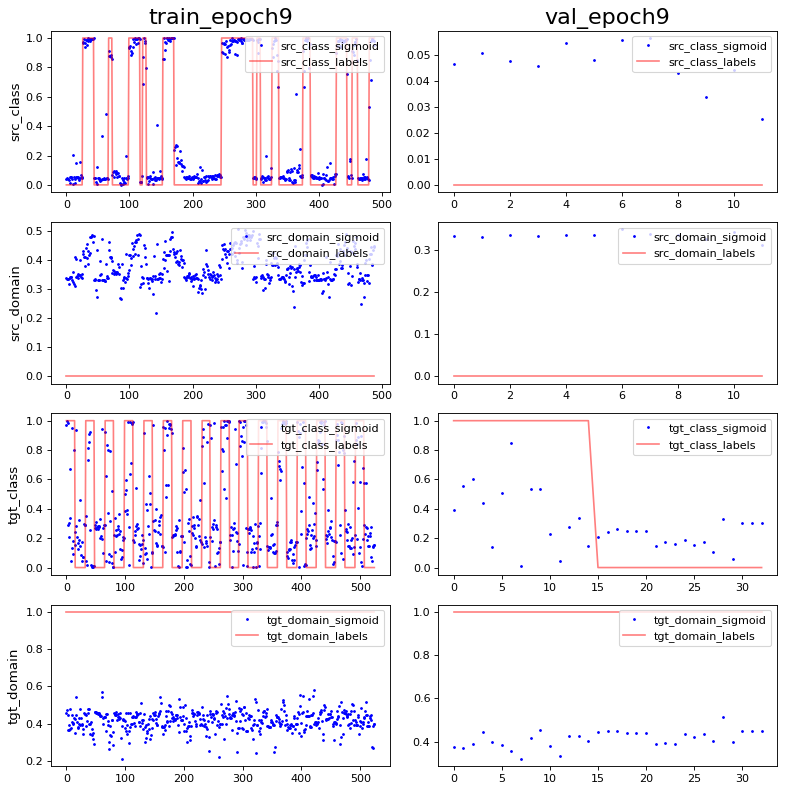

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 1.6720129e-09 1.0
PCA var: [53.399998 61.399998 68.399994 74.7      77.899994 80.799995 82.299995
 83.49999  84.49999  85.399994]
show standardize mean and std: -4.709503e-09 0.99303126
PCA var: [68.4      78.6      83.1      87.1      90.5      92.4      93.8
 95.       95.7      96.299995]


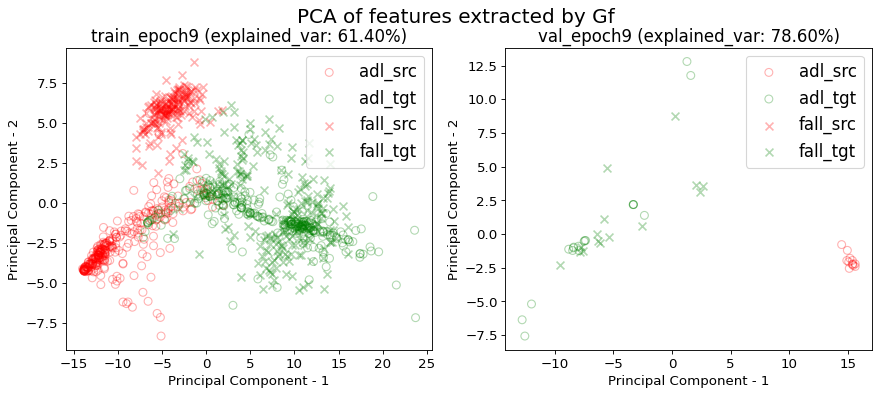

------------------------------Working on i_CV 9------------------------------
Working on get_UMAFall_loader...
train_data shape: (498, 3, 66)
val_data shape: (3, 3, 66)
Working on get_UPFall_loader...
train_data shape: (527, 3, 66)
val_data shape: (31, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.6385542168674698 0.9839357429718876 0.5783132530120482 0.03413654618473896
acc performance: 1.0 1.0 5.333333333333333 0.6666666666666666


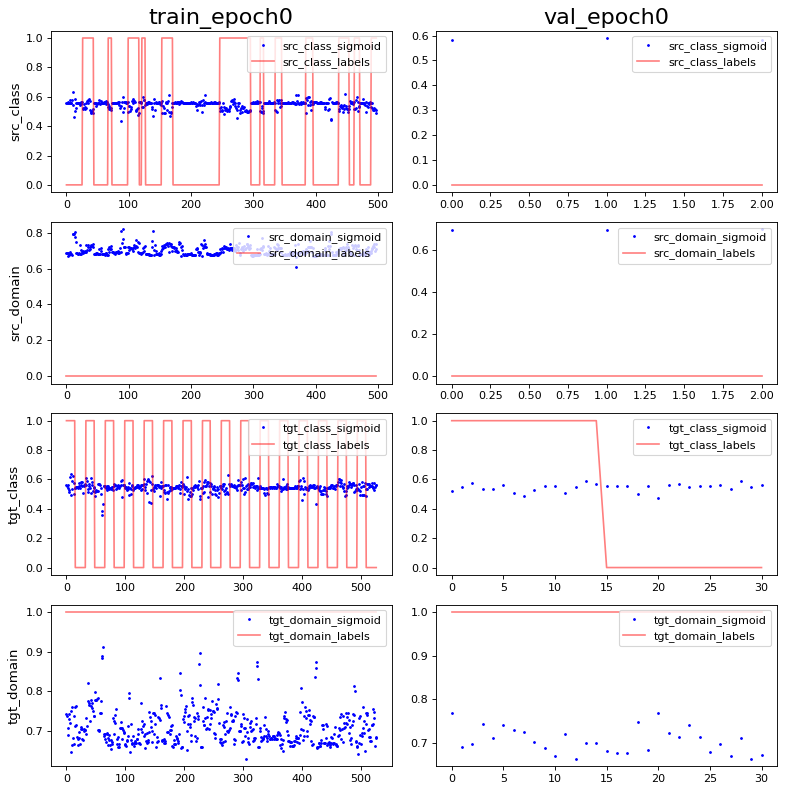

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: -5.4274146e-10 0.99303126
PCA var: [32.9      44.7      52.4      57.9      62.300003 65.8      68.4
 70.6      72.7      74.399994]
show standardize mean and std: -4.6748743e-09 0.98952854
PCA var: [32.  54.5 62.1 68.2 73.7 77.5 81.1 84.4 86.9 89.1]


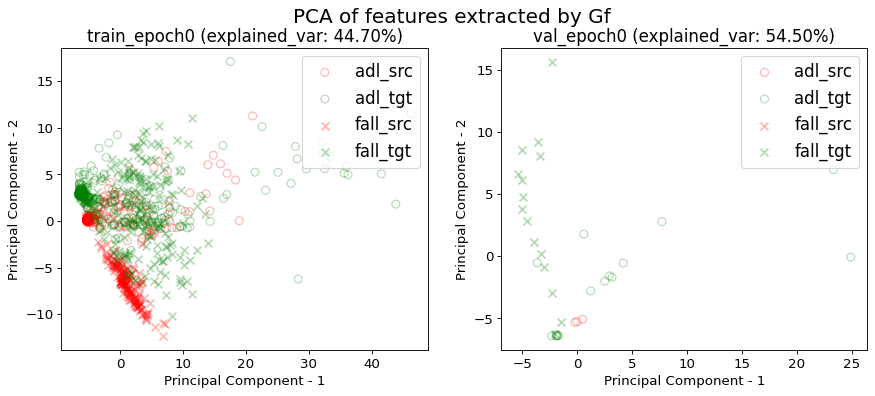

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


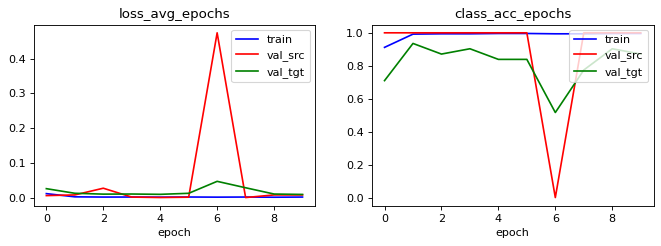

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.9939759036144579 1.0 0.7409638554216867 0.0
acc performance: 1.0 1.0 9.0 0.0


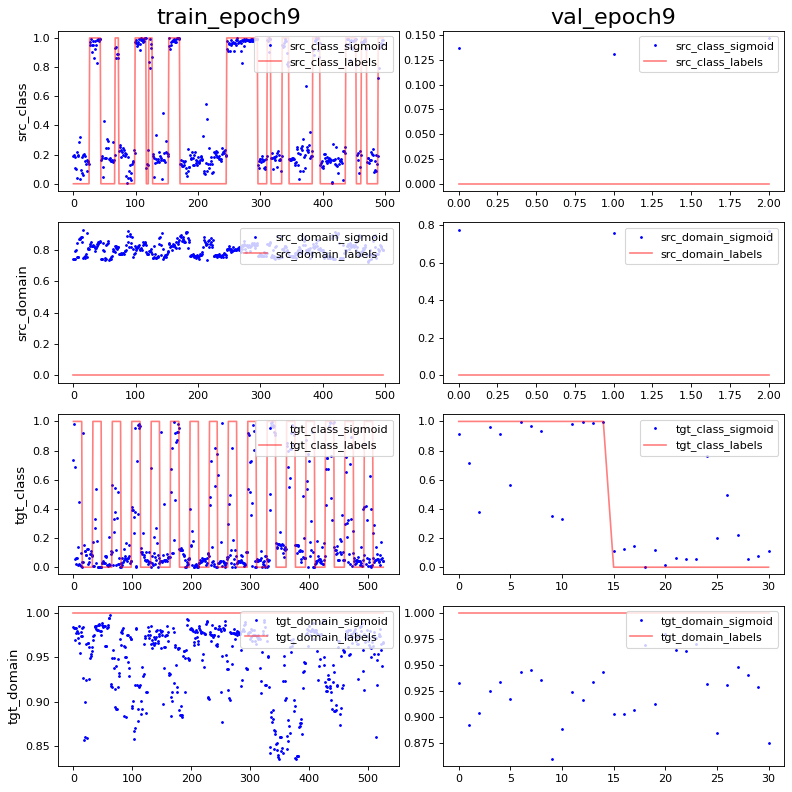

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 5.375725e-09 0.9965217
PCA var: [64.700005 71.00001  75.200005 77.8      79.8      81.5      83.1
 84.6      86.       87.2     ]
show standardize mean and std: 0.0 0.9354144
PCA var: [52.2      75.3      80.700005 84.3      87.3      89.5      91.5
 93.2      94.7      95.7     ]


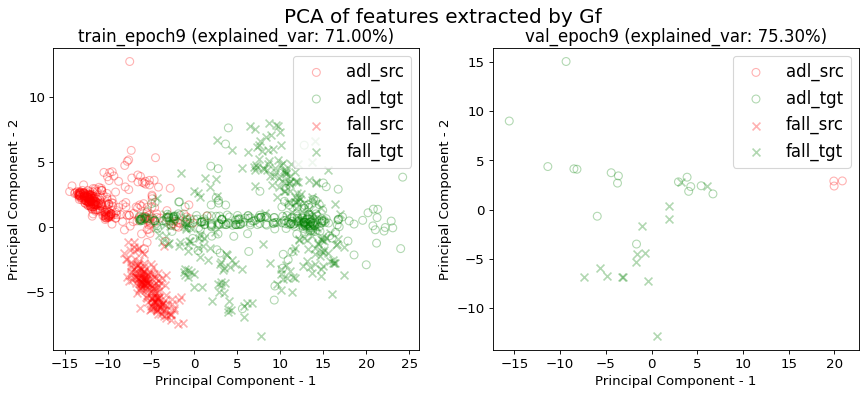

------------------------------Working on i_CV 10------------------------------
Working on get_UMAFall_loader...
train_data shape: (492, 3, 66)
val_data shape: (9, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.3556910569105691 0.9979674796747967 0.4959349593495935 0.0
acc performance: 0.6666666666666666 1.0 1.6666666666666667 0.0


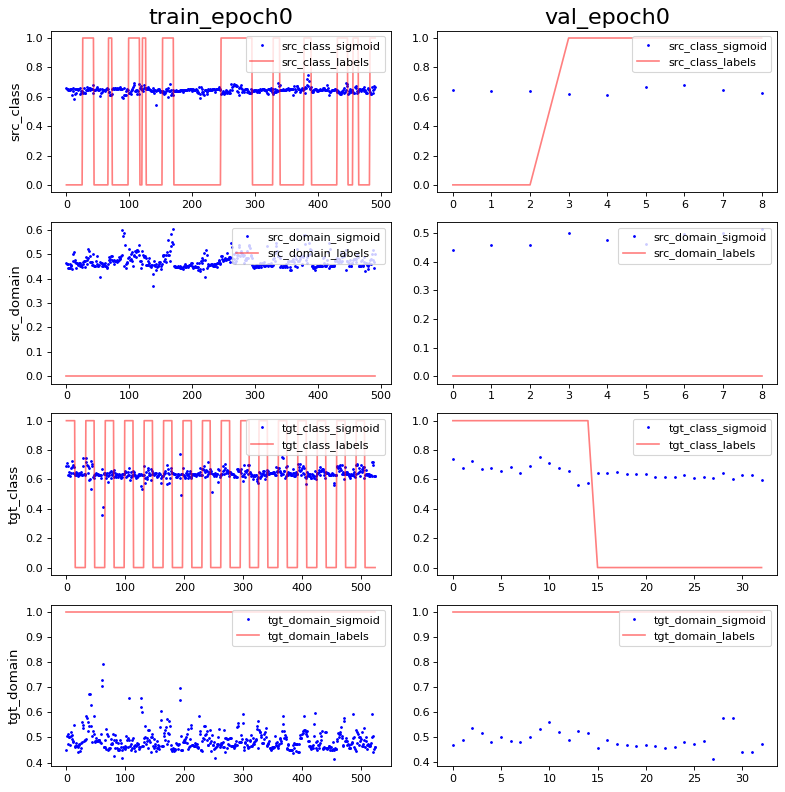

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 2.6048135e-09 0.9930313
PCA var: [25.099998 38.199997 44.299995 48.599995 52.299995 55.399994 58.299995
 61.099995 63.499996 65.799995]
show standardize mean and std: -2.5229479e-09 0.99303126
PCA var: [26.       40.4      52.9      61.300003 68.100006 73.100006 77.600006
 80.8      83.3      85.5     ]


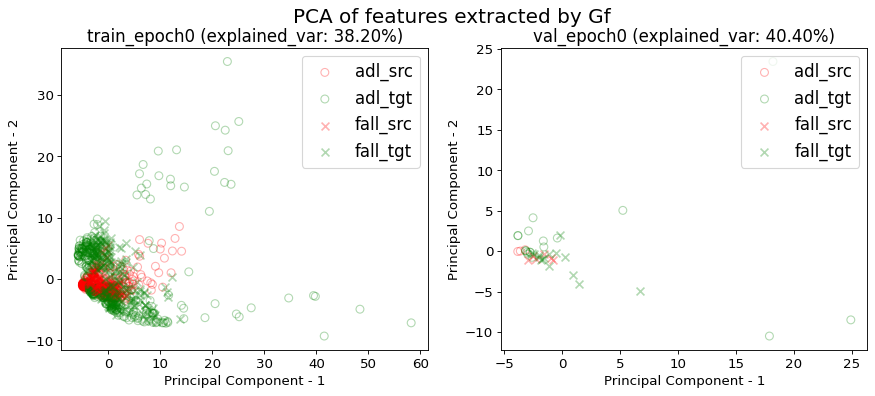

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


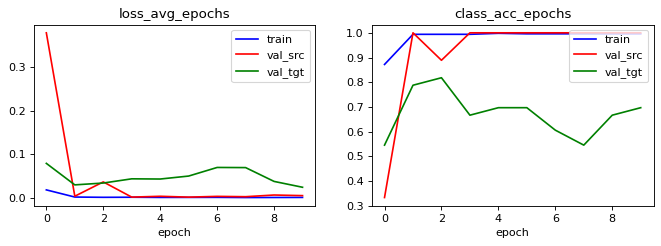

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.983739837398374 0.9166666666666666 0.8008130081300813 0.8130081300813008
acc performance: 1.0 0.8888888888888888 2.5555555555555554 3.5555555555555554


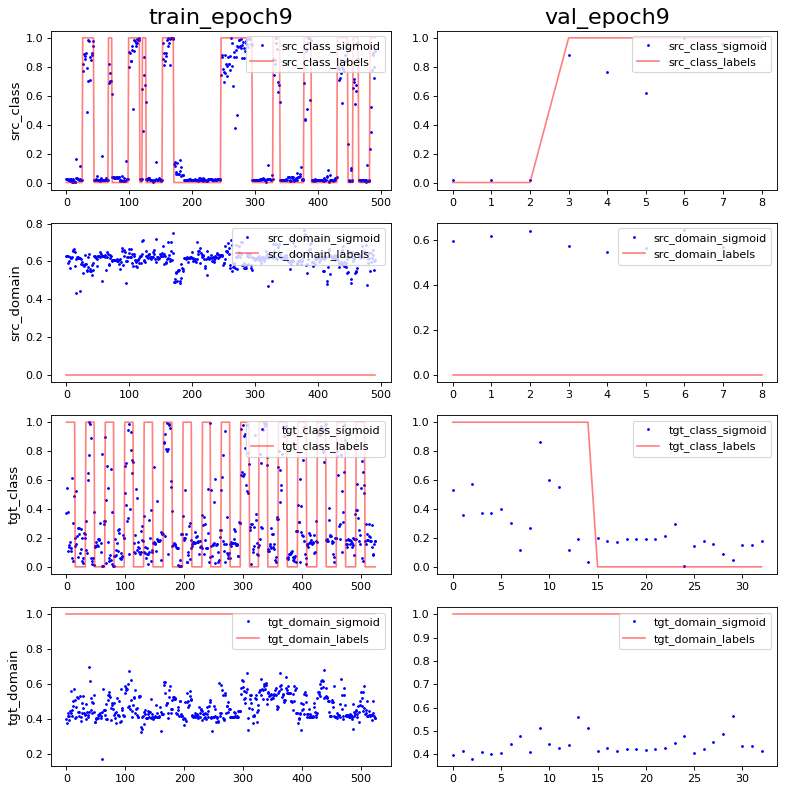

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: -4.1677017e-09 1.0
PCA var: [44.5      61.5      68.6      71.9      74.700005 77.200005 79.3
 81.200005 82.700005 84.00001 ]
show standardize mean and std: 0.0 1.0
PCA var: [56.4      68.9      75.6      80.5      84.3      87.200005 89.8
 91.600006 93.00001  94.100006]


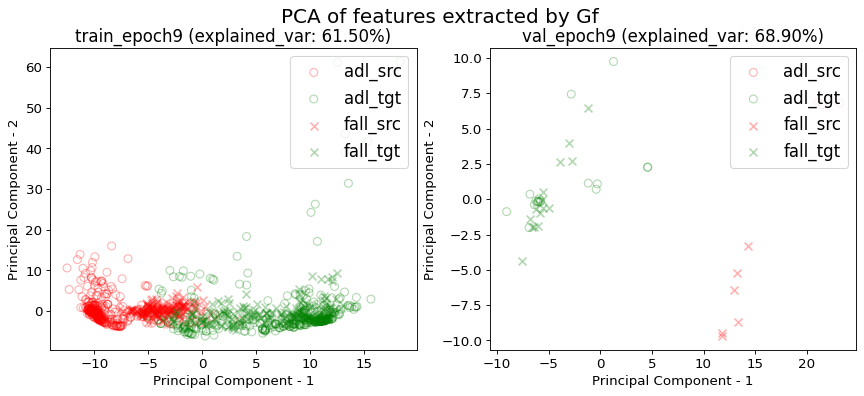

------------------------------Working on i_CV 11------------------------------
Working on get_UMAFall_loader...
train_data shape: (472, 3, 66)
val_data shape: (29, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.3580508474576271 0.9915254237288136 0.5063559322033898 0.01694915254237288
acc performance: 0.3793103448275862 1.0 0.5172413793103449 0.0


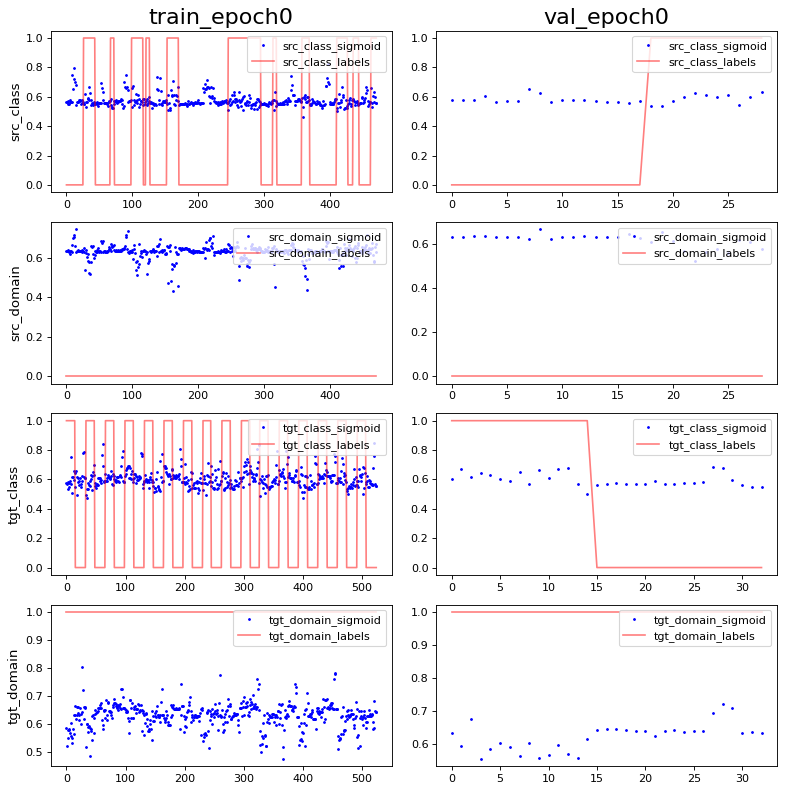

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 0.0 0.9930313
PCA var: [18.199999 32.5      42.6      48.699997 54.1      57.3      60.2
 62.7      64.8      66.600006]
show standardize mean and std: 5.1272813e-09 0.9860133
PCA var: [22.6      40.1      52.5      60.6      67.2      71.899994 75.49999
 78.59999  81.49999  84.19999 ]


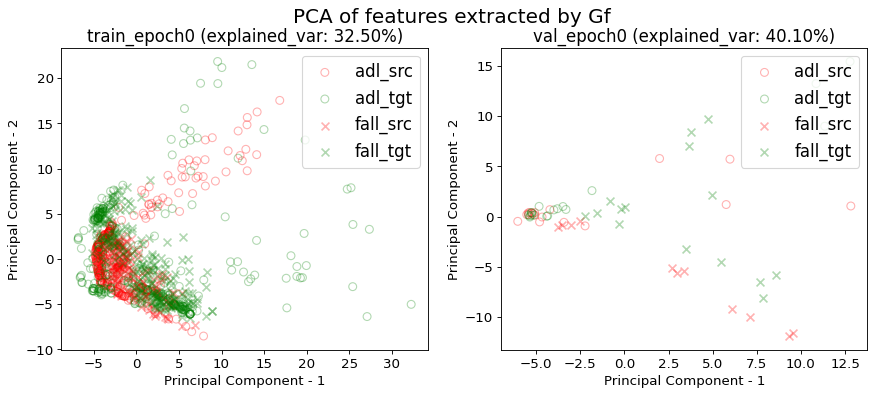

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


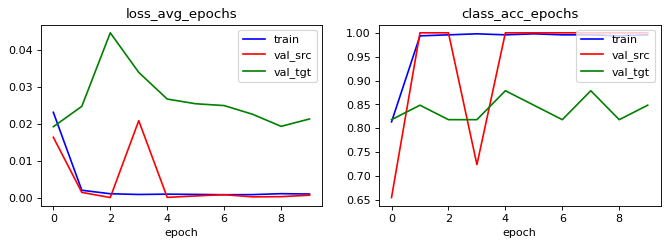

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.9978813559322034 1.0 0.8241525423728814 0.0
acc performance: 1.0 1.0 0.9655172413793104 0.0


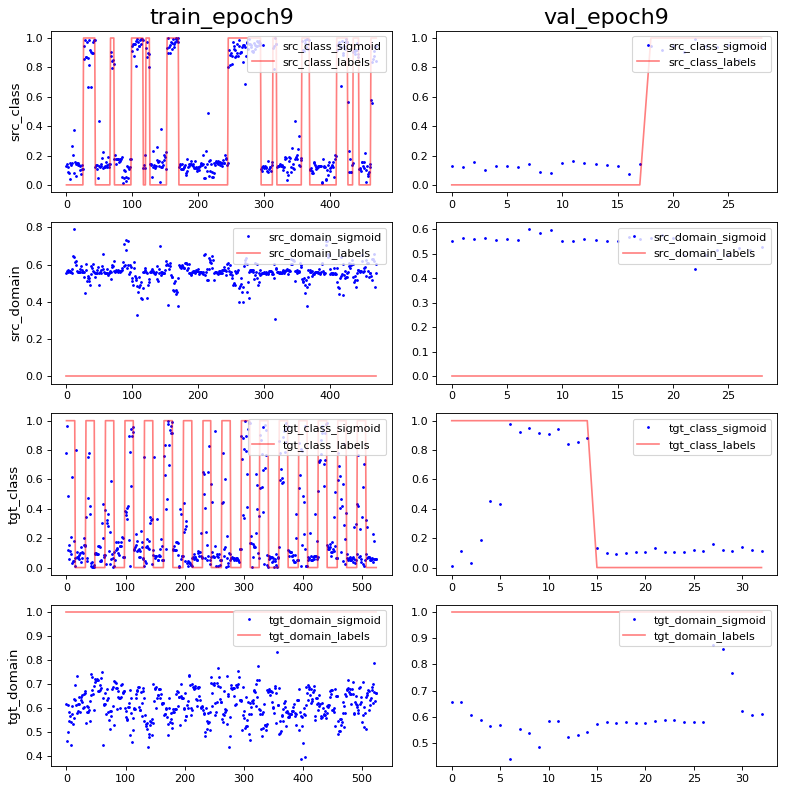

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: -4.2513064e-09 0.9999999
PCA var: [43.2      57.5      62.1      65.9      69.3      71.9      74.3
 76.3      78.200005 79.8     ]
show standardize mean and std: 3.4181875e-09 0.9860133
PCA var: [40.7 57.3 68.  76.4 80.5 84.  87.1 89.4 91.1 92.5]


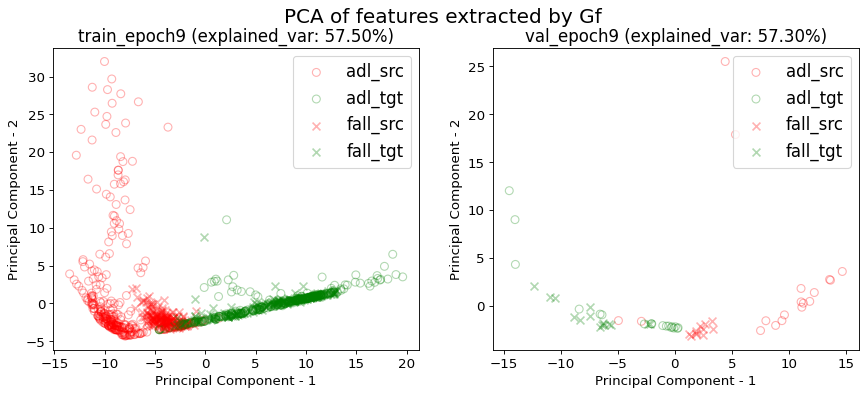

------------------------------Working on i_CV 12------------------------------
Working on get_UMAFall_loader...
train_data shape: (489, 3, 66)
val_data shape: (12, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.3128834355828221 0.012269938650306749 0.48057259713701433 1.0613496932515338
acc performance: 0.0 0.0 1.0 2.75


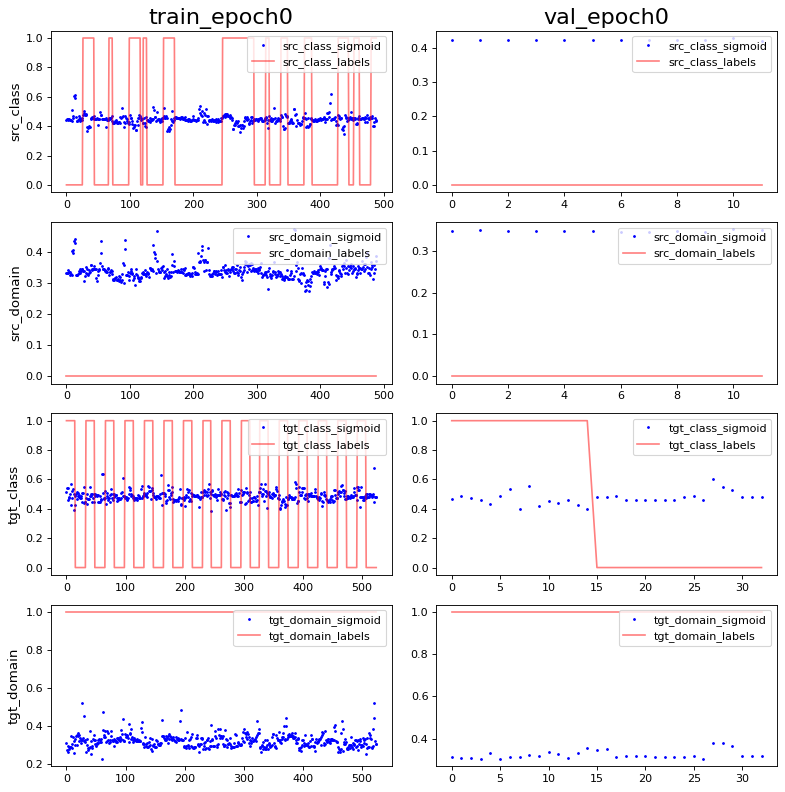

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 1.6720129e-09 0.98601323
PCA var: [22.7      37.8      45.2      50.800003 55.4      59.7      62.8
 64.9      67.       68.7     ]
show standardize mean and std: 4.709503e-09 0.9860133
PCA var: [26.800001 46.4      55.5      62.9      67.8      72.200005 76.00001
 79.50001  82.50001  85.00001 ]


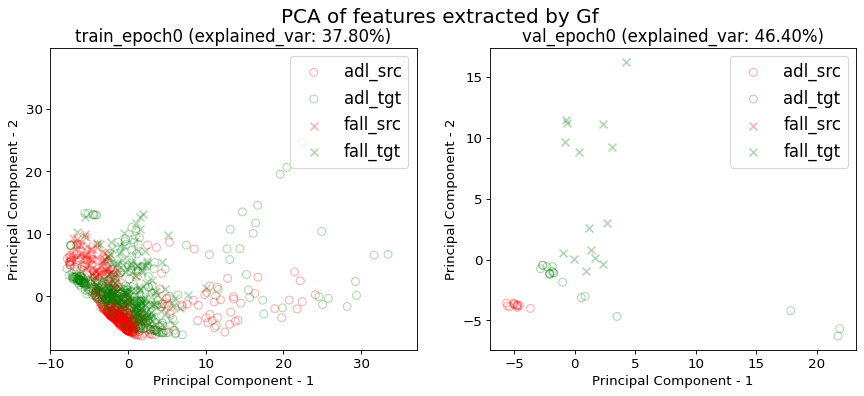

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


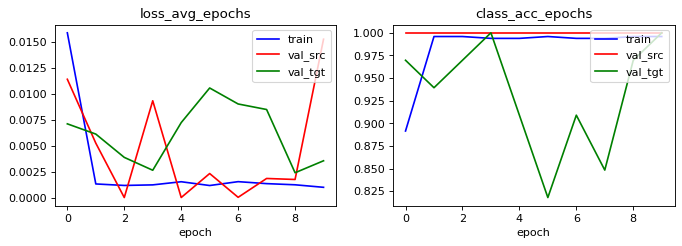

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.983640081799591 0.0 0.7955010224948875 1.0736196319018405
acc performance: 1.0 0.0 2.75 2.75


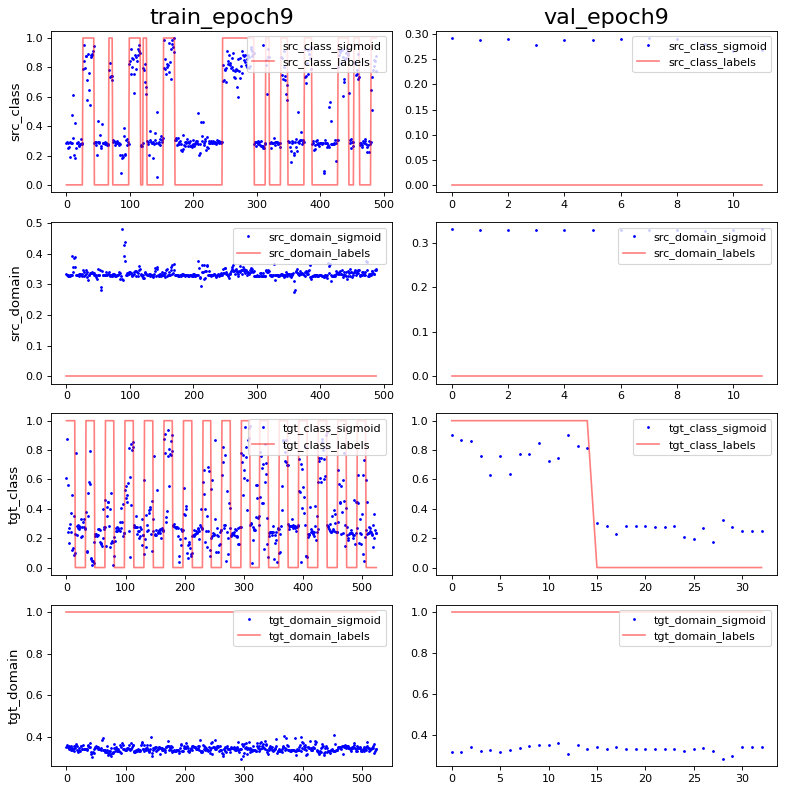

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 3.3440257e-09 1.0
PCA var: [59.600002 66.200005 72.3      76.100006 79.40001  82.30001  84.30001
 86.10001  87.70001  89.000015]
show standardize mean and std: 0.0 0.8936504
PCA var: [79.       84.8      88.700005 91.8      93.8      95.100006 96.100006
 96.90001  97.50001  98.00001 ]


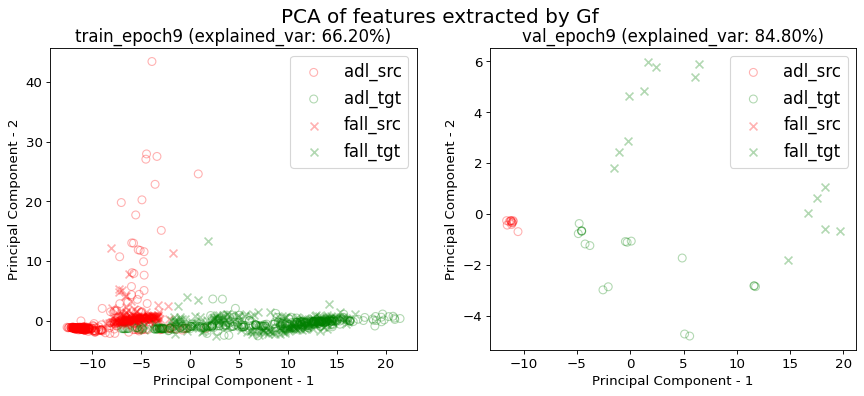

------------------------------Working on i_CV 13------------------------------
Working on get_UMAFall_loader...
train_data shape: (463, 3, 66)
val_data shape: (38, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.6371490280777538 0.8293736501079914 0.6177105831533477 0.2267818574514039
acc performance: 0.6842105263157895 0.7368421052631579 0.47368421052631576 0.3157894736842105


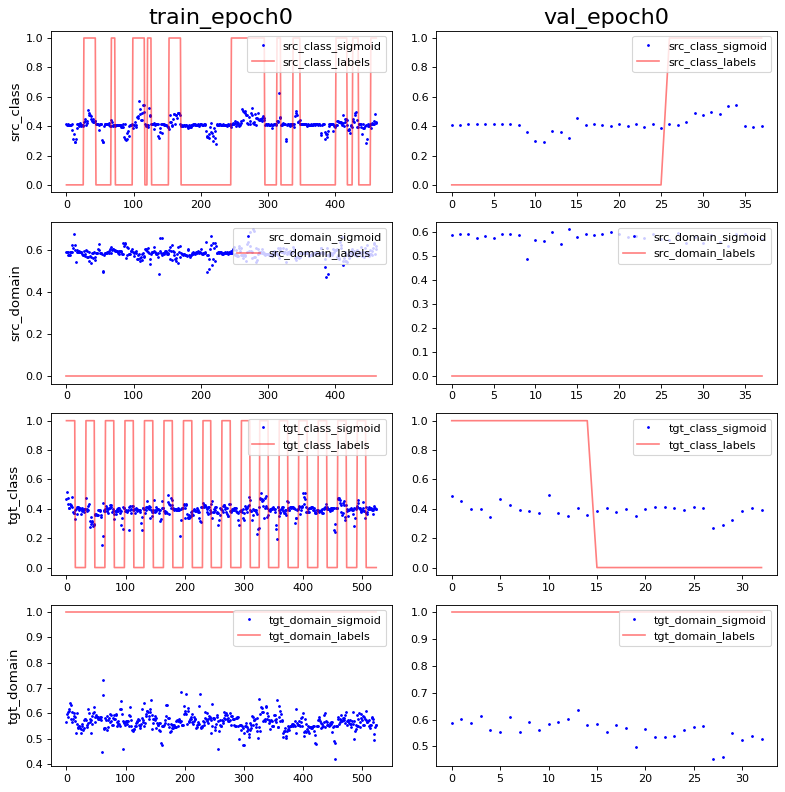

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 2.5740197e-09 0.9930313
PCA var: [26.800001 39.9      52.4      57.300003 60.800003 63.200005 65.50001
 67.50001  69.40001  71.100006]
show standardize mean and std: -5.969792e-09 0.99303126
PCA var: [17.5      33.6      46.8      53.699997 59.999996 64.2      67.799995
 71.299995 74.299995 76.899994]


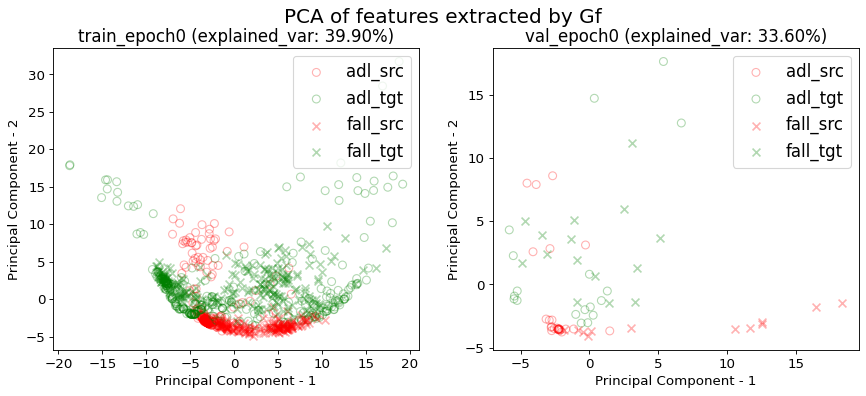

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


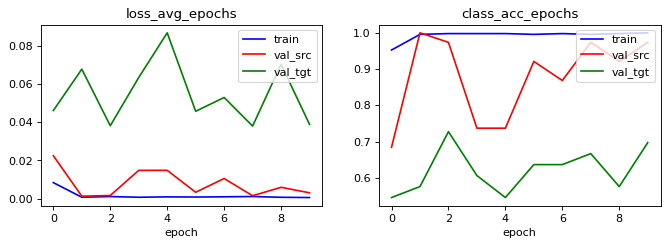

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.9935205183585313 0.5010799136069114 0.8358531317494601 0.10151187904967603
acc performance: 0.9736842105263158 0.4473684210526316 0.6052631578947368 0.07894736842105263


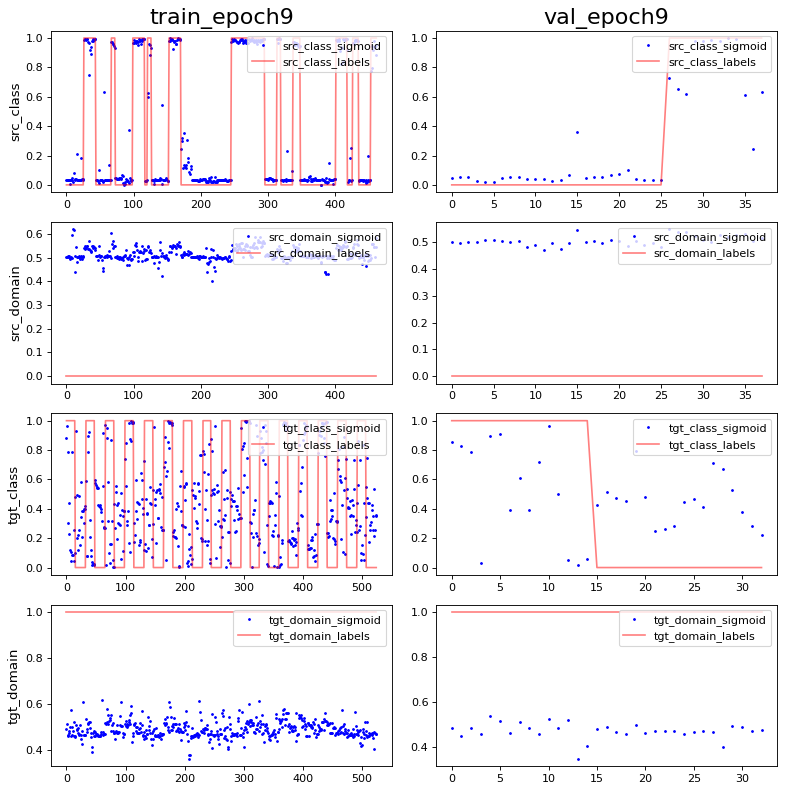

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 3.539277e-09 1.0
PCA var: [69.5      78.8      84.9      86.6      88.2      89.7      90.899994
 91.7      92.399994 92.99999 ]
show standardize mean and std: -2.984896e-09 0.9860133
PCA var: [81.       86.5      90.9      92.6      93.9      94.8      95.700005
 96.50001  97.100006 97.50001 ]


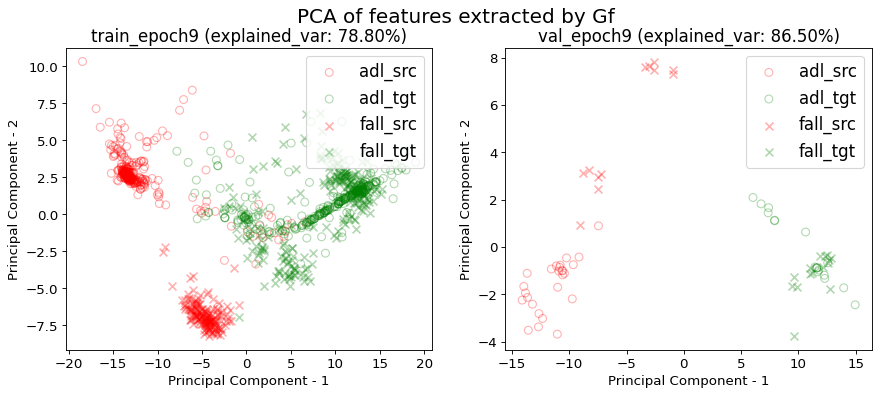

------------------------------Working on i_CV 14------------------------------
Working on get_UMAFall_loader...
train_data shape: (486, 3, 66)
val_data shape: (15, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.35802469135802467 0.0 0.4835390946502058 1.0802469135802468
acc performance: 0.0 0.0 1.0 2.2


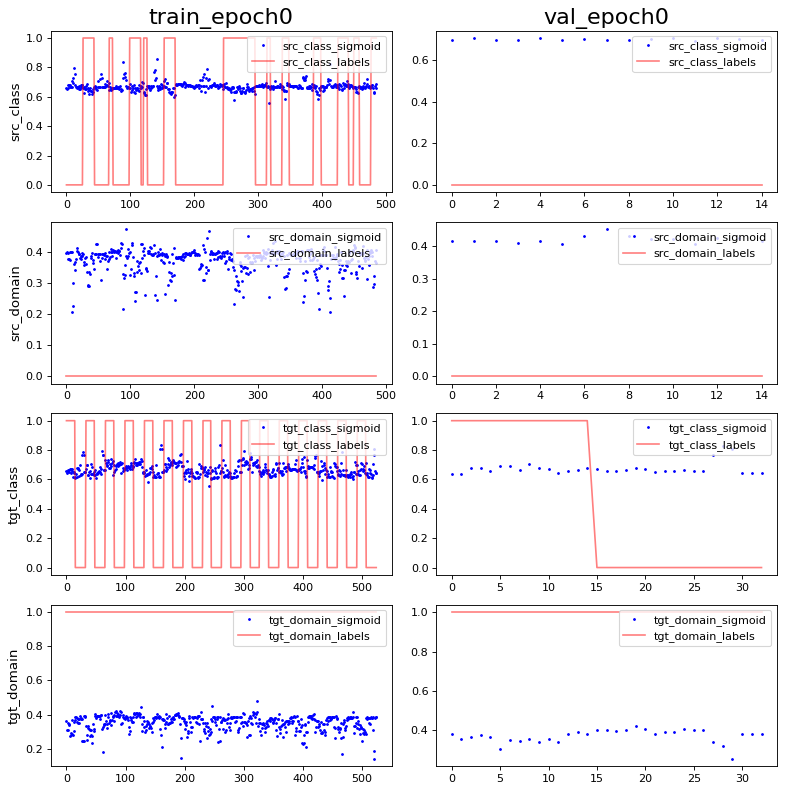

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: -3.3539487e-09 0.9965218
PCA var: [20.6      32.9      39.2      44.3      47.399998 50.499996 52.899998
 55.1      57.1      58.899998]
show standardize mean and std: -1.3245477e-08 0.9965218
PCA var: [33.6      49.4      59.100002 65.700005 71.50001  76.90001  80.20001
 83.000015 85.10001  86.80001 ]


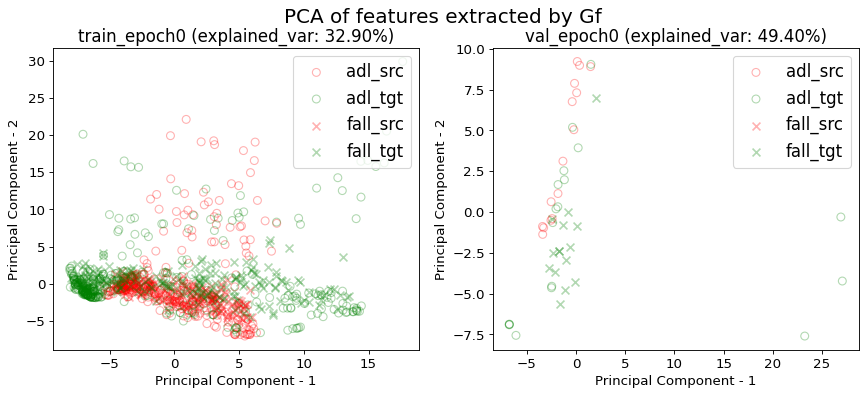

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


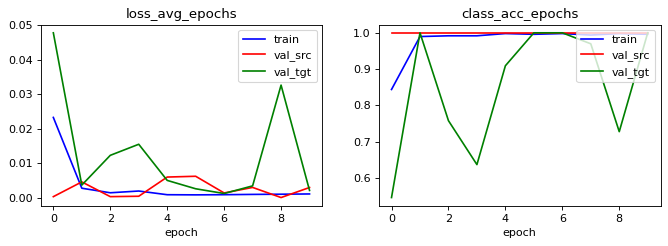

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.9979423868312757 0.012345679012345678 0.8415637860082305 1.0802469135802468
acc performance: 1.0 0.0 2.2 2.2


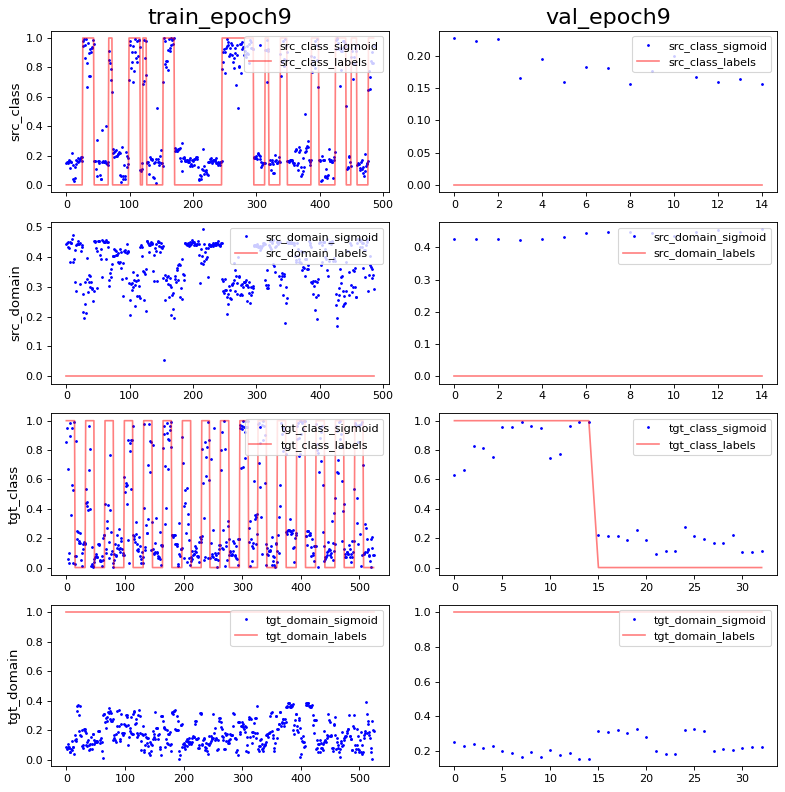

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 1.6769743e-09 0.9895285
PCA var: [47.       60.4      65.700005 69.200005 71.4      73.5      75.4
 77.1      78.6      80.      ]
show standardize mean and std: 1.1037897e-09 0.98952854
PCA var: [54.2      68.       74.7      80.1      85.299995 88.399994 90.799995
 92.399994 93.59999  94.69999 ]


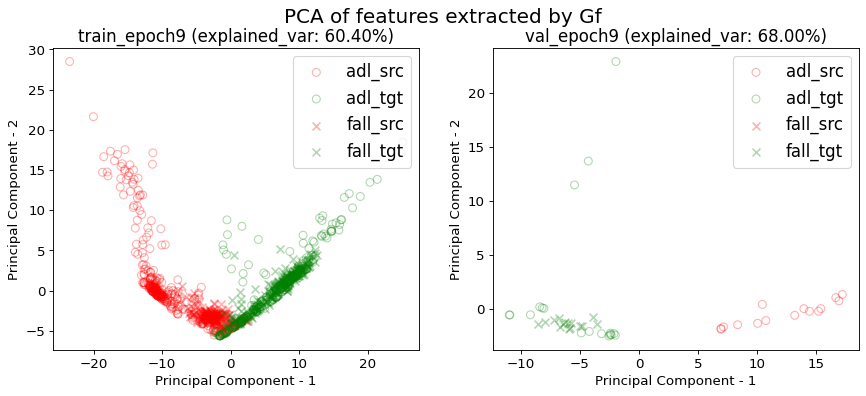

------------------------------Working on i_CV 15------------------------------
Working on get_UMAFall_loader...
train_data shape: (458, 3, 66)
val_data shape: (43, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.36026200873362446 0.9759825327510917 0.5 0.5327510917030568
acc performance: 0.4186046511627907 0.9534883720930233 0.3488372093023256 0.27906976744186046


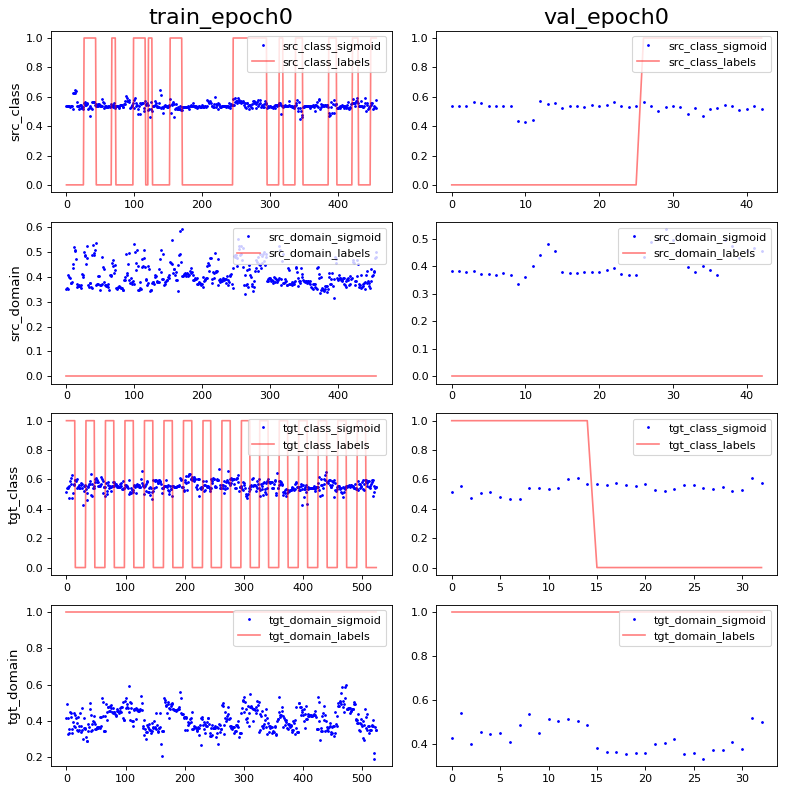

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 5.6054104e-09 1.0
PCA var: [23.800001 36.100002 43.600002 50.100002 54.600002 58.9      61.800003
 64.3      66.3      68.100006]
show standardize mean and std: -3.4856518e-10 0.9965218
PCA var: [19.       31.8      43.1      52.       58.8      64.4      68.6
 72.       75.3      78.200005]


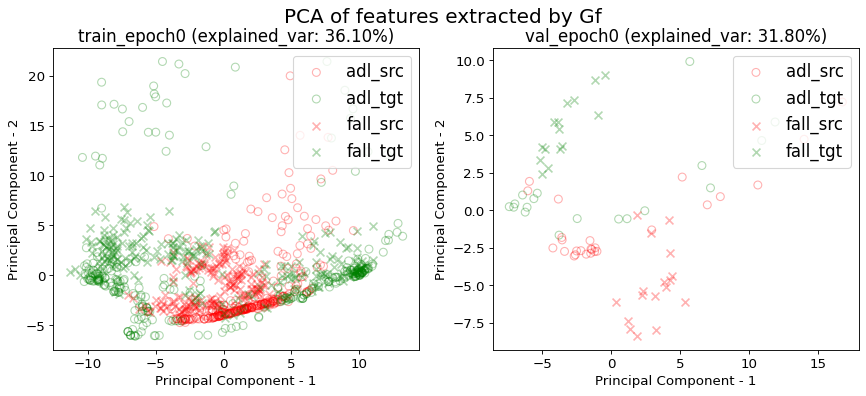

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


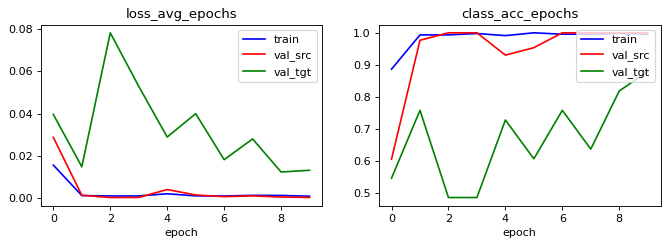

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 1.0 0.4344978165938865 0.9039301310043668 0.34934497816593885
acc performance: 1.0 0.4186046511627907 0.6744186046511628 0.23255813953488372


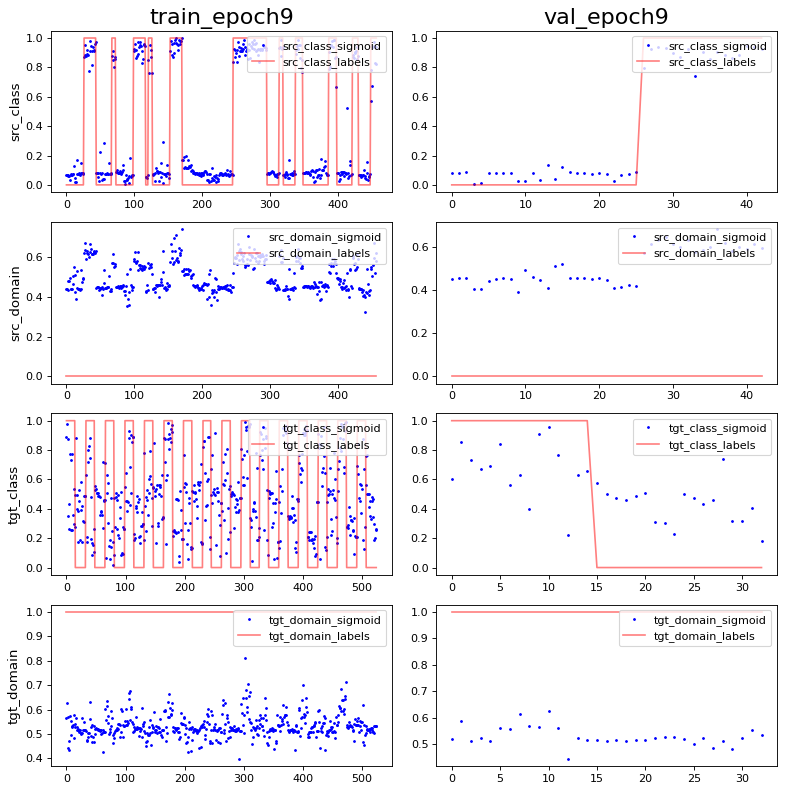

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 1.595386e-08 1.0
PCA var: [53.399998 63.899998 71.799995 77.899994 80.799995 82.899994 84.49999
 85.899994 86.899994 87.899994]
show standardize mean and std: 0.0 0.9965218
PCA var: [55.699997 68.7      77.6      83.       86.6      89.4      91.200005
 92.600006 93.50001  94.40001 ]


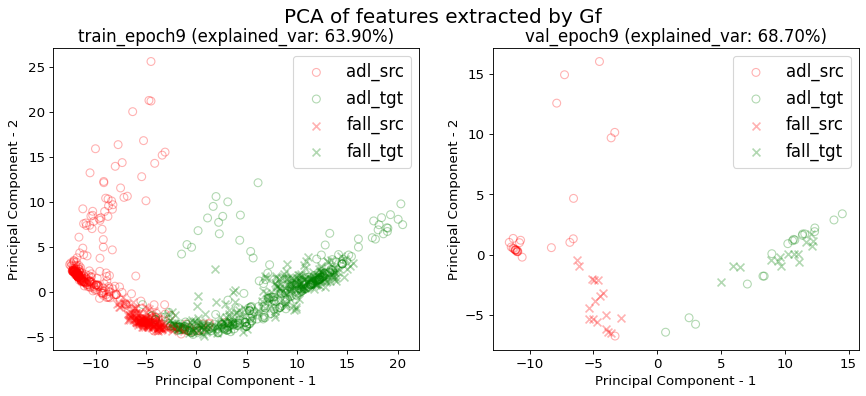

------------------------------Working on i_CV 16------------------------------
Working on get_UMAFall_loader...
train_data shape: (484, 3, 66)
val_data shape: (17, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 0.6342975206611571 0.9628099173553719 0.5702479338842975 0.1921487603305785
acc performance: 0.47058823529411764 1.0 0.9411764705882353 0.5294117647058824


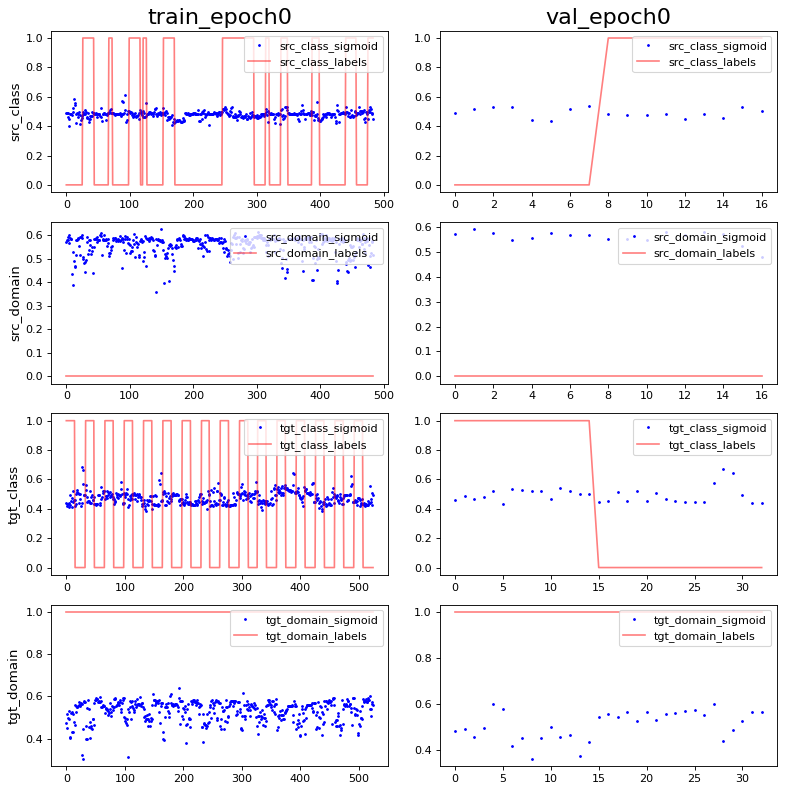

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 3.0455407e-09 0.9965218
PCA var: [29.300001 41.9      51.       56.5      60.9      63.7      65.8
 67.700005 69.4      70.9     ]
show standardize mean and std: 4.2385526e-09 0.9965218
PCA var: [31.3 46.9 58.9 65.5 70.7 74.5 78.  81.  83.3 85.4]


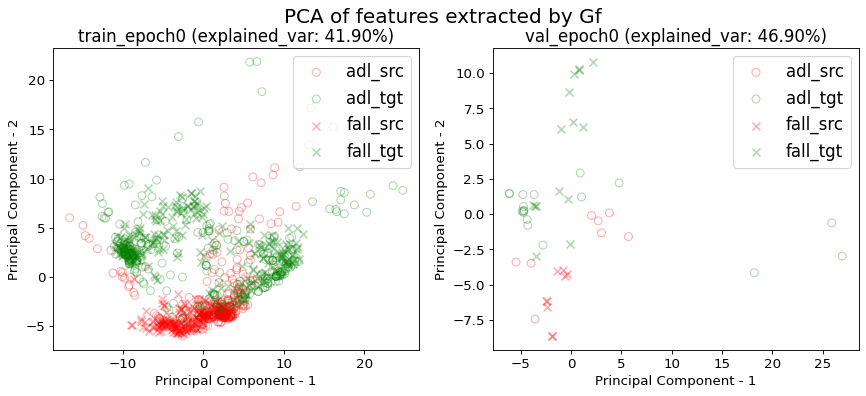

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/


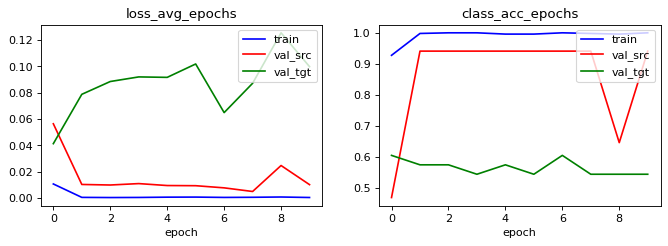

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
acc performance: 1.0 0.01859504132231405 0.6942148760330579 1.084710743801653
acc performance: 0.9411764705882353 0.0 1.0588235294117647 1.9411764705882353


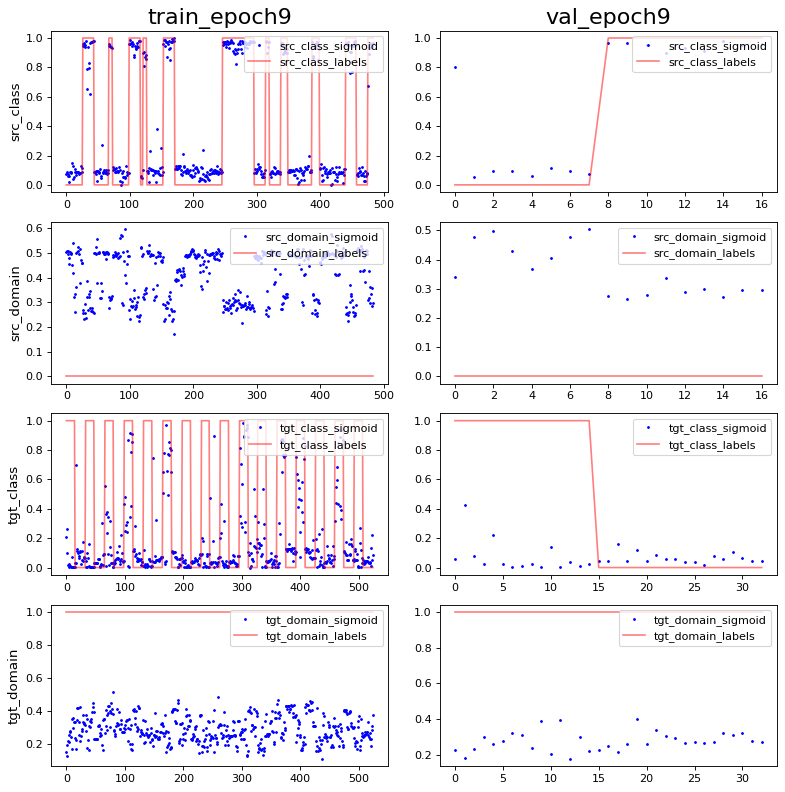

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/source/
show standardize mean and std: 1.6802983e-09 0.9965218
PCA var: [62.       73.       79.4      82.200005 84.200005 86.00001  87.40001
 88.70001  89.80001  90.70001 ]
show standardize mean and std: 0.0 0.9965218
PCA var: [68.5      80.2      85.799995 88.799995 91.2      93.5      94.5
 95.4      96.1      96.799995]


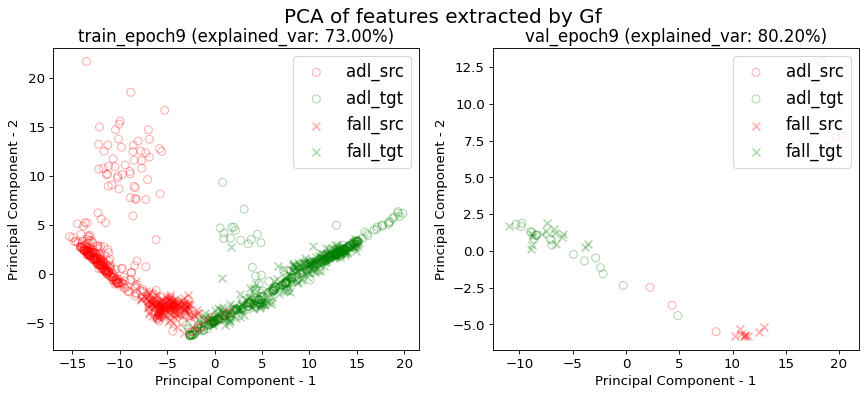

---------------Exporting model performance---------------
show df_performance


,i_CV,train_loss,train_acc,val_loss,val_acc,tgt_val_loss,tgt_val_acc
0,0.000000,0.001302,0.995624,0.001070,0.977273,0.103943,0.545455
1,1.000000,0.001186,0.995763,0.006434,0.827586,0.047370,0.606061
2,2.000000,0.001098,0.995910,0.000074,1.000000,0.068431,0.666667
3,3.000000,0.000998,0.995736,0.000401,1.000000,0.018320,0.848485
4,4.000000,0.000954,0.997963,0.001065,1.000000,0.104897,0.515152
5,5.000000,0.000981,0.997812,0.004699,0.863636,0.006135,0.909091
6,6.000000,0.001129,0.995876,0.000807,1.000000,0.107011,0.575758
7,7.000000,0.001227,0.994898,0.000211,1.000000,0.059270,0.656250
8,8.000000,0.001031,0.993865,0.000201,1.000000,0.032975,0.666667
9,9.000000,0.001402,0.995984,0.007475,1.000000,0.008952,0.870968


src val loss: 0.0035±0.0043
src val acc: 0.9755±0.0517
tgt val loss: 0.0447±0.0387
tgt val acc: 0.7369±0.1613
--------------Exporting notebook parameters--------------
{'CV_n': 17, 'samples_n': 501, 'classes_n': 2, 'model_name': 'DannModel', 'dataset_name': 'UMAFall', 'num_epochs': 10, 'channel_n': 4, 'batch_size': 16, 'learning_rate': 0.01, 'sensor_loc': 'waist', 'date': '2020/04/05 08:13:02', 'input_dim': (16, 3, 66), 'output_dim': (16,)}

======================  train on target, val on target(source=UMAFall_waist to target=UPFall_wrist)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (457, 3, 66)
val_data shape: (44, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modelou

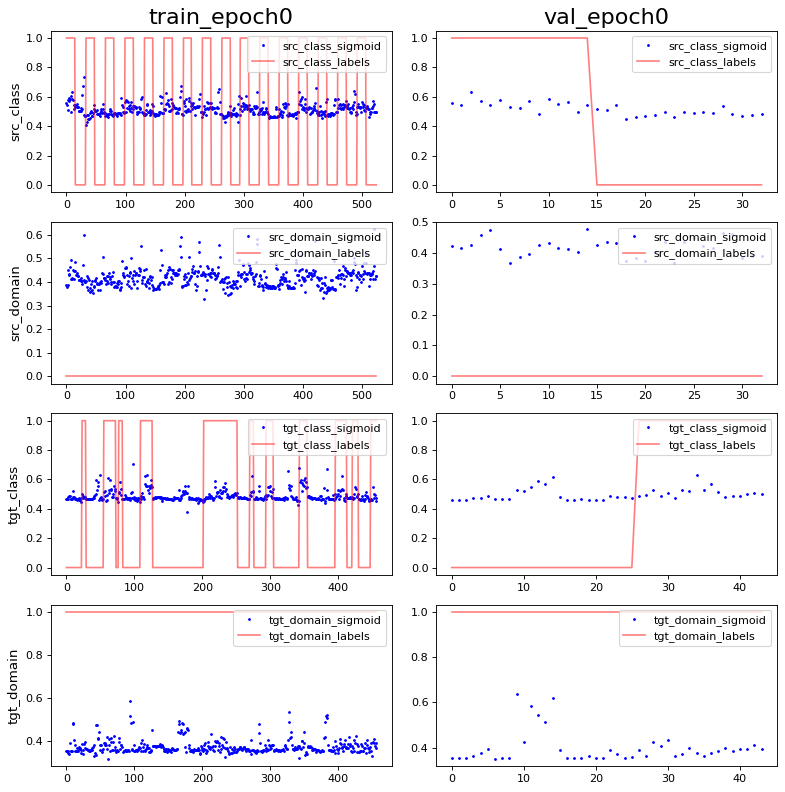

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 0.0 0.9895285
PCA var: [22.       38.4      46.7      51.3      54.8      57.899998 60.499996
 62.799995 64.799995 66.6     ]
show standardize mean and std: 0.0 0.98952854
PCA var: [26.800001 40.2      50.8      57.9      63.       67.7      71.7
 75.5      78.2      80.7     ]


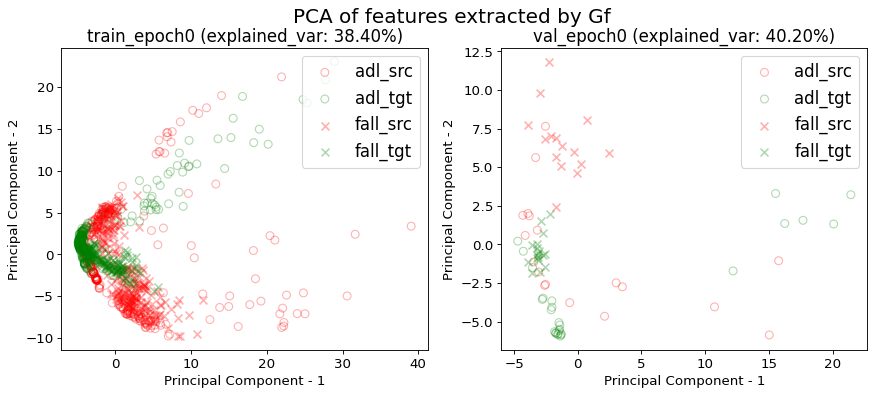

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


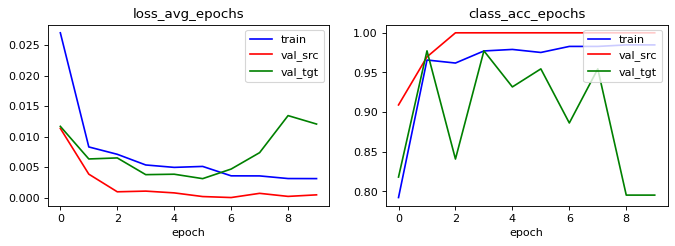

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.8933333333333333 0.5980952380952381 0.7104761904761905 0.8133333333333334
acc performance: 1.0 0.6363636363636364 1.0606060606060606 1.1515151515151516


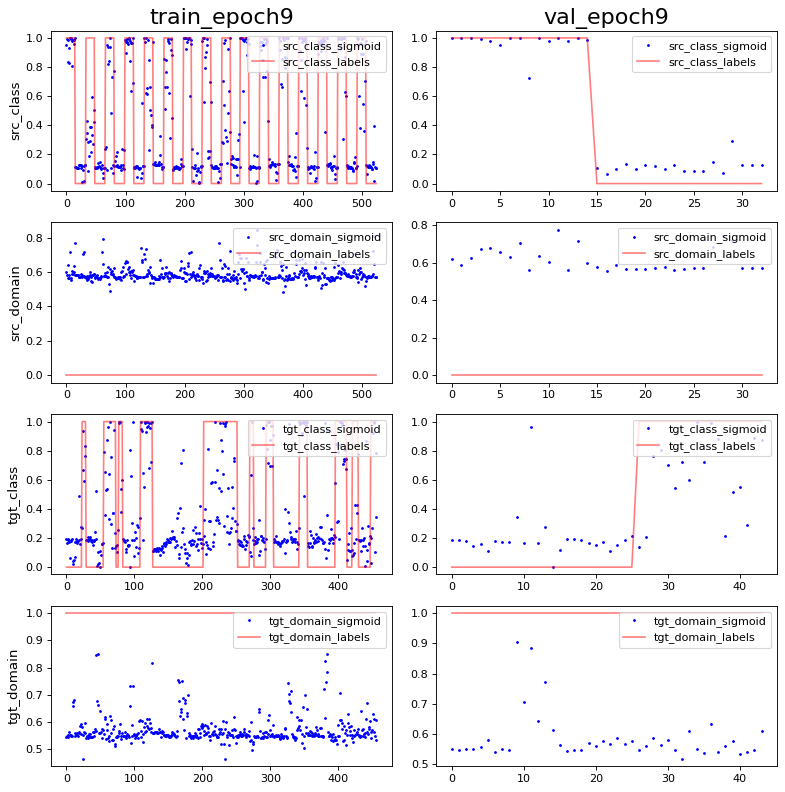

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -1.2948734e-09 0.9965218
PCA var: [44.9      54.800003 61.500004 65.9      68.9      71.3      73.5
 75.5      77.4      79.      ]
show standardize mean and std: -5.5046137e-09 0.99303126
PCA var: [51.5      63.2      71.3      76.5      80.4      83.700005 86.700005
 89.50001  91.40001  92.90001 ]


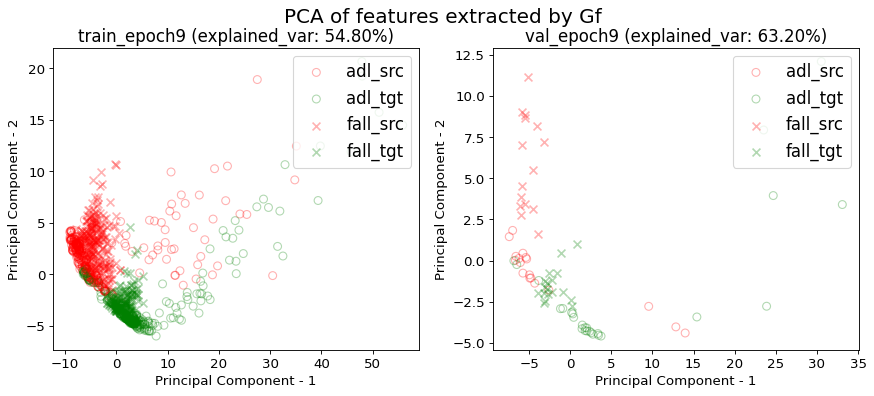

------------------------------Working on i_CV 1------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (472, 3, 66)
val_data shape: (29, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.5333333333333333 0.07428571428571429 0.56 0.8761904761904762
acc performance: 0.5151515151515151 0.15151515151515152 0.696969696969697 0.8787878787878788


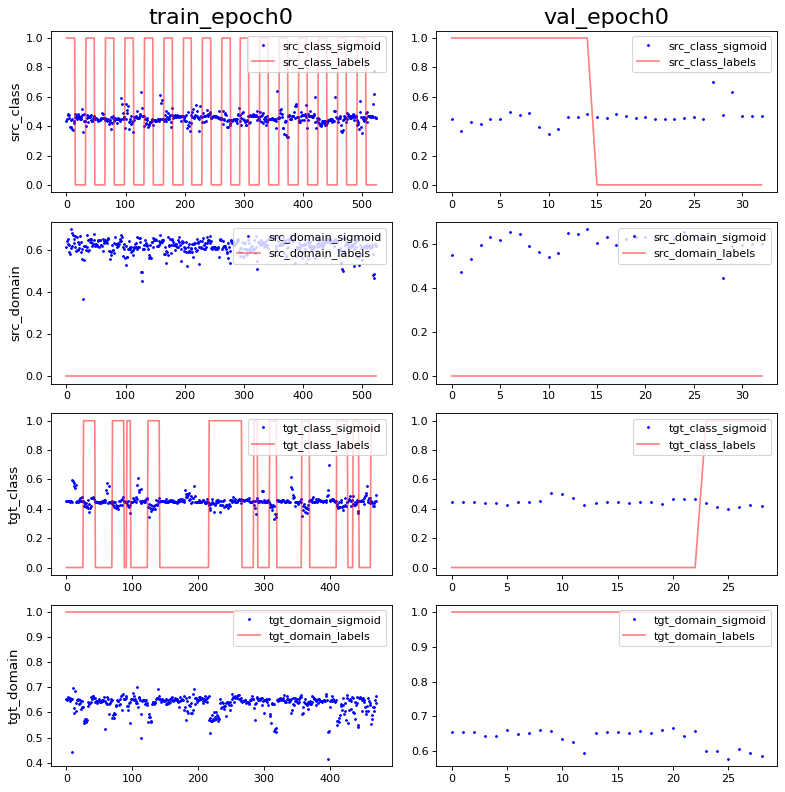

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 0.0 0.98952854
PCA var: [20.6      29.       36.6      42.1      46.899998 50.399998 53.6
 56.3      58.6      60.8     ]
show standardize mean and std: -4.2727344e-10 0.98952854
PCA var: [25.8      38.8      49.399998 57.899998 63.8      69.1      73.799995
 77.1      79.9      82.4     ]


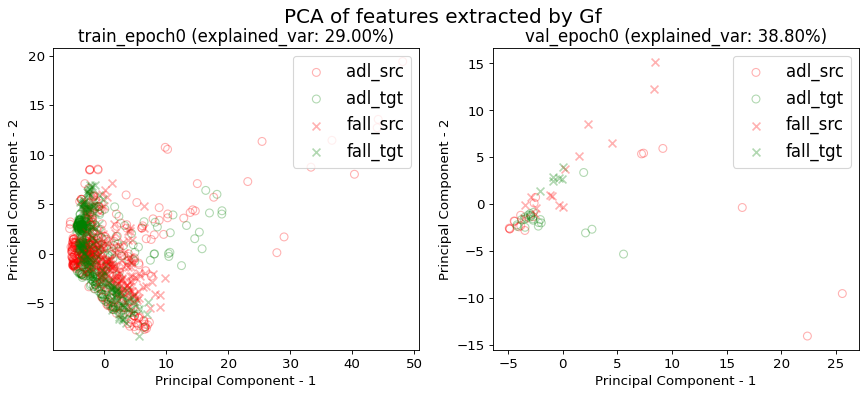

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


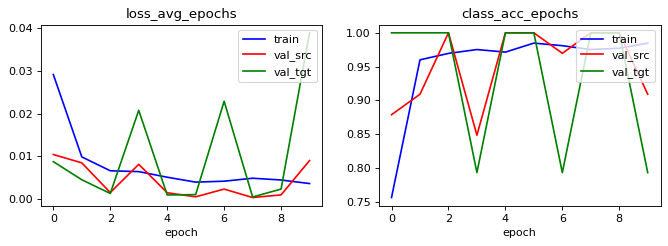

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.8114285714285714 0.1657142857142857 0.6171428571428571 0.6666666666666666
acc performance: 0.9090909090909091 0.12121212121212122 0.696969696969697 0.696969696969697


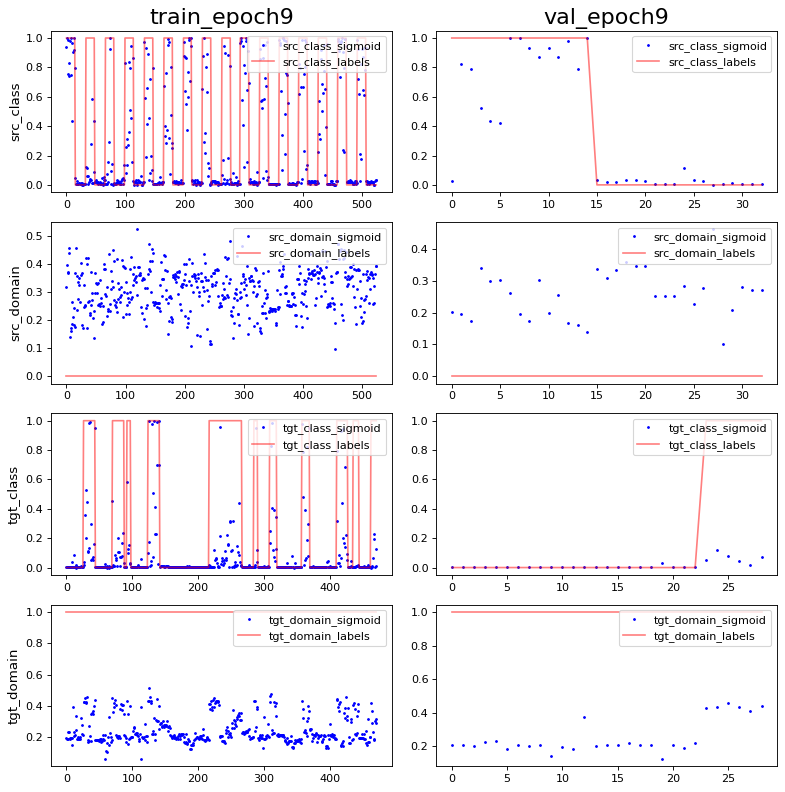

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 1.7005226e-09 0.95742714
PCA var: [52.999996 58.799995 63.399994 66.7      69.5      71.3      72.8
 74.3      75.600006 76.8     ]
show standardize mean and std: 8.545469e-10 0.8819171
PCA var: [50.4      64.3      75.100006 82.3      87.100006 90.90001  92.70001
 94.000015 95.10001  96.000015]


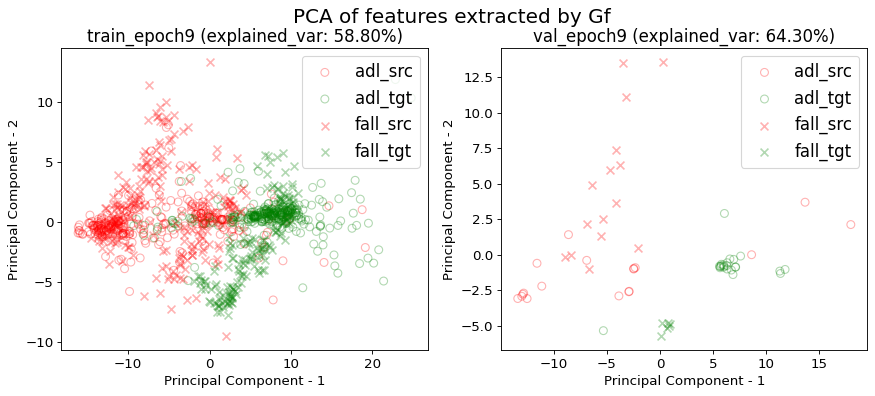

------------------------------Working on i_CV 2------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (489, 3, 66)
val_data shape: (12, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.46095238095238095 0.0038095238095238095 0.34285714285714286 0.9314285714285714
acc performance: 0.45454545454545453 0.0 0.0 0.36363636363636365


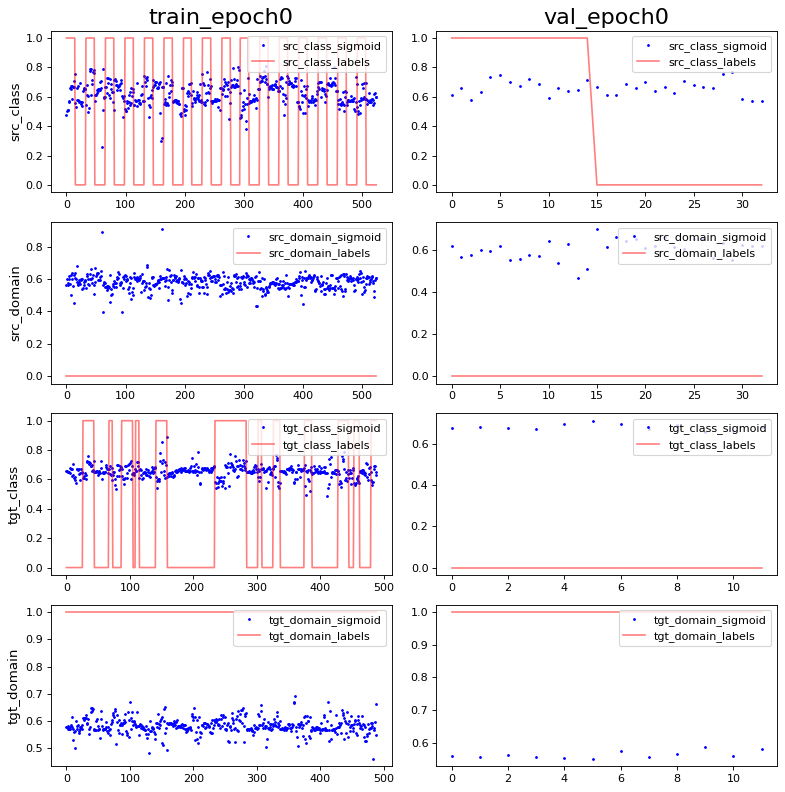

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -5.4340417e-09 1.0
PCA var: [19.8      36.699997 41.899998 46.8      51.2      55.       57.9
 60.2      62.100002 63.9     ]
show standardize mean and std: -4.709503e-09 0.9965218
PCA var: [18.5      36.4      46.5      54.5      60.7      65.5      69.6
 73.4      76.700005 79.700005]


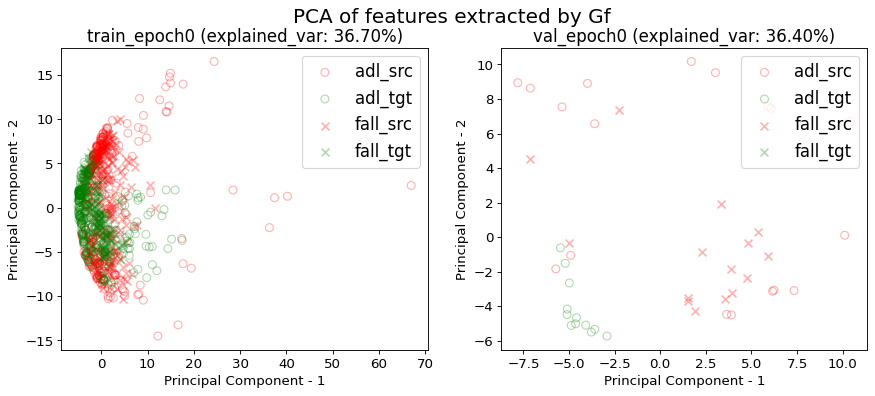

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


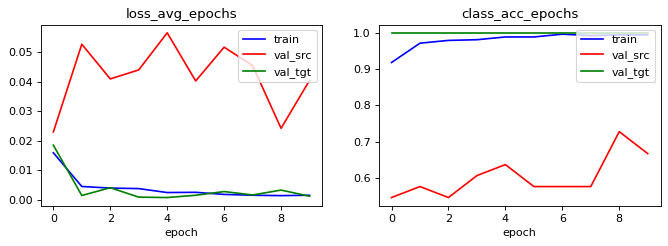

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 1.0 0.03619047619047619 0.8514285714285714 0.9295238095238095
acc performance: 0.6666666666666666 0.0 0.36363636363636365 0.36363636363636365


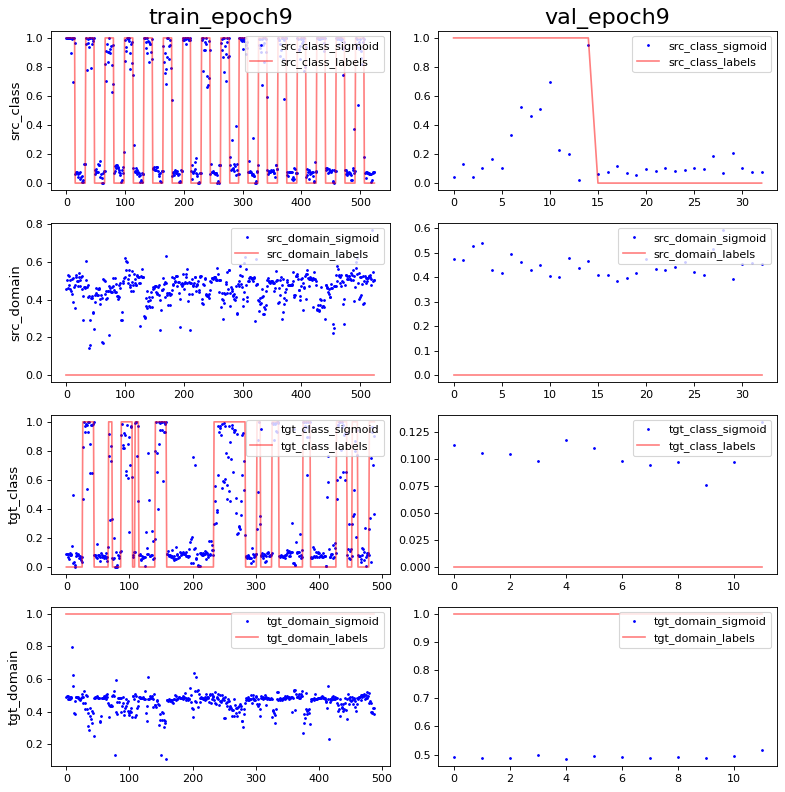

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 5.0160387e-09 1.0
PCA var: [35.7      46.7      54.       61.2      64.2      66.7      68.799995
 70.799995 72.799995 74.7     ]
show standardize mean and std: 0.0 0.9965218
PCA var: [33.5      51.9      63.5      70.9      76.       80.2      83.1
 85.7      87.799995 89.6     ]


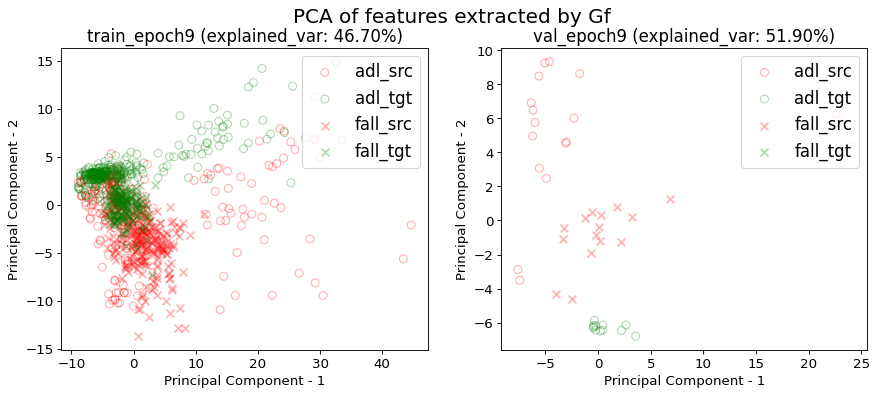

------------------------------Working on i_CV 3------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (469, 3, 66)
val_data shape: (32, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.41523809523809524 0.9333333333333333 0.32761904761904764 0.12571428571428572
acc performance: 0.3939393939393939 1.0 0.5757575757575758 0.8181818181818182


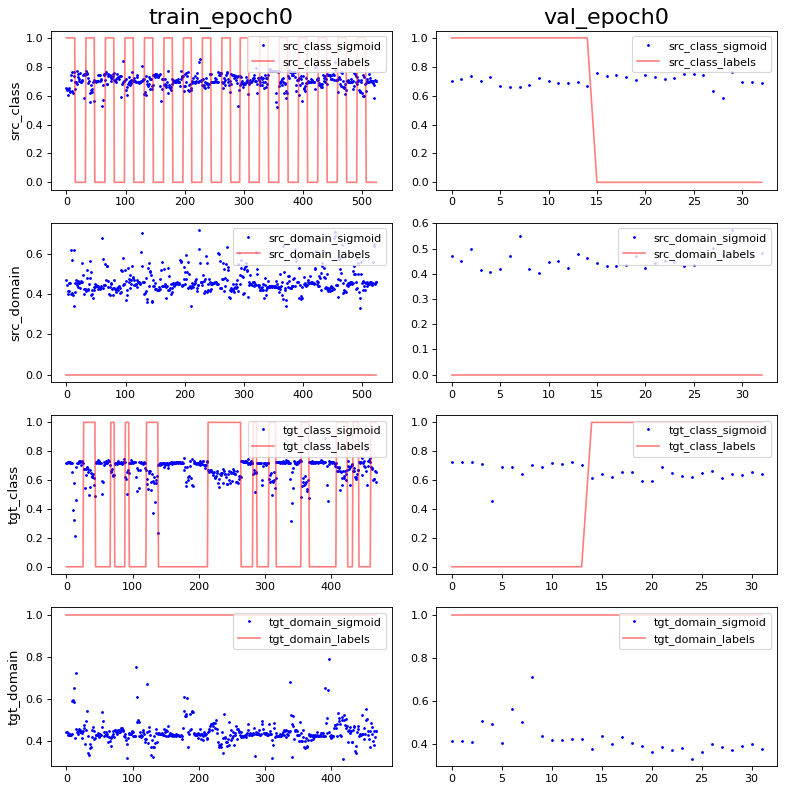

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 1.9188617e-09 0.9965217
PCA var: [32.       39.5      45.5      49.5      52.8      55.899998 58.8
 61.1      63.1      65.1     ]
show standardize mean and std: -6.52085e-09 0.98952854
PCA var: [35.600002 46.300003 54.4      61.100002 66.3      70.8      74.5
 77.7      80.399994 82.899994]


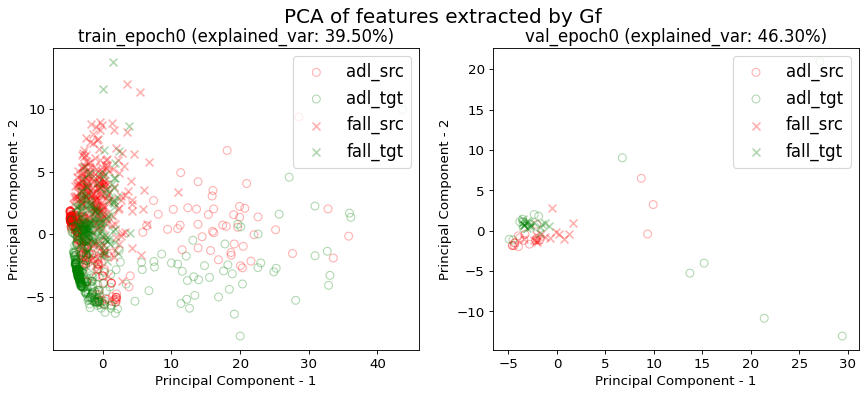

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


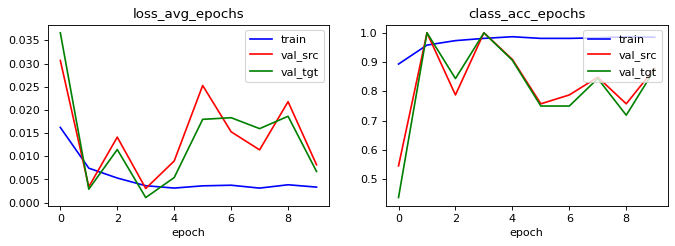

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.9638095238095238 0.2038095238095238 0.8247619047619048 0.8647619047619047
acc performance: 0.8787878787878788 0.0 0.8484848484848485 0.8787878787878788


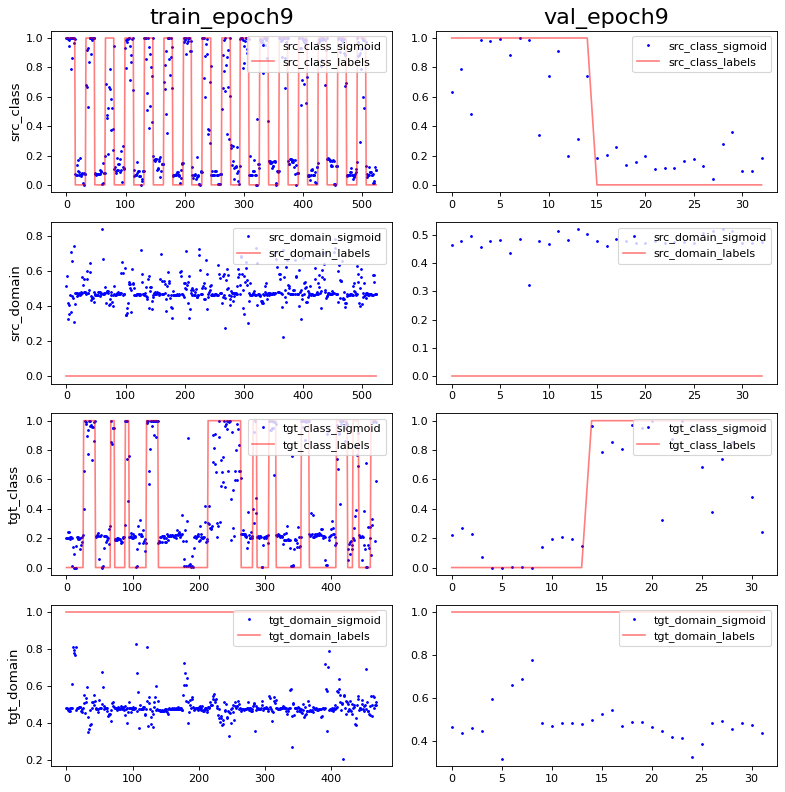

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -3.0914995e-09 1.0
PCA var: [43.3 58.  64.8 68.8 71.8 74.3 76.4 78.5 80.3 81.9]
show standardize mean and std: 1.6302126e-08 1.0
PCA var: [56.9 68.5 76.  81.4 85.5 88.4 90.4 92.  93.4 94.4]


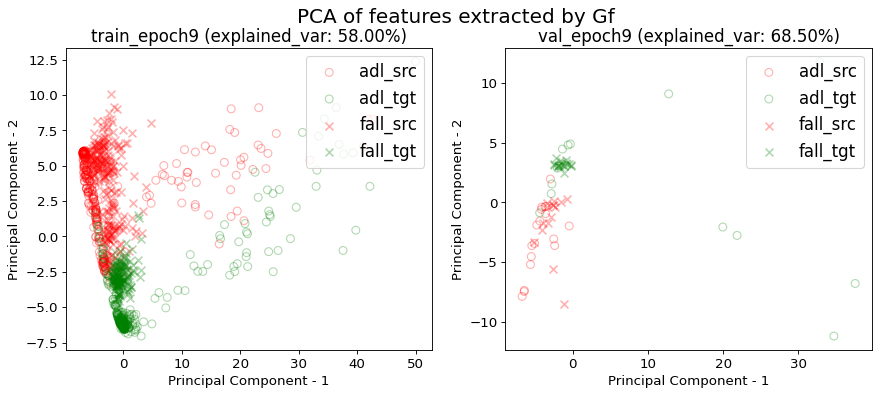

------------------------------Working on i_CV 4------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (491, 3, 66)
val_data shape: (10, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.2438095238095238 0.0 0.2057142857142857 0.9352380952380952
acc performance: 0.30303030303030304 0.0 0.12121212121212122 0.30303030303030304


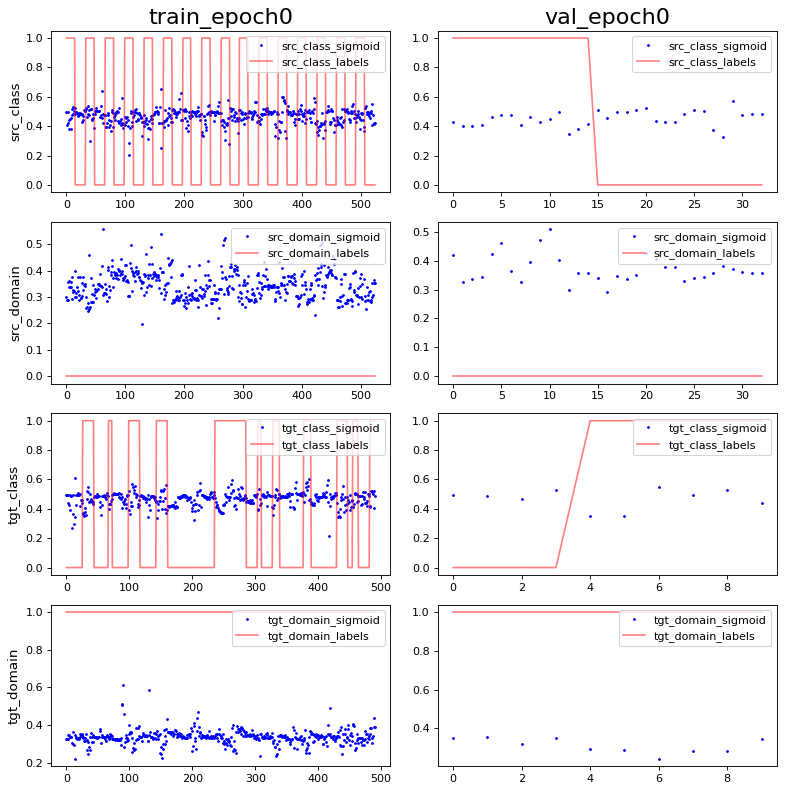

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -5.423345e-09 0.9965218
PCA var: [20.7      37.5      44.7      50.8      55.6      59.199997 62.299995
 64.49999  66.49999  68.49999 ]
show standardize mean and std: -3.696412e-09 0.99303126
PCA var: [26.1      37.300003 45.9      53.9      60.800003 65.9      70.1
 73.7      76.799995 79.7     ]


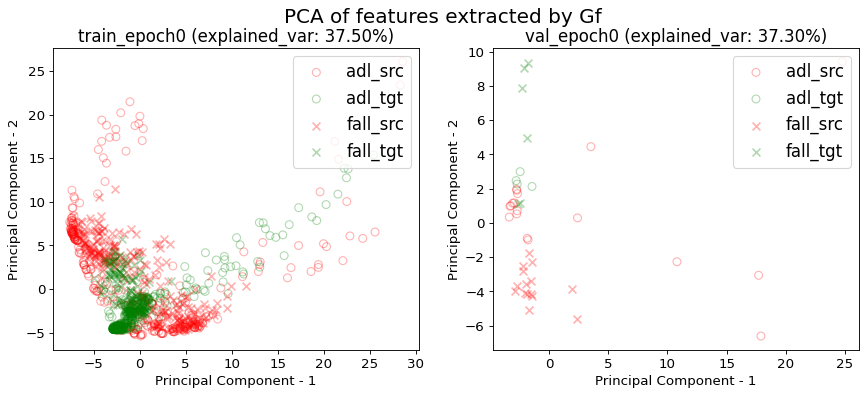

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


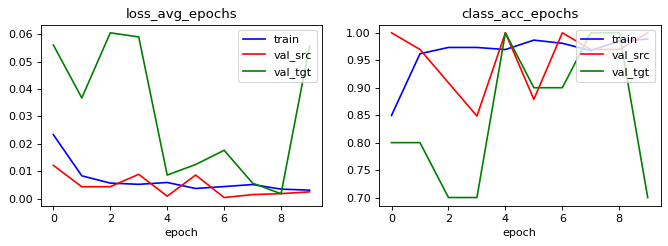

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.939047619047619 0.0419047619047619 0.8114285714285714 0.9295238095238095
acc performance: 1.0 0.06060606060606061 0.21212121212121213 0.30303030303030304


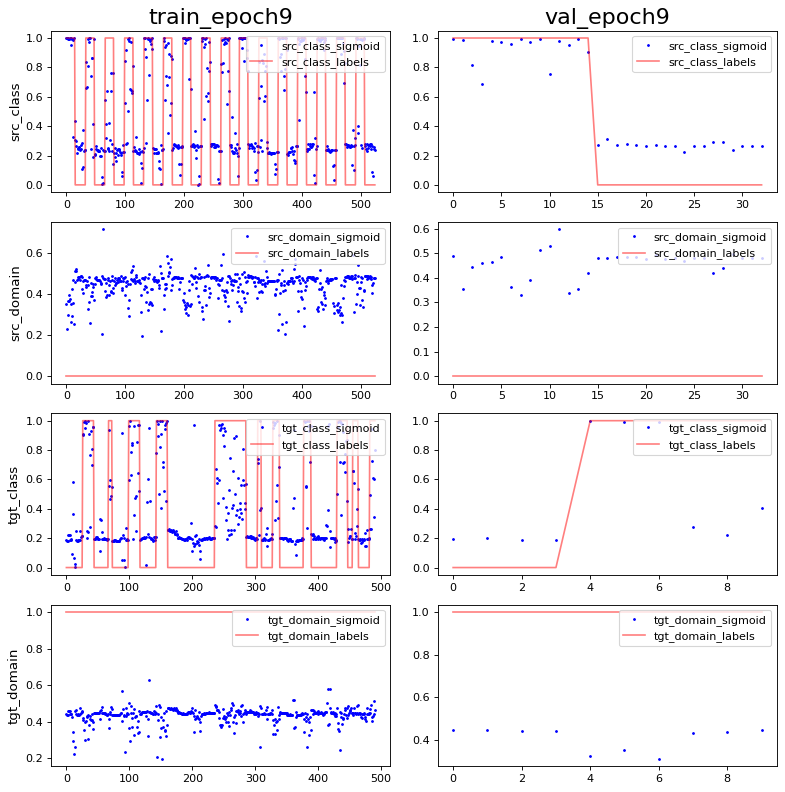

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 2.5030822e-09 0.9965218
PCA var: [29.300001 38.7      44.2      48.5      52.6      56.       59.1
 61.899998 64.399994 66.59999 ]
show standardize mean and std: 2.4642748e-09 0.978945
PCA var: [30.7 45.1 57.6 65.7 71.5 77.  82.1 86.  88.7 90.7]


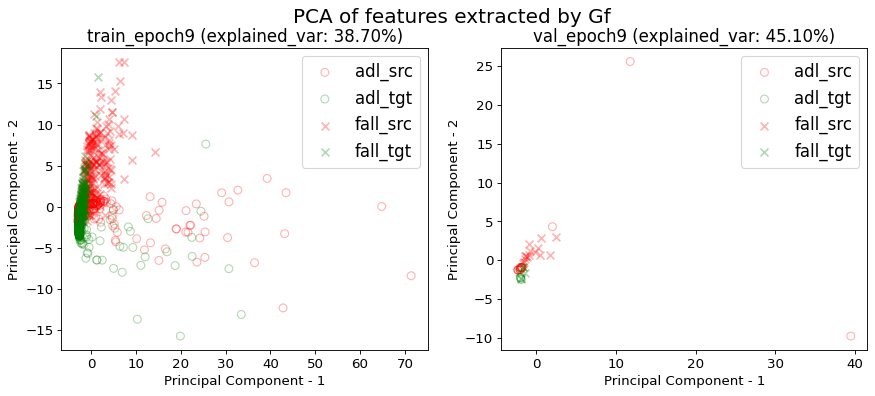

------------------------------Working on i_CV 5------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (457, 3, 66)
val_data shape: (44, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.5447619047619048 0.9942857142857143 0.5619047619047619 0.0
acc performance: 0.5454545454545454 1.0 0.7878787878787878 0.0


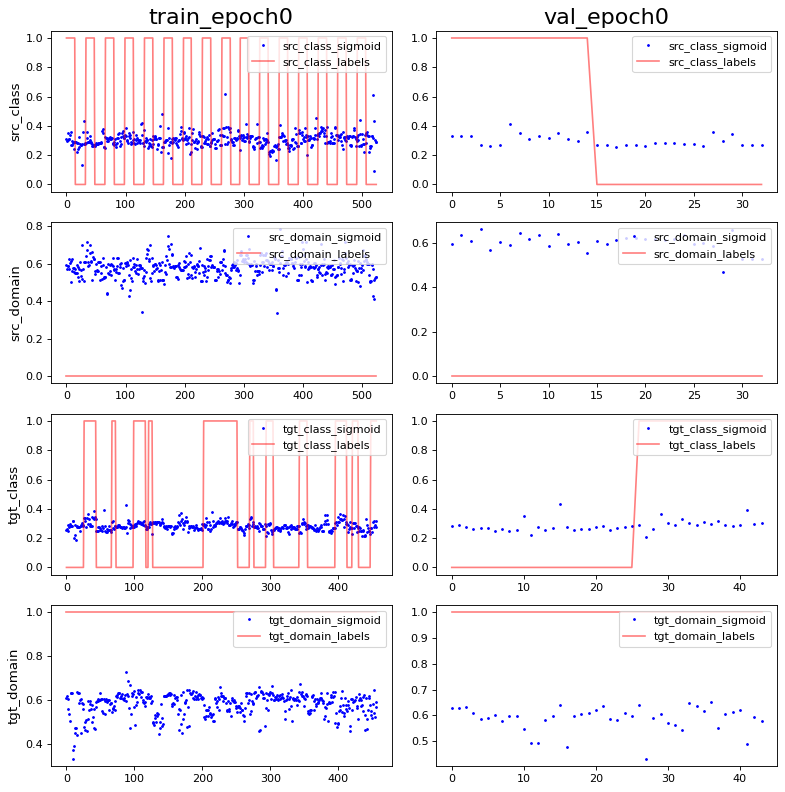

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -1.4027796e-09 0.9965217
PCA var: [23.4      33.5      41.6      46.899998 50.999996 54.499996 56.999996
 59.399998 61.499996 63.499996]
show standardize mean and std: -5.5046137e-09 0.98248553
PCA var: [26.       36.8      46.1      53.399998 59.6      65.4      69.6
 72.9      75.9      78.5     ]


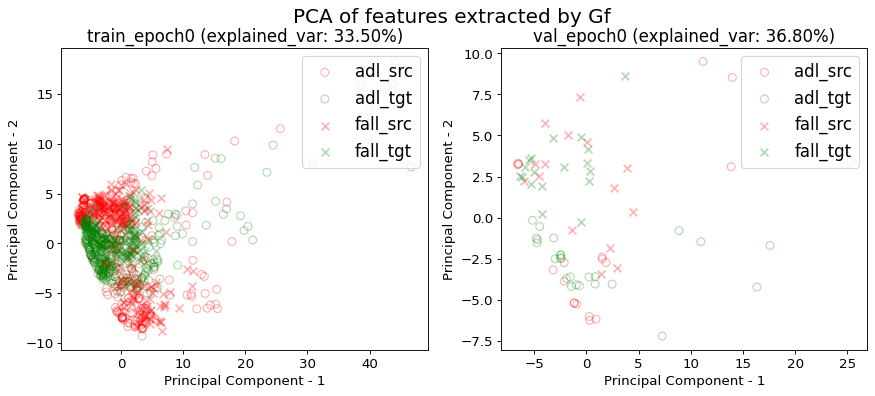

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


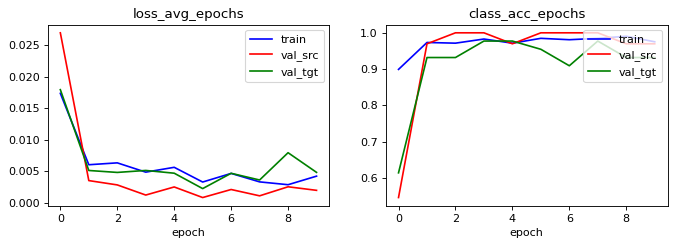

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.9752380952380952 0.9980952380952381 0.8247619047619048 0.0
acc performance: 0.9696969696969697 1.0 1.2424242424242424 0.030303030303030304


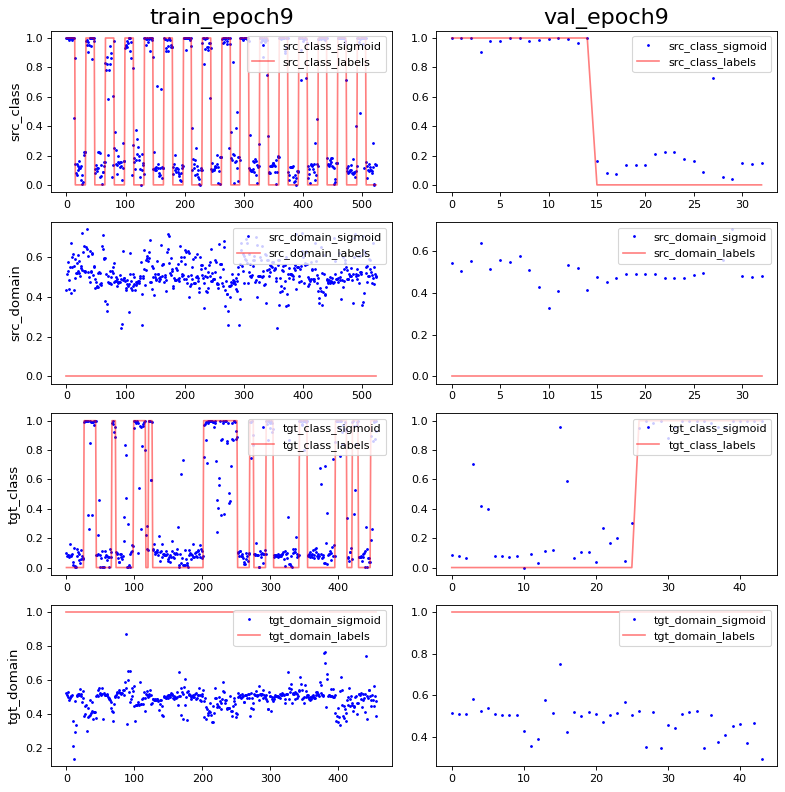

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -9.711552e-10 1.0
PCA var: [29.499998 47.399998 55.399998 61.399998 65.1      67.9      70.3
 72.3      74.100006 75.600006]
show standardize mean and std: -1.1009227e-08 0.9860133
PCA var: [28.099998 42.3      50.3      57.1      63.5      68.8      73.3
 76.9      80.200005 82.700005]


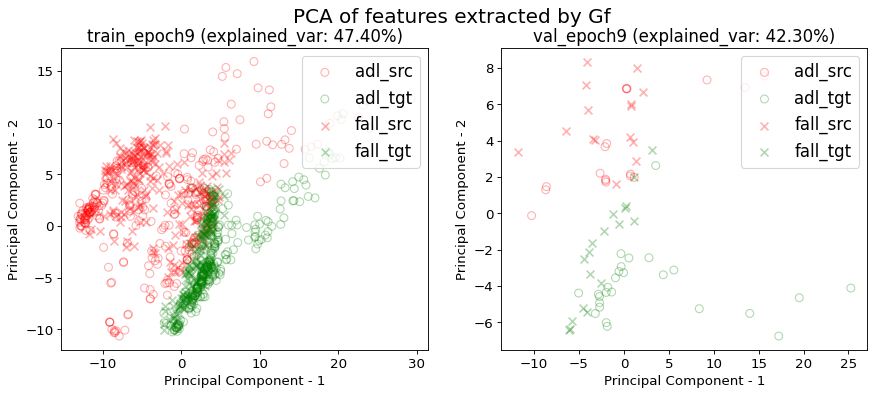

------------------------------Working on i_CV 6------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (485, 3, 66)
val_data shape: (16, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.539047619047619 0.8952380952380953 0.5580952380952381 0.15047619047619049
acc performance: 0.5454545454545454 0.9393939393939394 0.48484848484848486 0.0


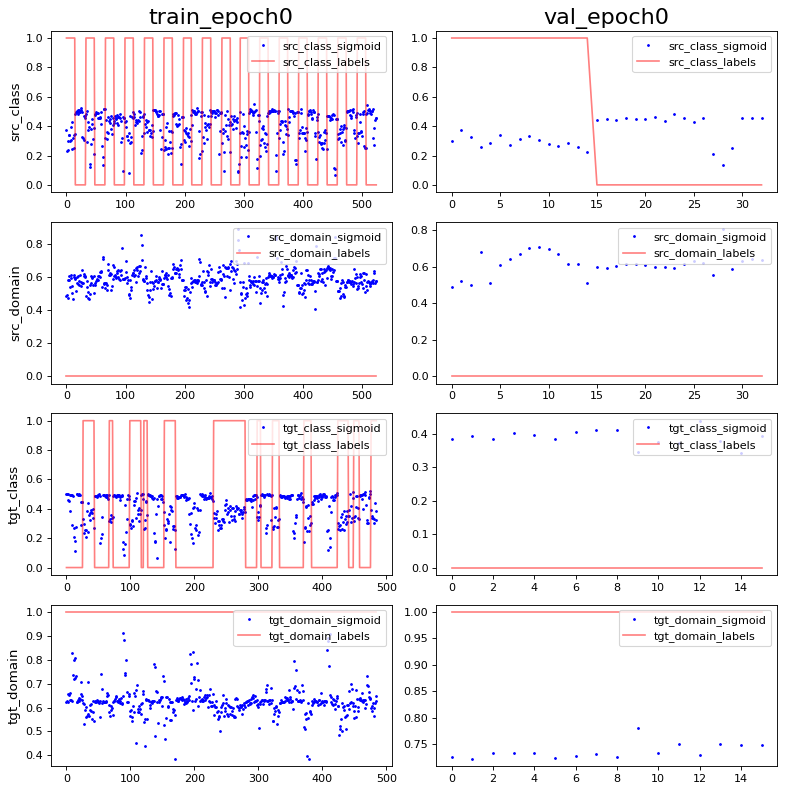

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -4.8260747e-09 1.0
PCA var: [27.7      38.7      45.100002 49.9      54.       57.4      60.300003
 63.000004 65.3      67.5     ]
show standardize mean and std: -2.1625268e-09 0.99303126
PCA var: [35.100002 48.600002 59.000004 66.200005 71.100006 75.00001  78.100006
 80.700005 83.100006 85.100006]


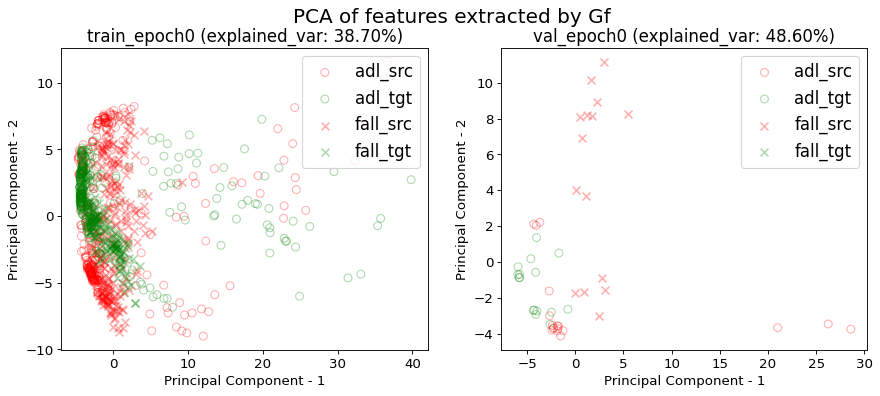

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


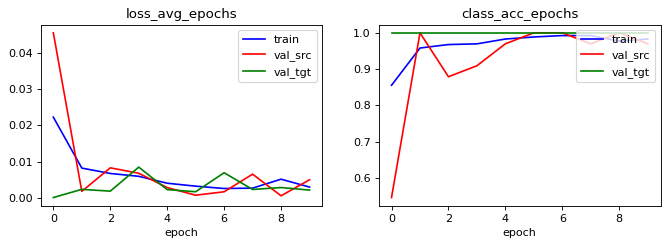

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.96 0.3180952380952381 0.84 0.28
acc performance: 0.9696969696969697 0.30303030303030304 0.48484848484848486 0.42424242424242425


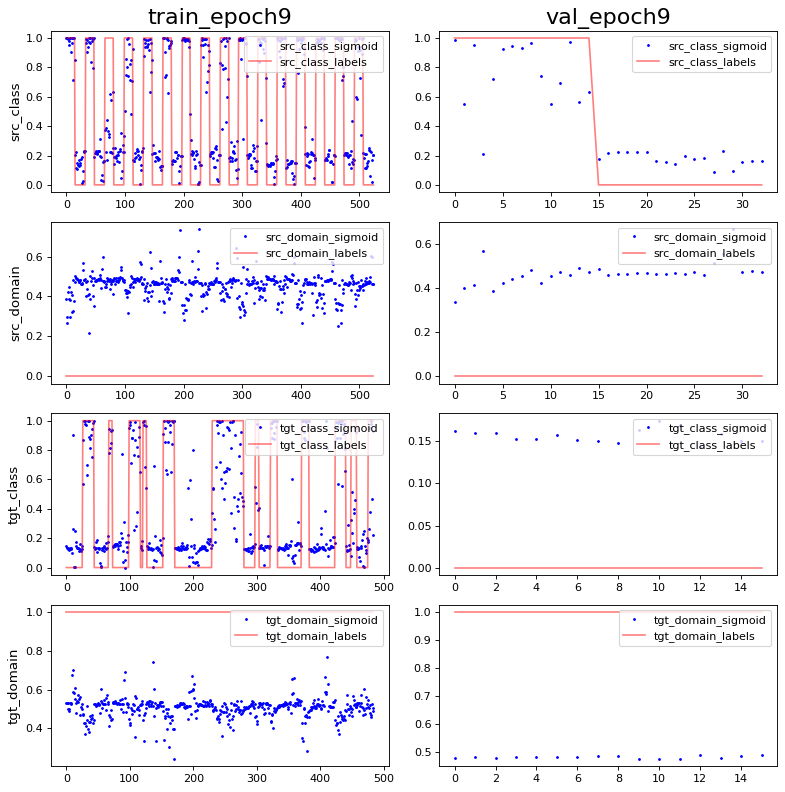

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 3.3572694e-09 1.0
PCA var: [33.6      44.1      50.399998 55.1      58.5      61.7      64.6
 66.9      69.1      71.1     ]
show standardize mean and std: 0.0 0.95742714
PCA var: [42.5      53.6      62.5      68.7      74.399994 78.7      82.299995
 85.2      87.799995 90.2     ]


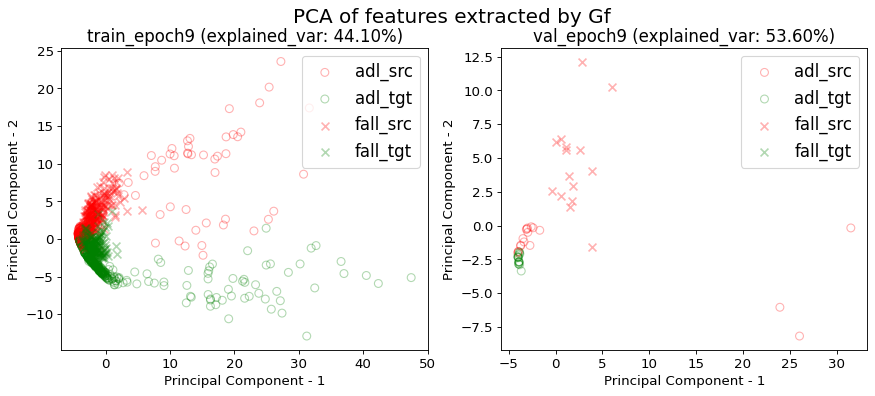

------------------------------Working on i_CV 7------------------------------
Working on get_UPFall_loader...
train_data shape: (526, 3, 66)
val_data shape: (32, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (392, 3, 66)
val_data shape: (109, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.6330798479087453 0.9961977186311787 0.5038022813688213 0.0
acc performance: 0.65625 1.0 1.90625 0.0


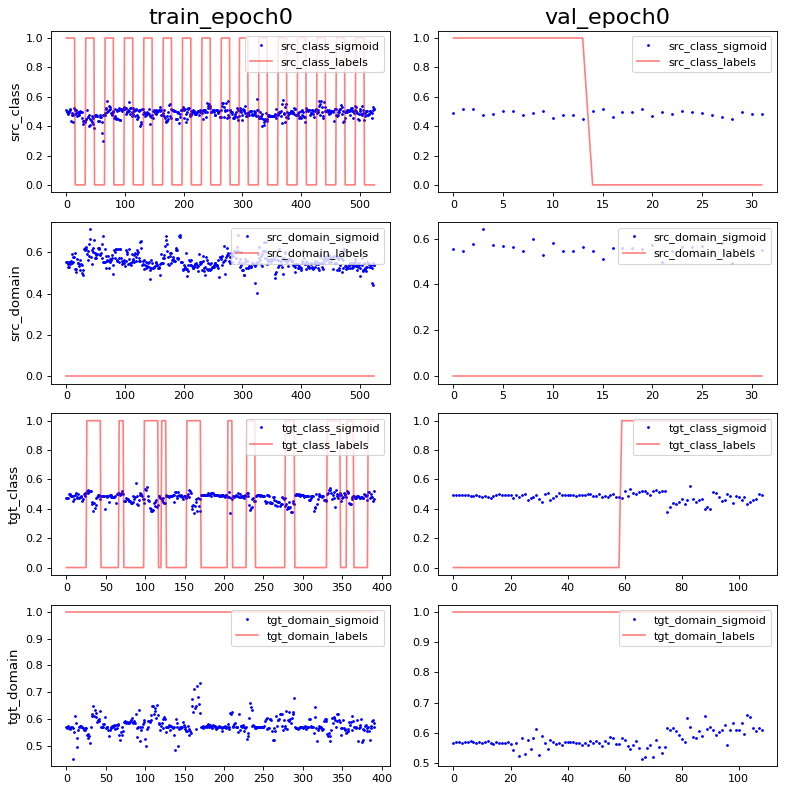

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 1.3851479e-09 0.99303126
PCA var: [17.800001 32.4      42.7      48.300003 52.4      55.600002 58.2
 60.7      63.100002 64.9     ]
show standardize mean and std: 3.0060656e-09 0.9895285
PCA var: [19.5 34.9 42.7 49.7 55.2 58.9 62.2 65.4 68.4 71.1]


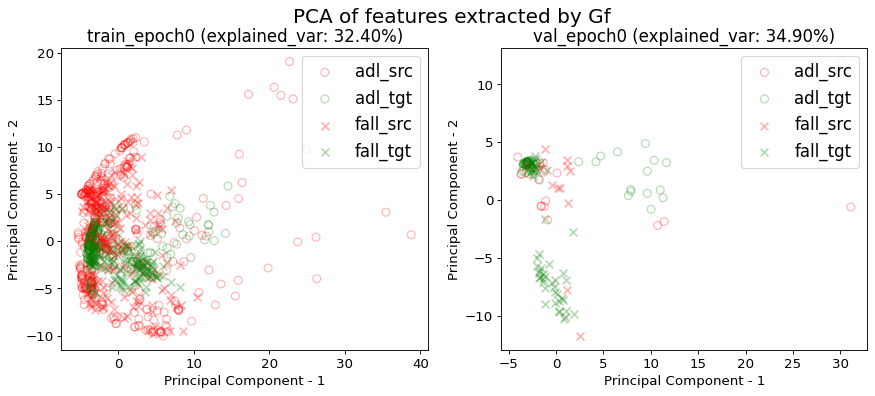

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


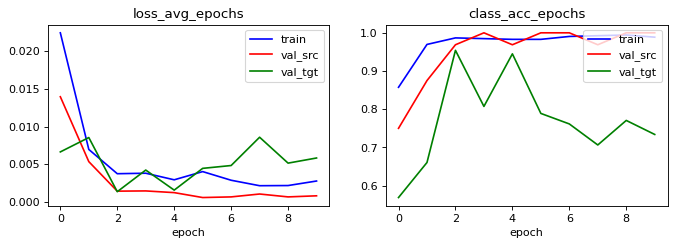

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.9809885931558935 0.49619771863117873 0.6768060836501901 0.6634980988593155
acc performance: 1.0 0.46875 2.5 3.15625


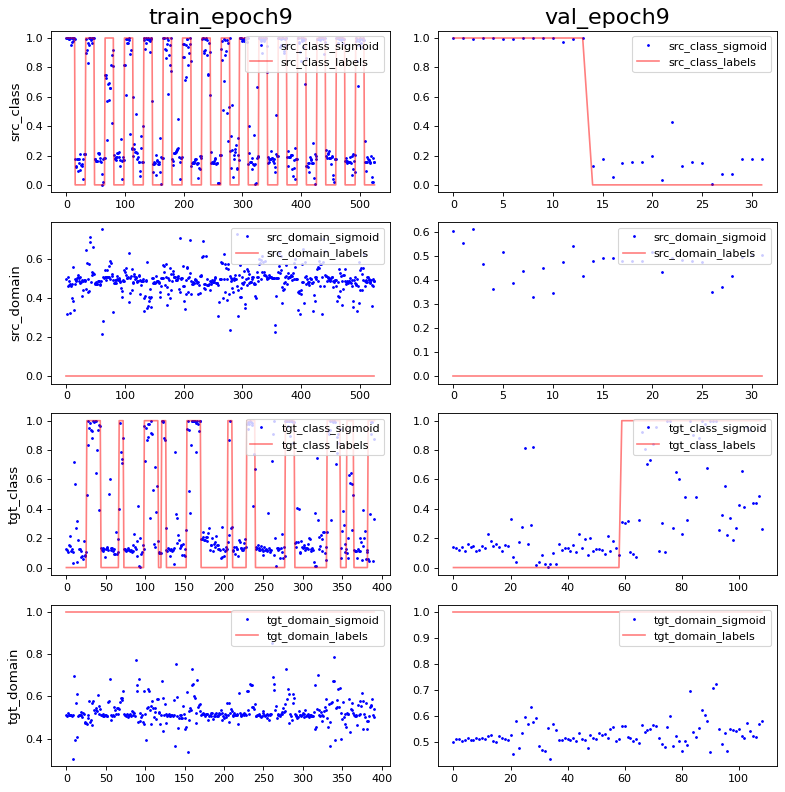

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -4.328587e-11 1.0
PCA var: [40.5 51.7 57.7 62.3 65.4 68.4 70.9 72.9 74.5 76. ]
show standardize mean and std: 0.0 1.0
PCA var: [40.1      54.1      61.5      67.4      71.8      75.200005 78.100006
 80.50001  82.700005 84.3     ]


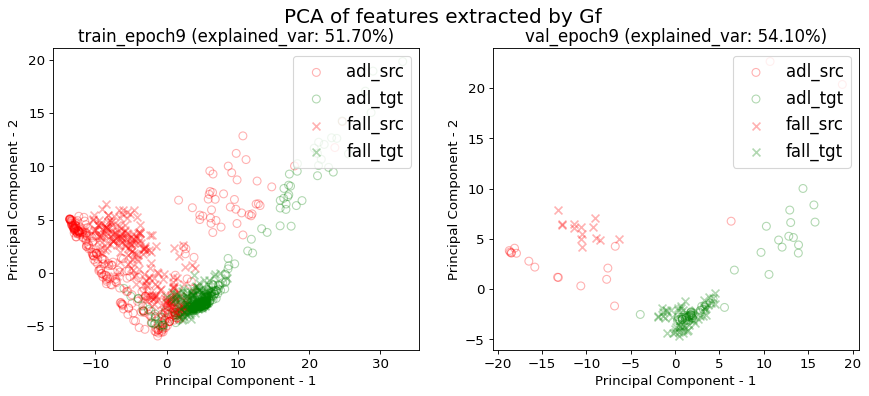

------------------------------Working on i_CV 8------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (489, 3, 66)
val_data shape: (12, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.44761904761904764 0.013333333333333334 0.3219047619047619 0.9314285714285714
acc performance: 0.45454545454545453 0.0 0.0 0.36363636363636365


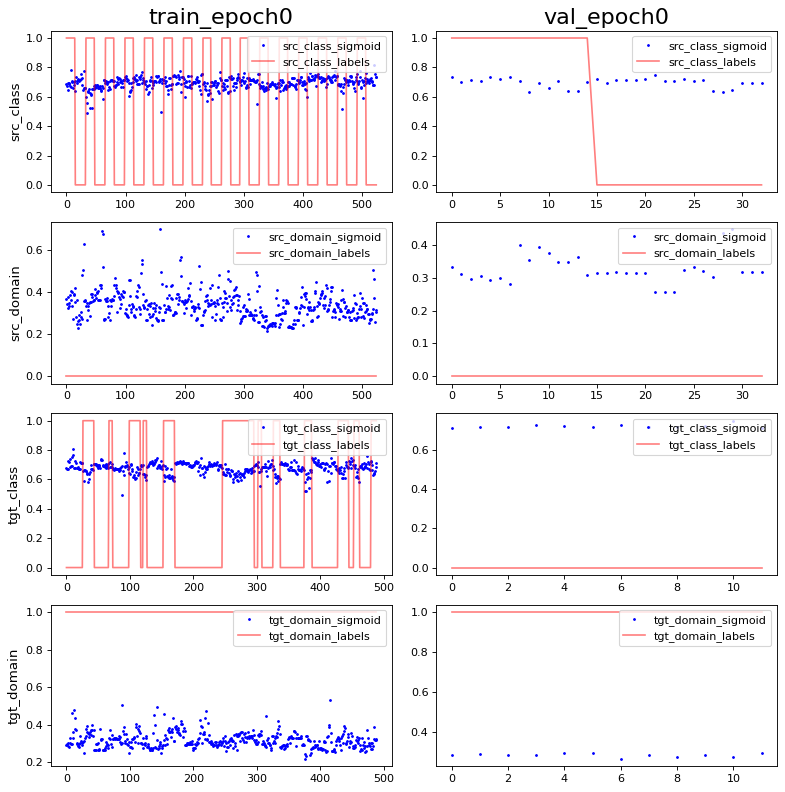

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -4.2322825e-09 0.9965218
PCA var: [17.9      30.7      38.       43.5      48.2      52.2      55.600002
 58.800003 61.200005 63.600006]
show standardize mean and std: 9.419006e-09 0.9965218
PCA var: [25.3      42.6      52.199997 60.999996 67.799995 73.299995 78.6
 82.5      85.8      88.100006]


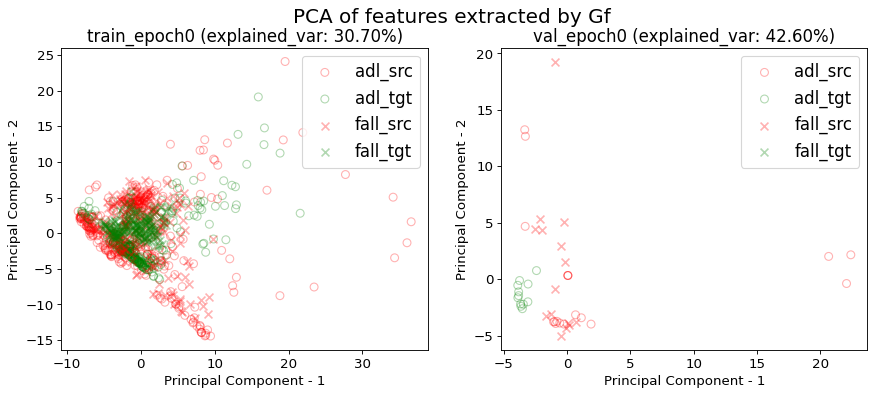

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


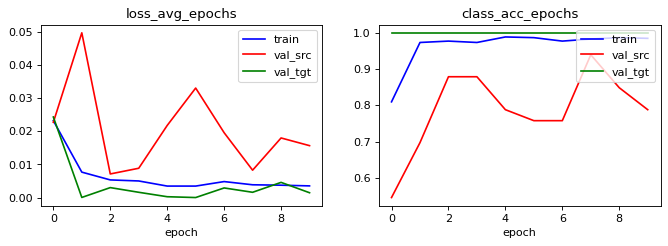

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.9352380952380952 0.900952380952381 0.8704761904761905 0.2057142857142857
acc performance: 0.7878787878787878 1.0 0.36363636363636365 0.06060606060606061


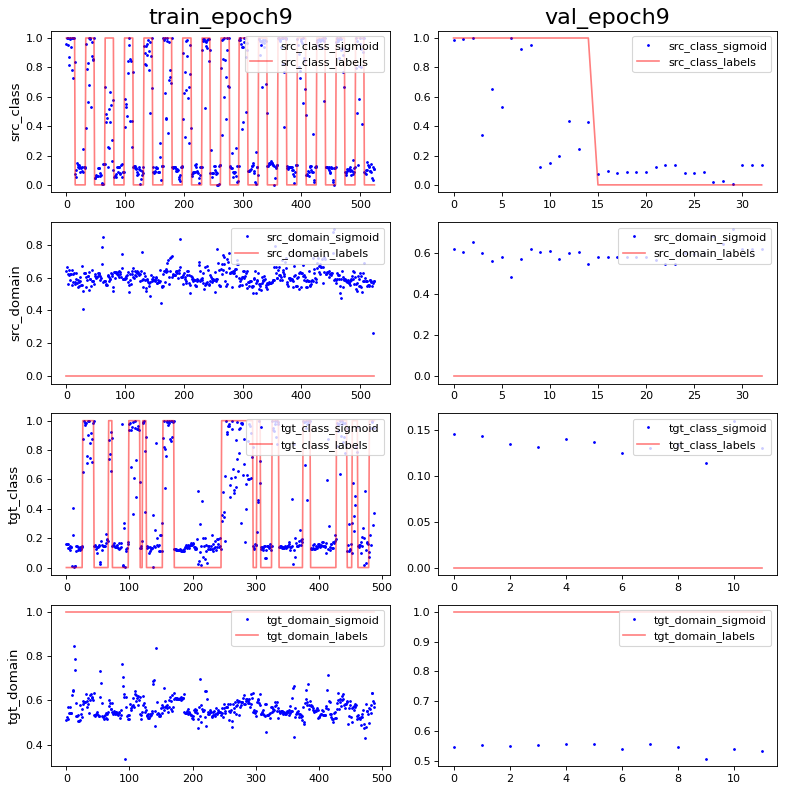

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 5.0160387e-09 1.0
PCA var: [37.2      48.6      55.       58.9      61.9      64.700005 66.9
 69.       70.8      72.5     ]
show standardize mean and std: -4.709503e-09 1.0
PCA var: [38.800003 51.800003 61.300003 70.3      75.200005 79.9      83.
 85.8      88.4      90.4     ]


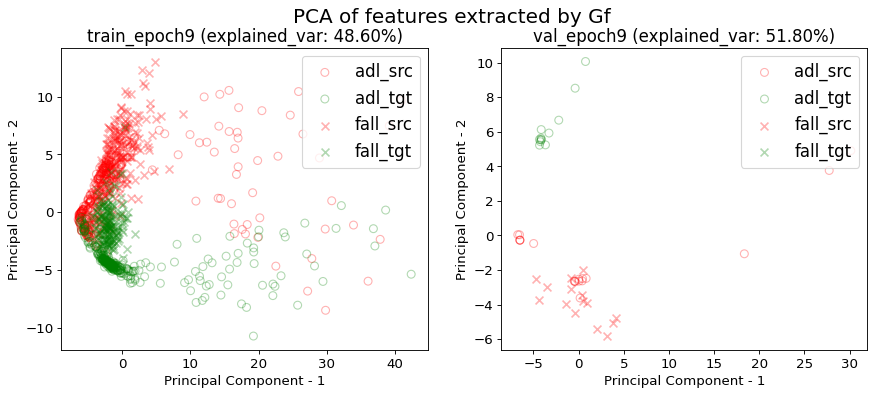

------------------------------Working on i_CV 9------------------------------
Working on get_UPFall_loader...
train_data shape: (527, 3, 66)
val_data shape: (31, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (498, 3, 66)
val_data shape: (3, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.6110056925996205 0.9981024667931688 0.6907020872865275 0.003795066413662239
acc performance: 0.6451612903225806 1.0 0.0967741935483871 0.0


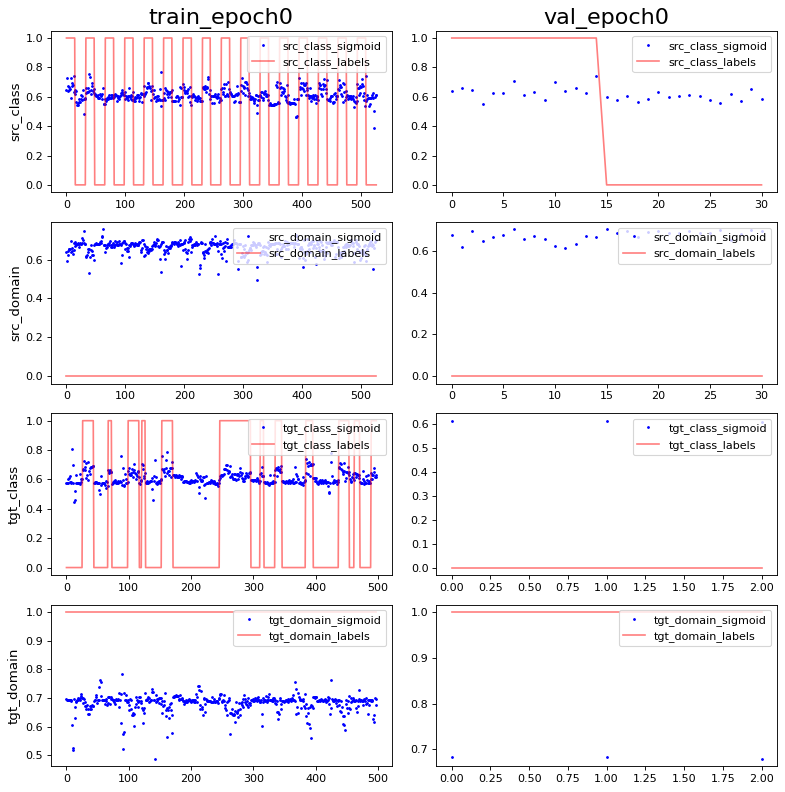

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 6.461208e-11 0.98952854
PCA var: [17.5      28.6      35.5      40.7      45.100002 48.600002 52.100002
 54.9      57.5      59.7     ]
show standardize mean and std: 3.1165828e-09 0.98952854
PCA var: [19.1      34.100002 45.200005 52.700005 58.600006 63.800007 68.90001
 73.20001  76.80001  79.80001 ]


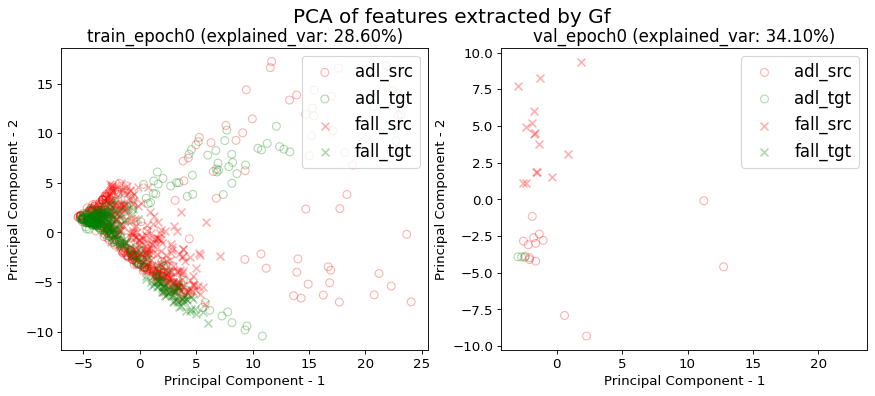

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


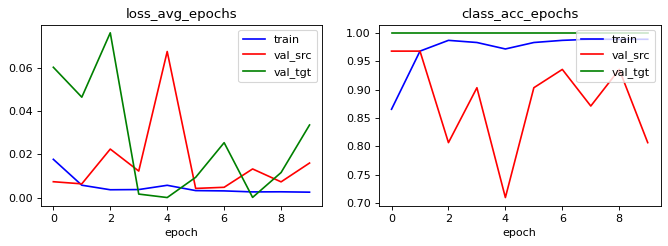

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.9924098671726755 0.3036053130929791 0.9108159392789373 0.9127134724857685
acc performance: 0.8064516129032258 0.16129032258064516 0.0967741935483871 0.0967741935483871


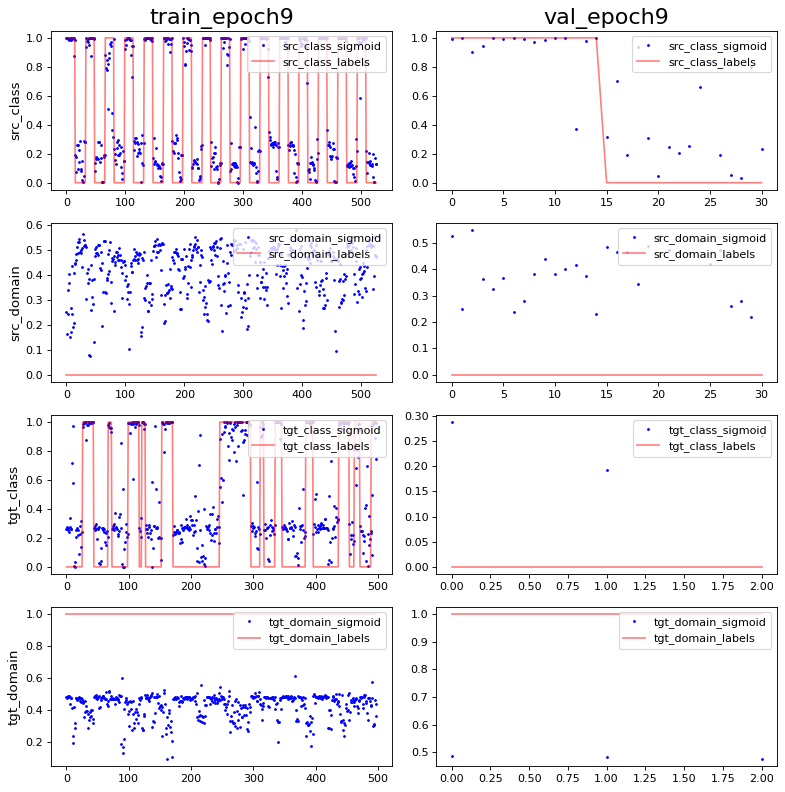

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 2.1968108e-10 0.99999994
PCA var: [37.6      53.5      62.4      65.4      68.200005 70.8      72.9
 74.8      76.5      78.2     ]
show standardize mean and std: -3.1165828e-09 1.0
PCA var: [34.5 47.1 55.8 63.7 70.9 75.4 79.6 82.9 85.5 87.7]


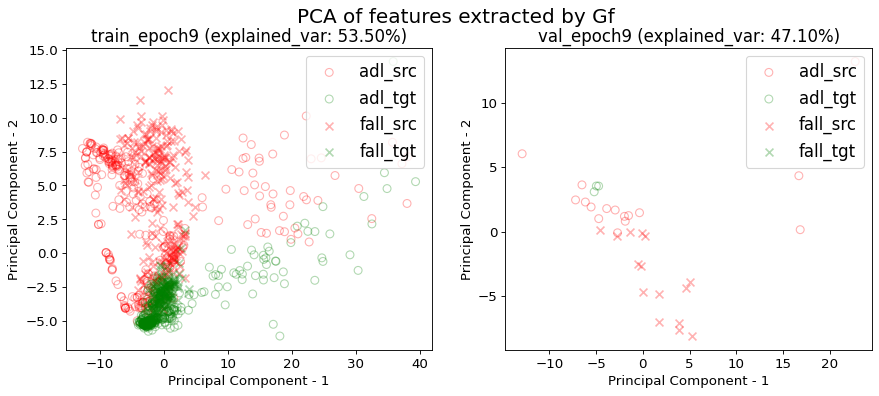

------------------------------Working on i_CV 10------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (492, 3, 66)
val_data shape: (9, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.5447619047619048 0.56 0.6057142857142858 0.3580952380952381
acc performance: 0.5757575757575758 0.3939393939393939 0.09090909090909091 0.12121212121212122


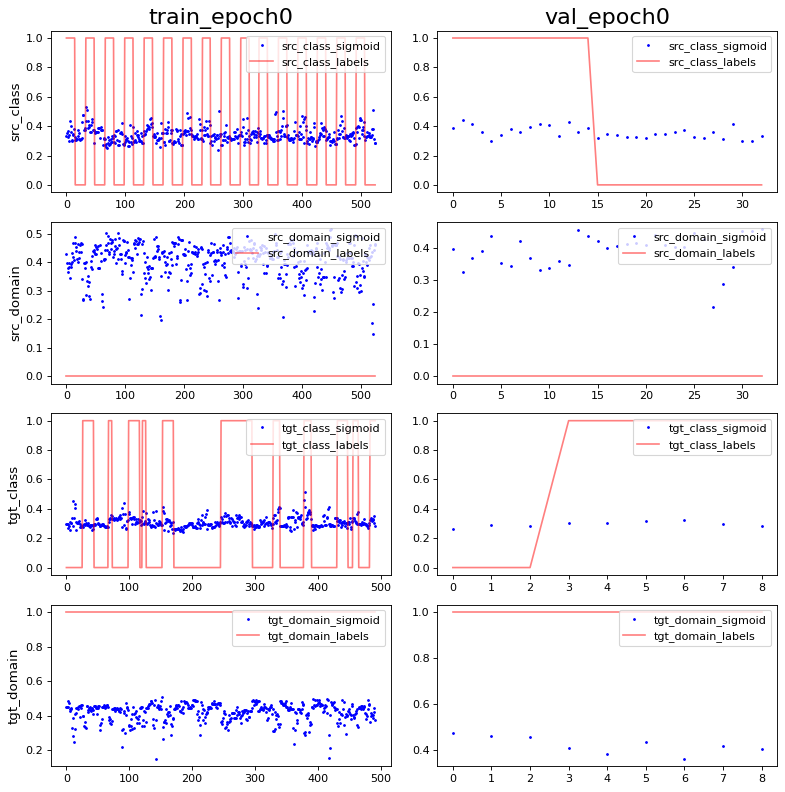

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 1.0419254e-10 0.9895285
PCA var: [25.       36.1      45.5      50.4      54.4      57.800003 60.4
 62.600002 64.700005 66.600006]
show standardize mean and std: 1.2614739e-09 0.98952854
PCA var: [21.3 35.4 48.7 60.3 67.  72.  76.6 80.5 83.1 85.1]


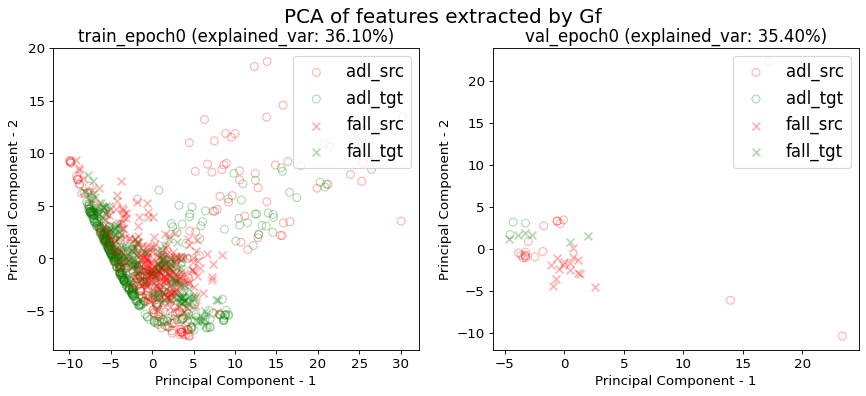

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


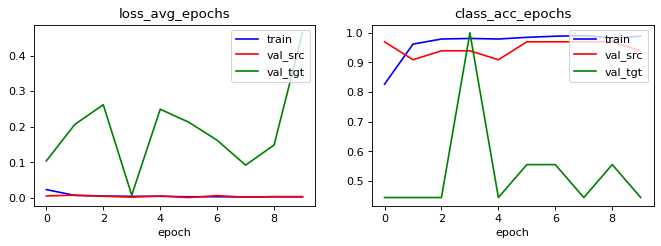

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.8952380952380953 0.34095238095238095 0.7219047619047619 0.18095238095238095
acc performance: 0.9393939393939394 0.36363636363636365 0.12121212121212122 0.030303030303030304


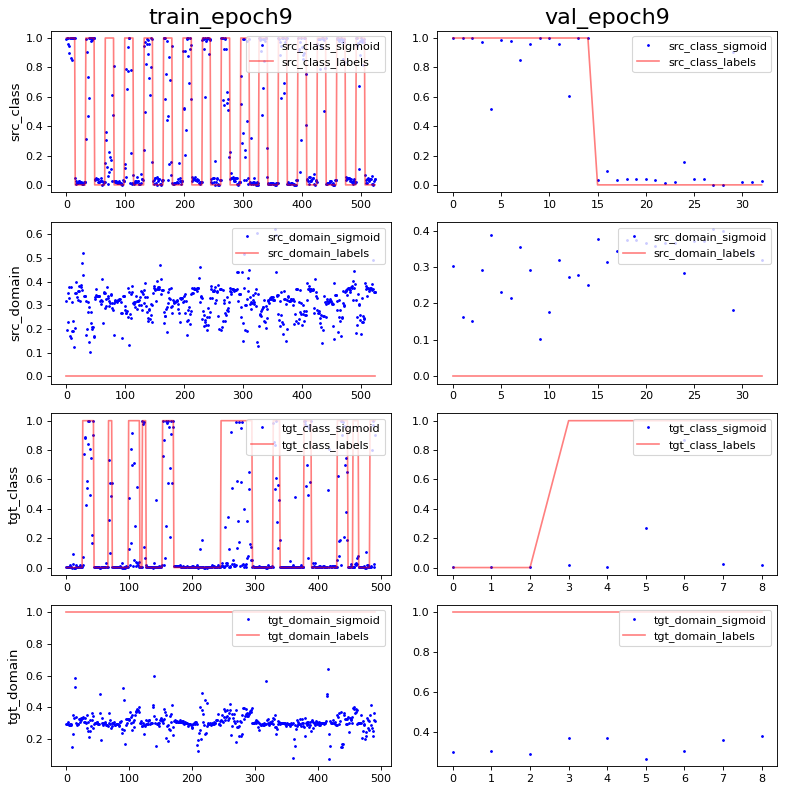

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 1.6670806e-09 0.98952854
PCA var: [49.8 58.1 63.1 67.4 69.6 71.5 73.1 74.7 76.  77.2]
show standardize mean and std: 0.0 0.94280905
PCA var: [49.7      63.5      72.2      78.899994 84.399994 87.899994 91.09999
 92.49999  93.799995 94.799995]


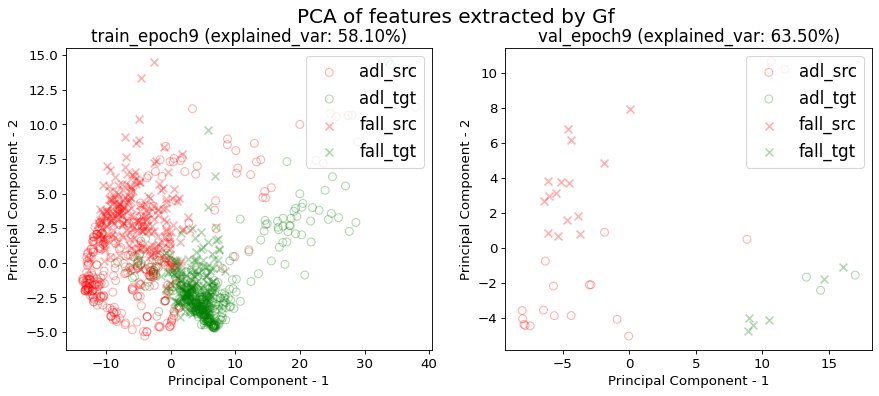

------------------------------Working on i_CV 11------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (472, 3, 66)
val_data shape: (29, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.4552380952380952 0.9371428571428572 0.3219047619047619 0.030476190476190476
acc performance: 0.45454545454545453 0.8787878787878788 0.3333333333333333 0.030303030303030304


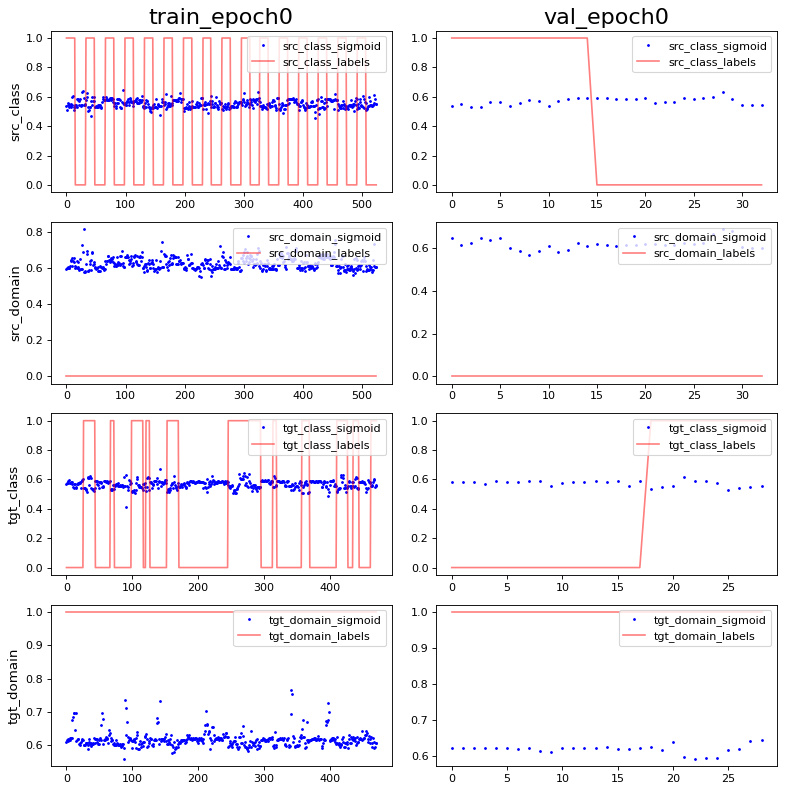

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 8.502613e-10 0.9965218
PCA var: [16.8      32.5      39.6      45.699997 49.799995 53.299995 56.299995
 58.899994 61.299995 63.599995]
show standardize mean and std: 1.2818203e-09 0.9965218
PCA var: [21.4      35.3      45.8      54.       61.4      68.       72.7
 76.6      79.799995 82.799995]


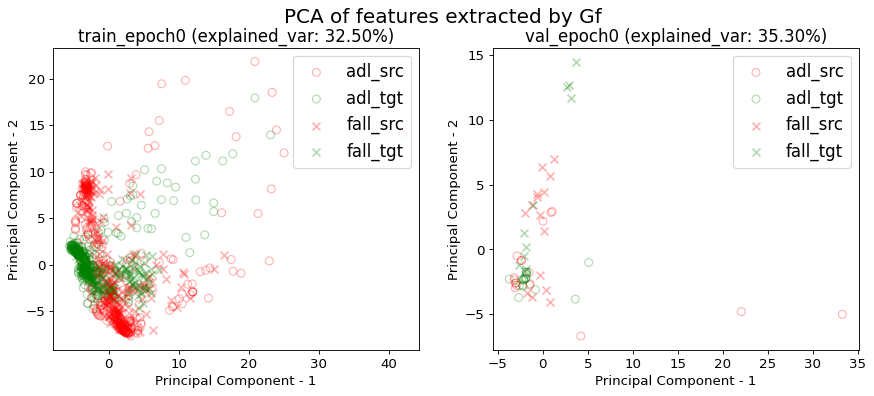

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


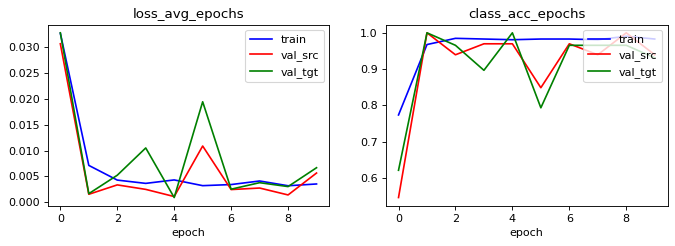

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.9428571428571428 0.9961904761904762 0.7504761904761905 0.0019047619047619048
acc performance: 0.9393939393939394 1.0 0.8181818181818182 0.0


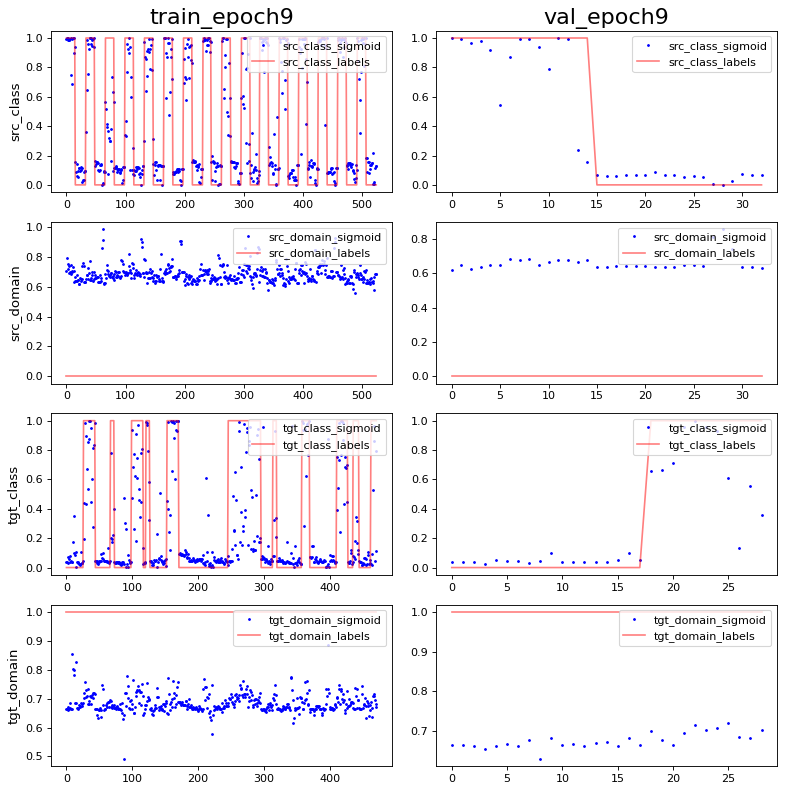

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 8.502613e-09 0.9242114
PCA var: [37.5      47.4      54.300003 59.600002 63.500004 66.4      69.1
 71.299995 73.2      75.      ]
show standardize mean and std: 1.1963657e-08 0.8819171
PCA var: [28.7      44.6      59.5      68.1      75.299995 81.299995 85.1
 87.9      90.1      91.799995]


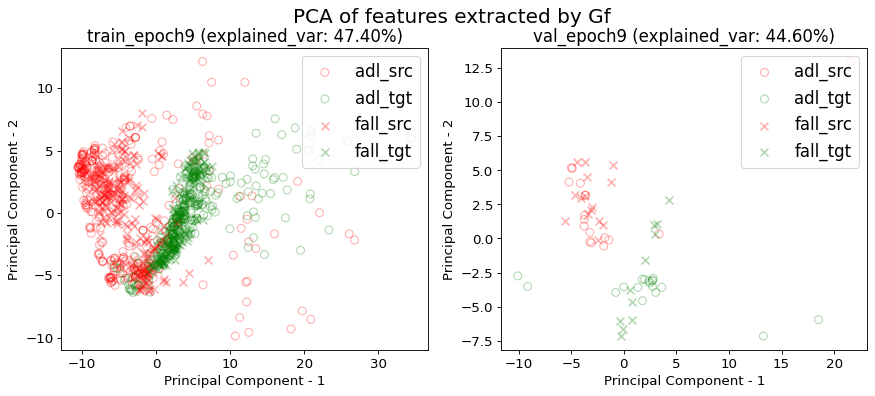

------------------------------Working on i_CV 12------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (489, 3, 66)
val_data shape: (12, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.49142857142857144 0.9961904761904762 0.4 0.0019047619047619048
acc performance: 0.5151515151515151 1.0 0.030303030303030304 0.0


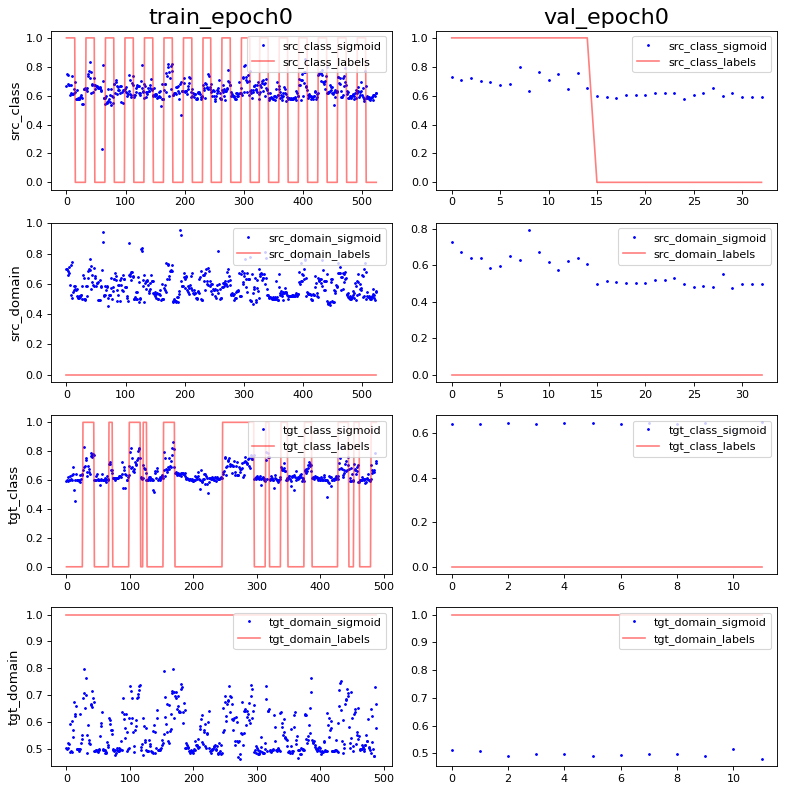

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -5.2250402e-11 0.9895285
PCA var: [24.3      35.1      43.5      50.4      54.7      58.100002 60.9
 63.5      65.6      67.5     ]
show standardize mean and std: 0.0 0.978945
PCA var: [28.3      44.       55.5      64.8      69.600006 73.90001  77.90001
 81.20001  84.40001  87.100006]


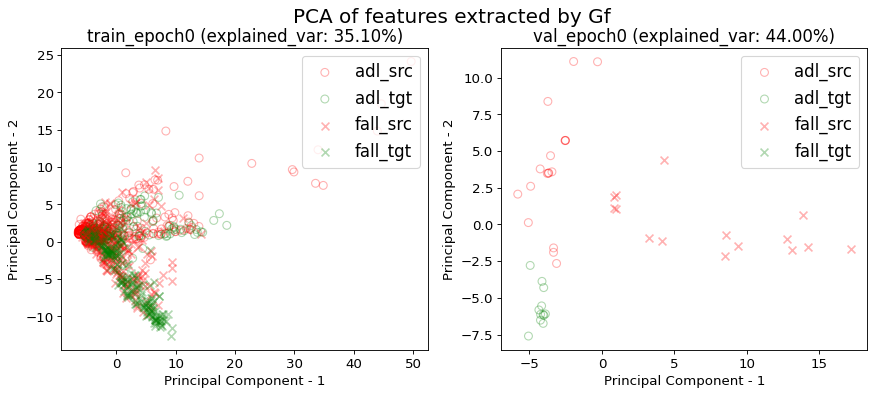

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


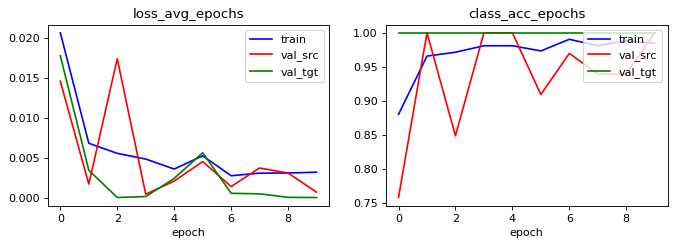

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.9314285714285714 0.9657142857142857 0.7866666666666666 0.0038095238095238095
acc performance: 1.0 0.9696969696969697 0.36363636363636365 0.0


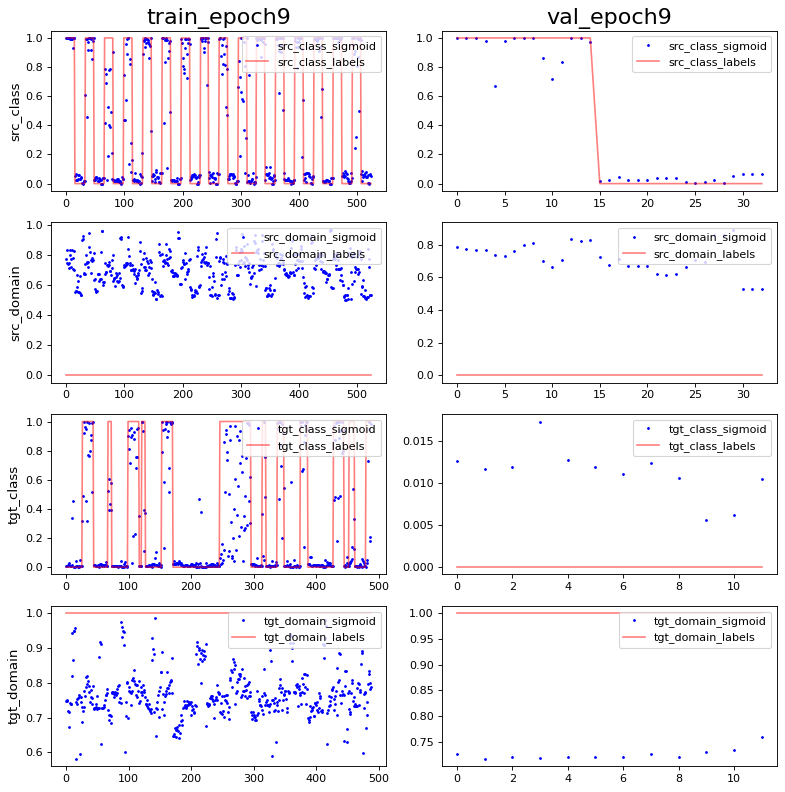

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -6.6880514e-09 1.0
PCA var: [46.1      55.1      60.1      63.899998 67.299995 69.899994 72.09999
 73.99999  75.799995 77.399994]
show standardize mean and std: 4.709503e-09 1.0
PCA var: [43.2      61.9      72.5      76.7      80.6      83.4      85.700005
 87.9      89.6      91.1     ]


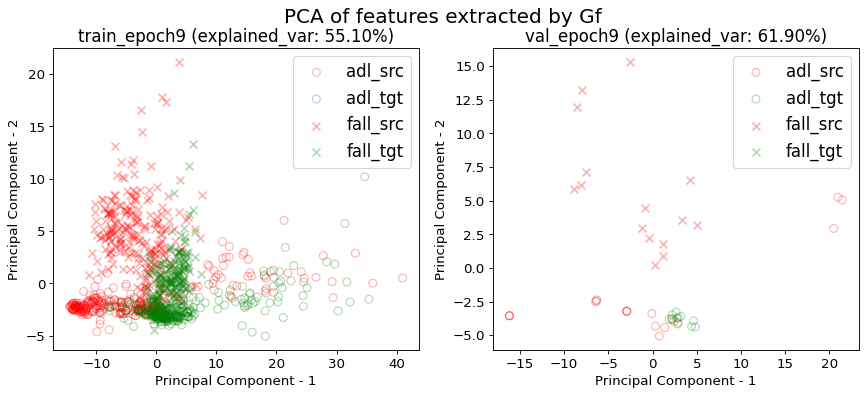

------------------------------Working on i_CV 13------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (463, 3, 66)
val_data shape: (38, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.5504761904761905 0.01904761904761905 0.49142857142857144 0.878095238095238
acc performance: 0.6666666666666666 0.0 0.45454545454545453 1.1515151515151516


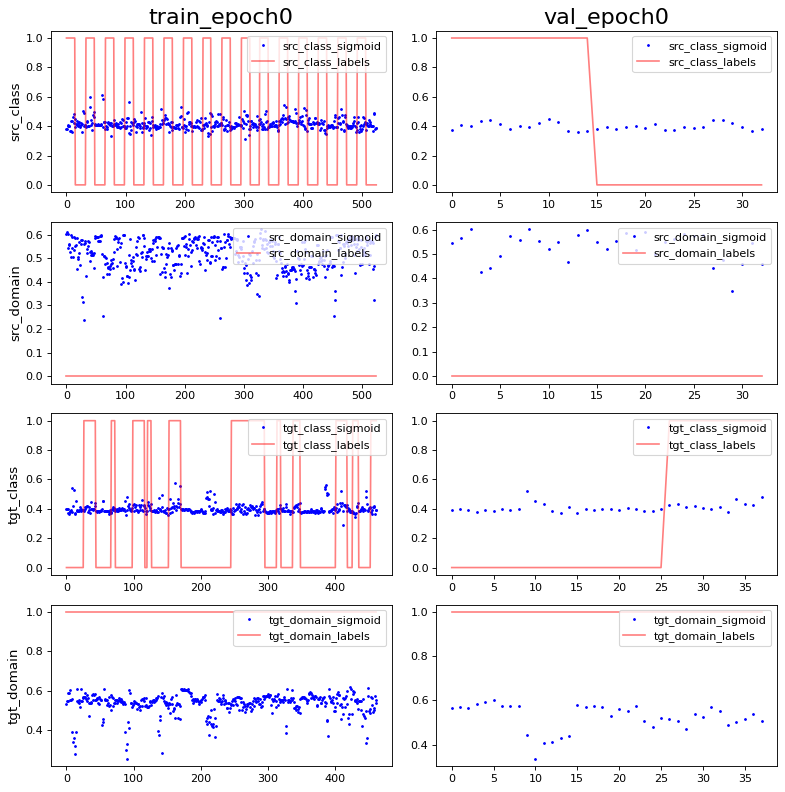

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -1.1797591e-09 0.9895285
PCA var: [22.6      33.7      41.9      46.600002 50.7      53.5      56.
 58.4      60.300003 62.100002]
show standardize mean and std: 2.984896e-09 0.9860133
PCA var: [22.5      31.7      39.       45.8      52.1      57.3      61.1
 64.6      67.7      70.399994]


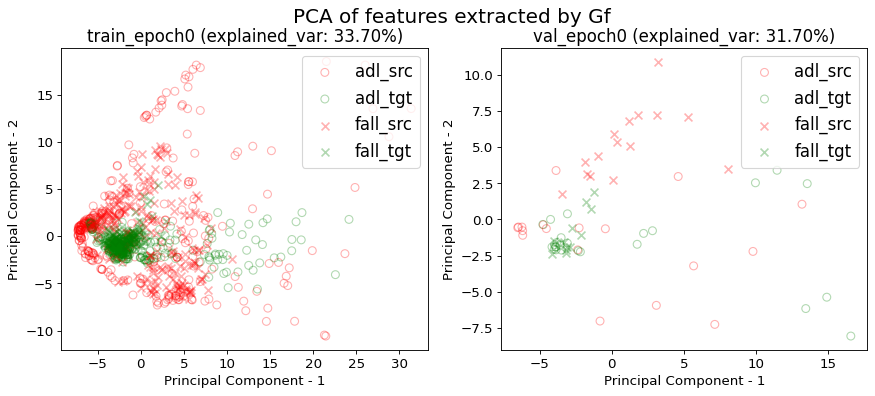

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


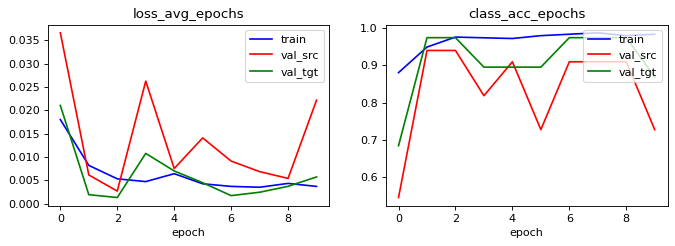

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.7276190476190476 0.8342857142857143 0.6209523809523809 0.6076190476190476
acc performance: 0.7272727272727273 0.9393939393939394 1.0 1.0


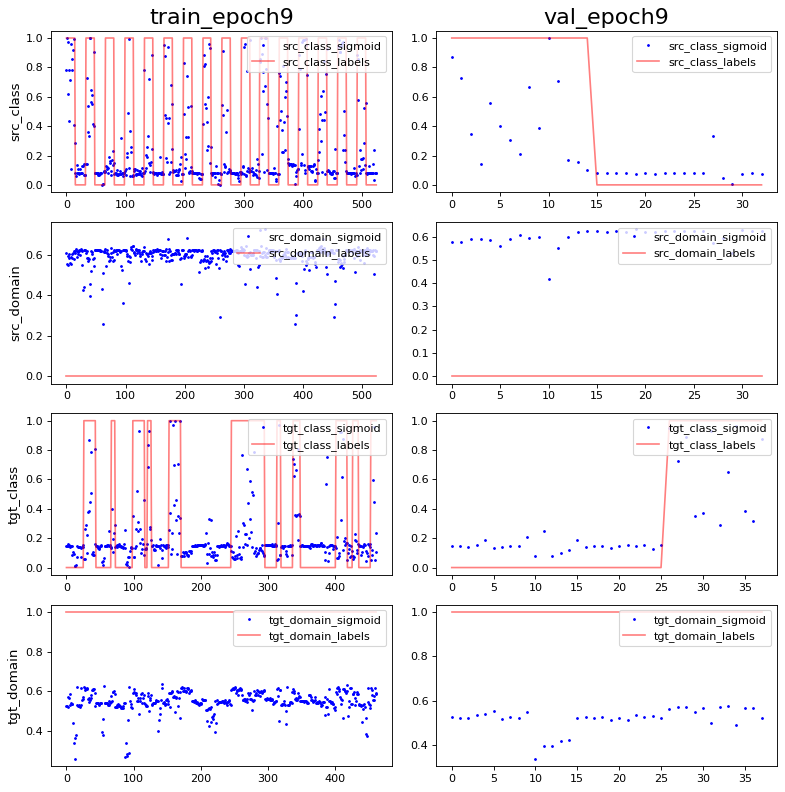

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -2.7885214e-09 1.0
PCA var: [39.       53.9      59.100002 63.800003 67.4      70.4      72.8
 75.100006 77.200005 78.9     ]
show standardize mean and std: 2.984896e-09 1.0
PCA var: [49.1      66.399994 74.899994 81.2      85.2      88.399994 90.59999
 92.399994 93.799995 94.899994]


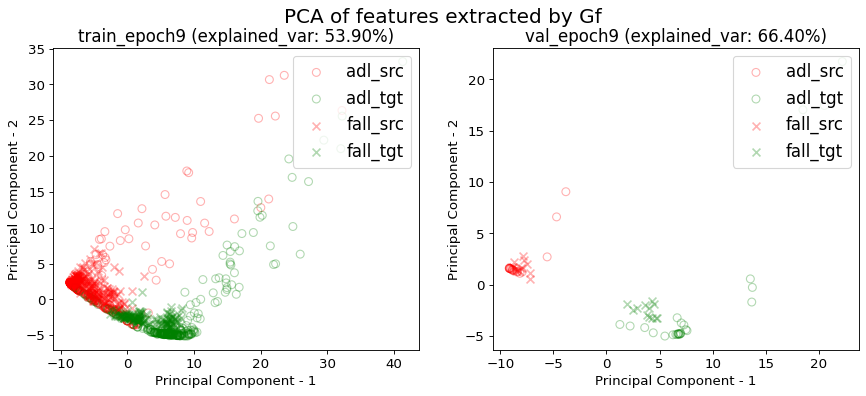

------------------------------Working on i_CV 14------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (486, 3, 66)
val_data shape: (15, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.4552380952380952 0.3676190476190476 0.34285714285714286 0.539047619047619
acc performance: 0.45454545454545453 0.3939393939393939 0.0 0.30303030303030304


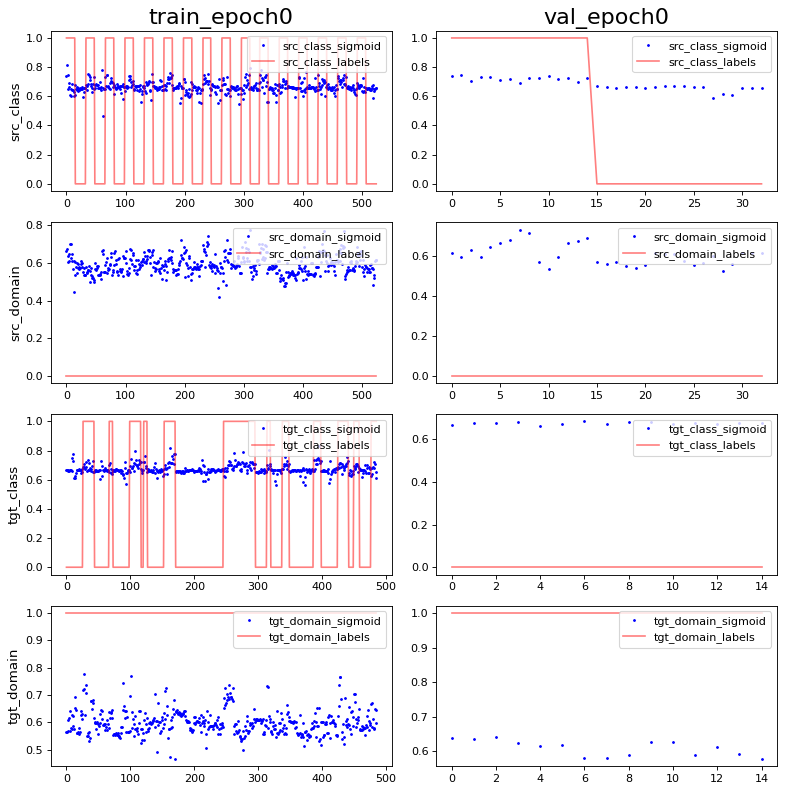

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 0.0 0.9860133
PCA var: [22.6      40.699997 49.799995 58.199997 62.299995 65.899994 68.799995
 70.7      72.299995 73.799995]
show standardize mean and std: 1.1037897e-09 0.98248553
PCA var: [35.600002 55.200005 70.100006 75.8      80.700005 84.50001  86.90001
 88.90001  90.70001  92.20001 ]


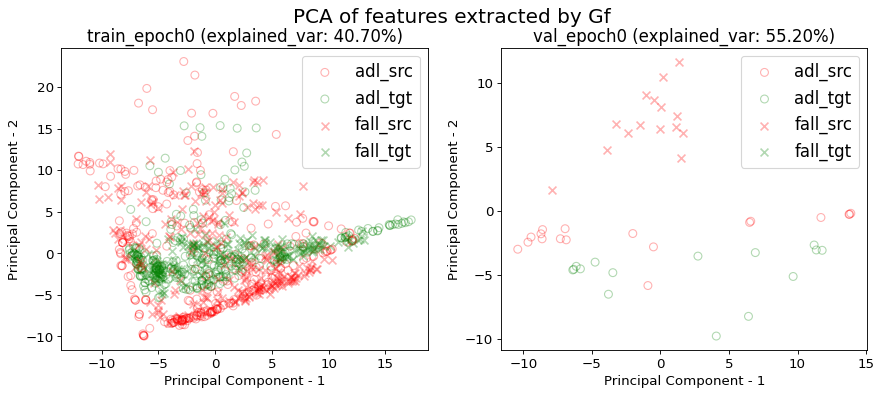

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


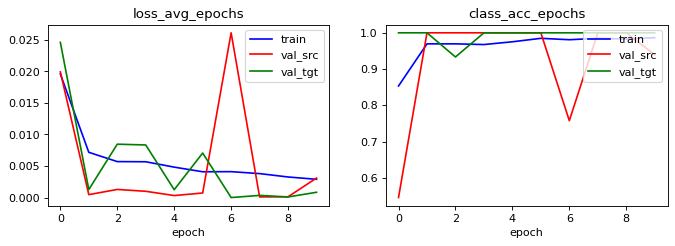

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.9466666666666667 0.30095238095238097 0.8057142857142857 0.8323809523809523
acc performance: 0.9393939393939394 0.30303030303030304 0.45454545454545453 0.45454545454545453


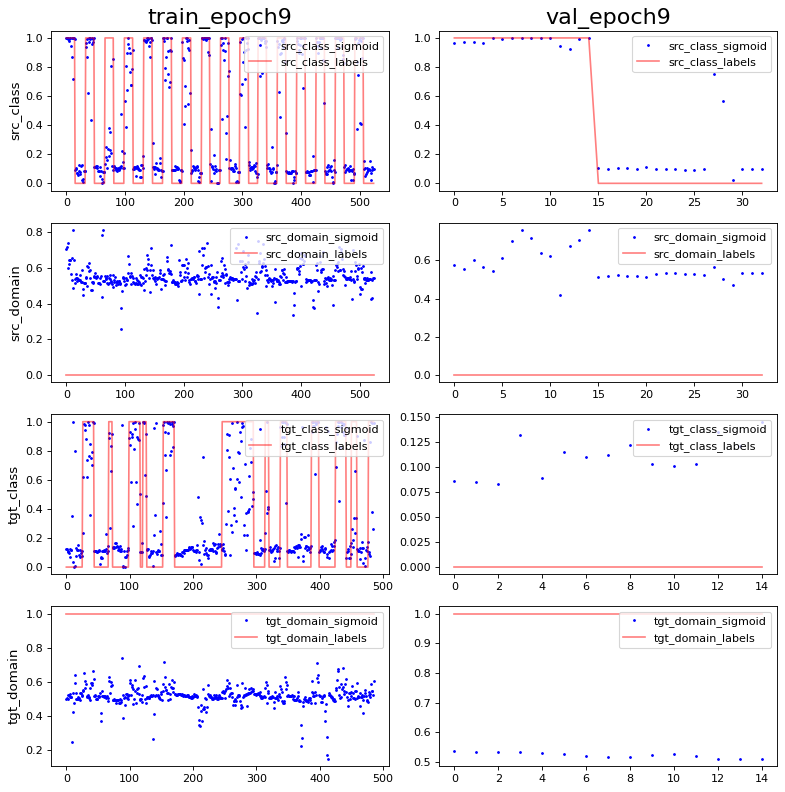

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -1.2577307e-09 1.0
PCA var: [36.3      45.399998 52.299995 58.499996 61.999996 64.799995 66.99999
 69.09999  70.79999  72.499985]
show standardize mean and std: 4.415159e-09 1.0
PCA var: [60.3 72.  77.9 83.3 87.5 90.2 92.7 94.2 95.2 96.1]


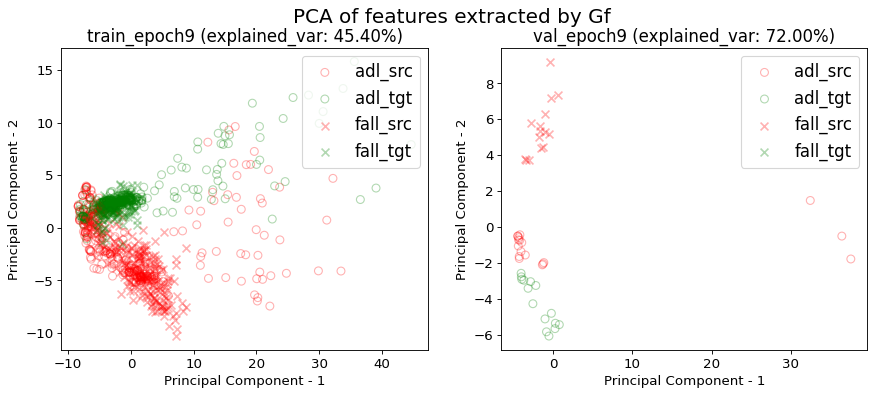

------------------------------Working on i_CV 15------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (458, 3, 66)
val_data shape: (43, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.540952380952381 0.4990476190476191 0.5619047619047619 0.09142857142857143
acc performance: 0.5454545454545454 0.18181818181818182 0.7575757575757576 0.09090909090909091


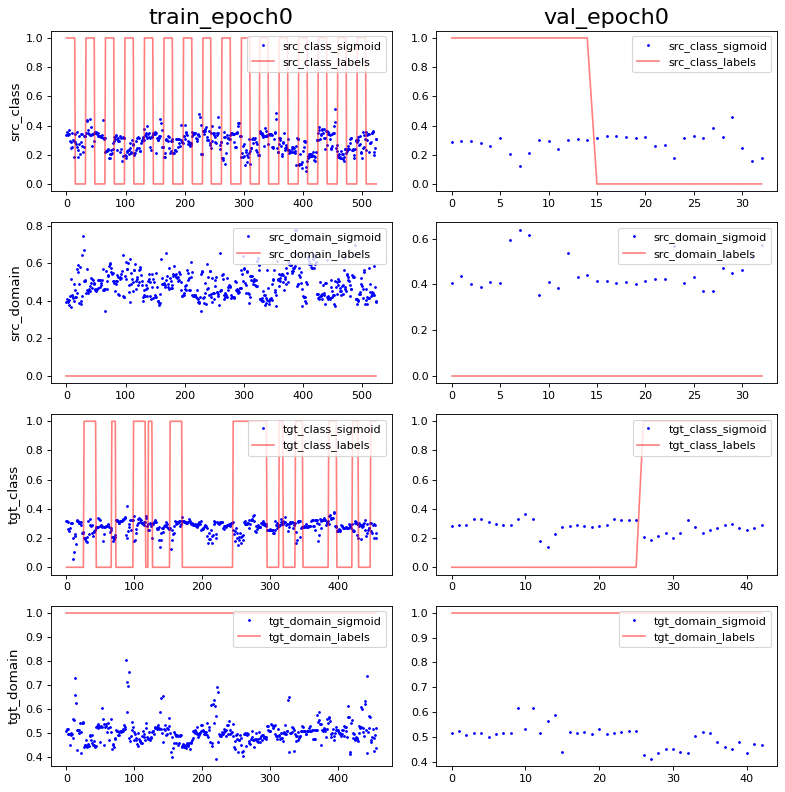

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 1.9403343e-09 0.9965218
PCA var: [27.7      39.1      46.699997 51.999996 56.399998 59.399998 61.8
 64.       66.1      68.      ]
show standardize mean and std: -2.7885214e-09 0.99303126
PCA var: [30.199999 44.1      54.8      61.9      67.8      72.200005 76.100006
 79.200005 82.200005 84.8     ]


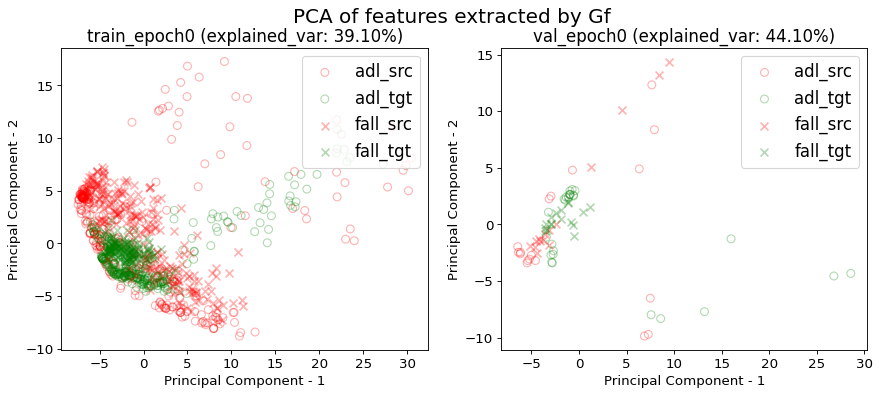

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


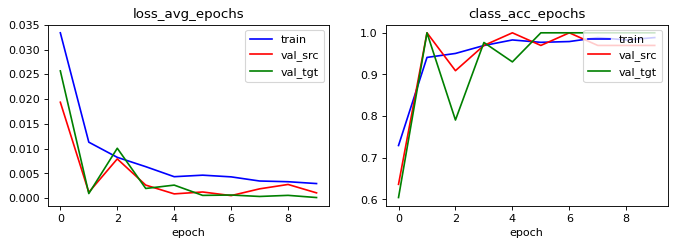

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.84 0.1180952380952381 0.8342857142857143 0.7485714285714286
acc performance: 0.9696969696969697 0.21212121212121213 1.303030303030303 1.0303030303030303


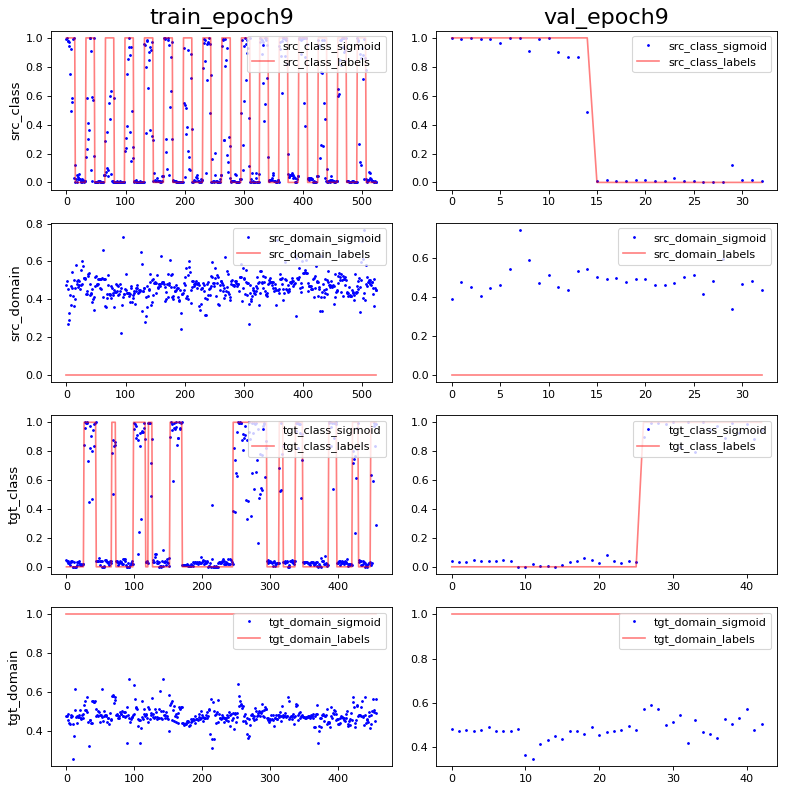

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: -8.623708e-10 0.9537936
PCA var: [35.100002 49.4      56.4      59.7      62.4      65.       67.5
 69.6      71.6      73.4     ]
show standardize mean and std: 1.3942607e-09 0.94280905
PCA var: [32.600002 51.9      60.800003 67.200005 71.600006 75.600006 79.00001
 81.80001  84.30001  86.60001 ]


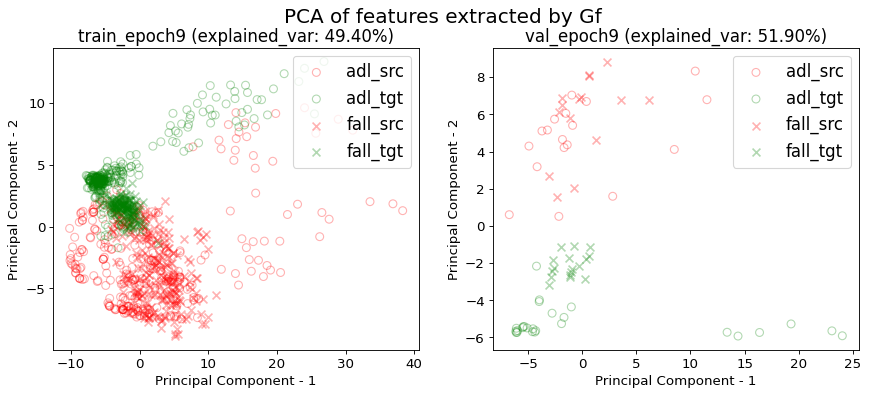

------------------------------Working on i_CV 16------------------------------
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (484, 3, 66)
val_data shape: (17, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.4819047619047619 0.9904761904761905 0.36952380952380953 0.011428571428571429
acc performance: 0.5151515151515151 1.0 0.30303030303030304 0.0


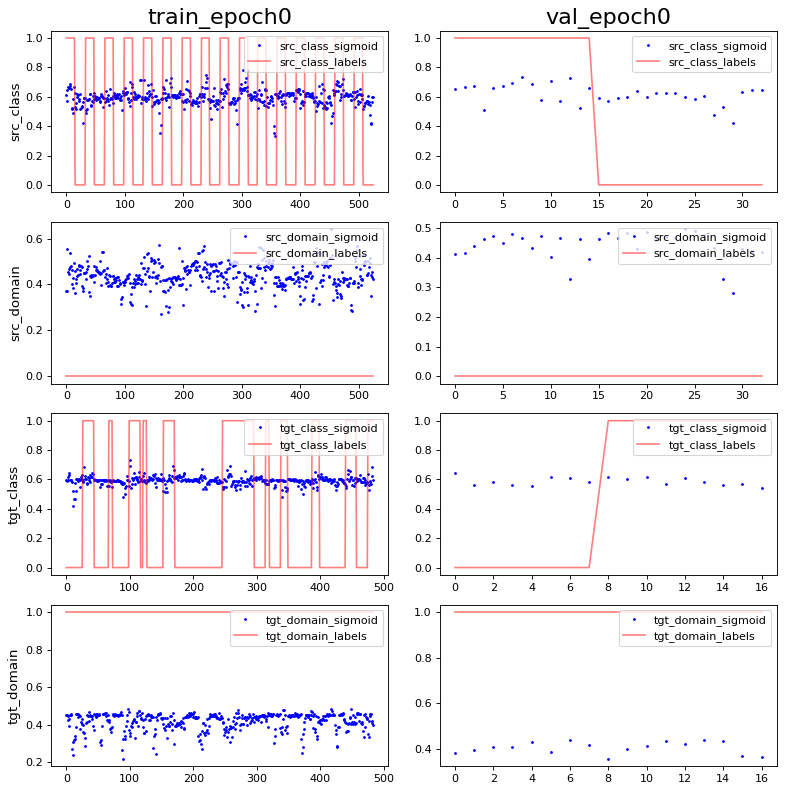

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 1.0501865e-09 0.9965218
PCA var: [26.9      40.8      49.7      55.9      60.100002 63.2      65.8
 67.9      69.700005 71.4     ]
show standardize mean and std: 2.1192763e-09 0.9965218
PCA var: [21.4      33.8      44.699997 53.499996 61.099995 66.09999  70.59999
 74.49999  77.299995 79.899994]


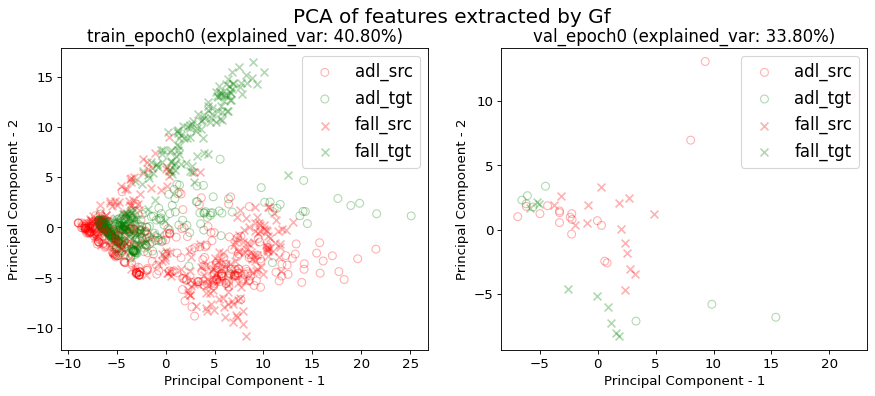

outputdir for baseline_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/


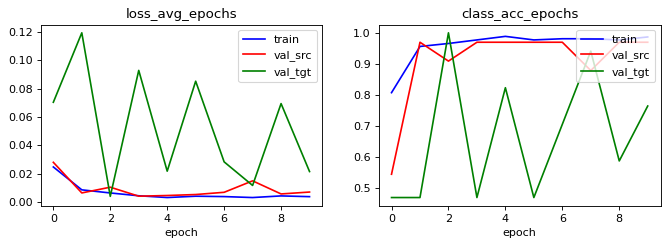

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
acc performance: 0.9866666666666667 0.9923809523809524 0.88 0.05904761904761905
acc performance: 0.9696969696969697 1.0 0.3939393939393939 0.0


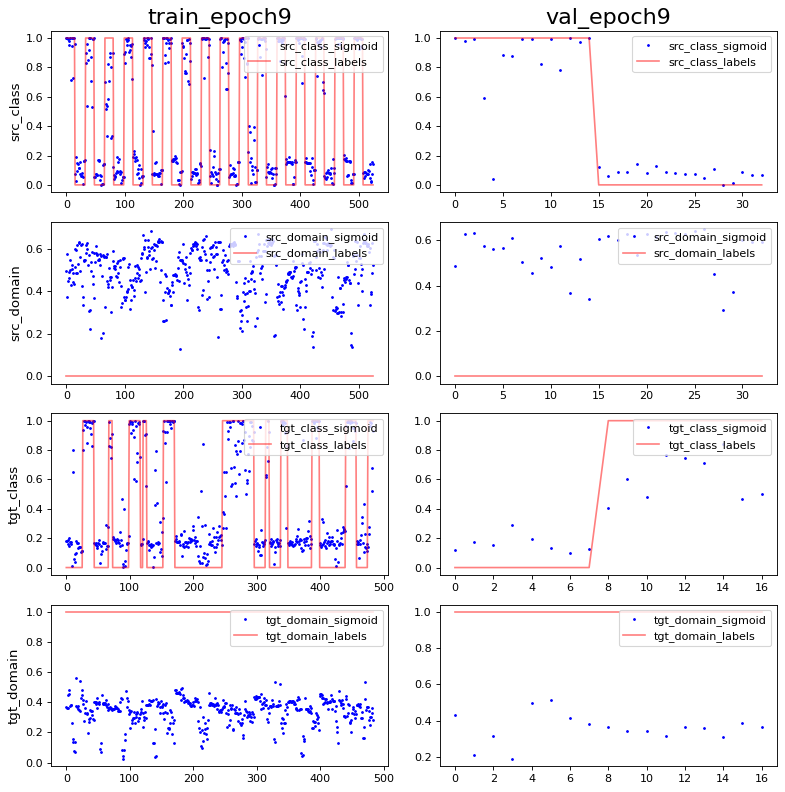

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/target/
show standardize mean and std: 2.31041e-09 0.9965218
PCA var: [28.400002 50.800003 57.700005 63.000004 66.9      69.200005 71.200005
 73.100006 74.8      76.3     ]
show standardize mean and std: 2.1192763e-09 0.9965217
PCA var: [27.5      53.5      62.9      68.9      74.200005 78.00001  80.700005
 83.200005 85.100006 86.8     ]


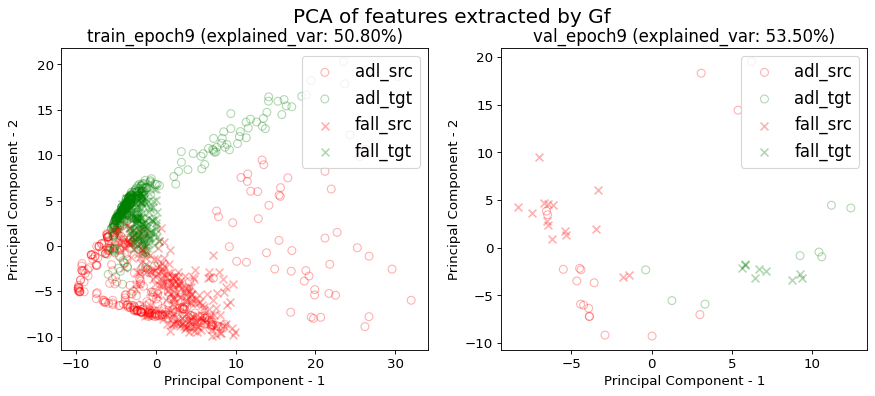

---------------Exporting model performance---------------
show df_performance


,i_CV,train_loss,train_acc,val_loss,val_acc,tgt_val_loss,tgt_val_acc
0,0.000000,0.003153,0.984762,0.000489,1.000000,0.012098,0.795455
1,1.000000,0.003593,0.984762,0.008977,0.909091,0.038931,0.793103
2,2.000000,0.001496,0.994286,0.040485,0.666667,0.001168,1.000000
3,3.000000,0.003358,0.984762,0.008171,0.878788,0.006725,0.875000
4,4.000000,0.003053,0.988571,0.002431,1.000000,0.055702,0.700000
5,5.000000,0.004205,0.975238,0.001950,0.969697,0.004806,0.931818
6,6.000000,0.002965,0.982857,0.004973,0.969697,0.002133,1.000000
7,7.000000,0.002752,0.988593,0.000784,1.000000,0.005814,0.733945
8,8.000000,0.003520,0.984762,0.015669,0.787879,0.001452,1.000000
9,9.000000,0.002480,0.988615,0.015934,0.806452,0.033516,1.000000


src val loss: 0.0084±0.0103
src val acc: 0.9102±0.1026
tgt val loss: 0.0389±0.1108
tgt val acc: 0.8728±0.1535
--------------Exporting notebook parameters--------------
{'CV_n': 17, 'samples_n': 558, 'classes_n': 2, 'model_name': 'DannModel', 'dataset_name': 'UPFall', 'num_epochs': 10, 'channel_n': 4, 'batch_size': 16, 'learning_rate': 0.01, 'sensor_loc': 'wrist', 'date': '2020/04/05 08:16:06', 'input_dim': (16, 3, 66), 'output_dim': (16,)}

======================  DANN training transferring knowledge(source=UMAFall_waist to target=UPFall_wrist)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UMAFall_loader...
train_data shape: (457, 3, 66)
val_data shape: (44, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_mo

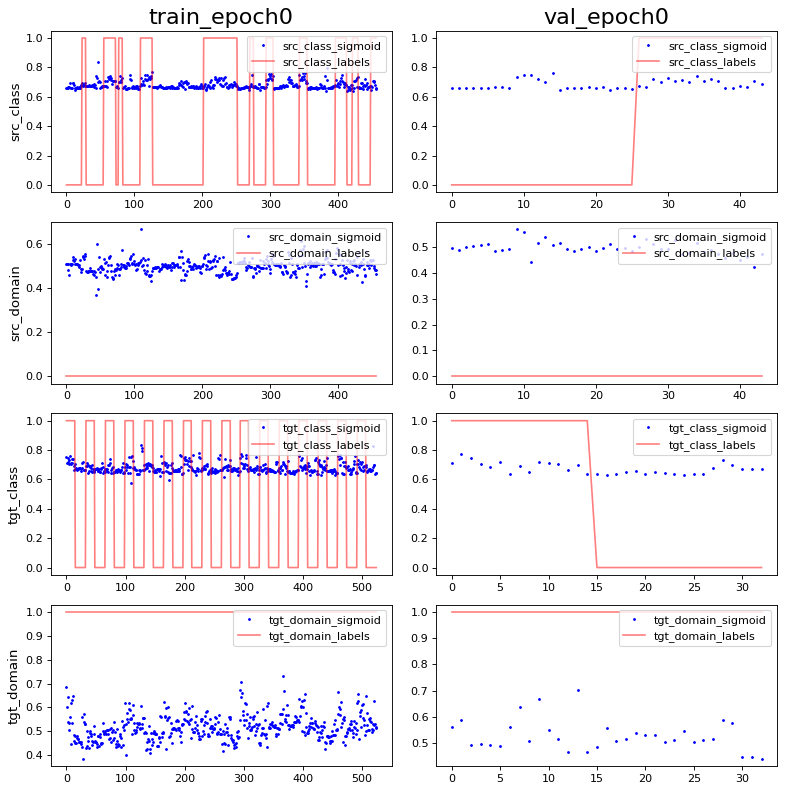

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
show standardize mean and std: -8.63249e-10 1.0
PCA var: [21.3      32.899998 42.699997 48.899998 53.8      57.1      59.8
 62.3      64.3      66.100006]
show standardize mean and std: -2.7523068e-09 1.0
PCA var: [33.6      43.699997 51.499996 57.799995 63.399994 68.299995 72.49999
 76.19999  79.19999  81.79999 ]


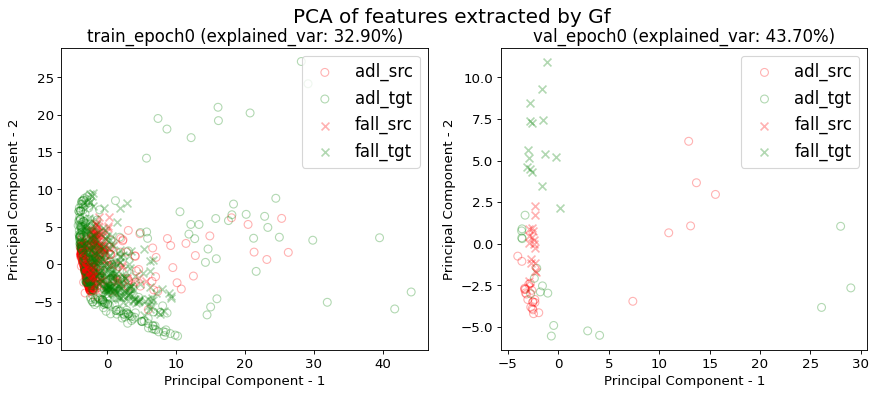

outputdir for dann_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/


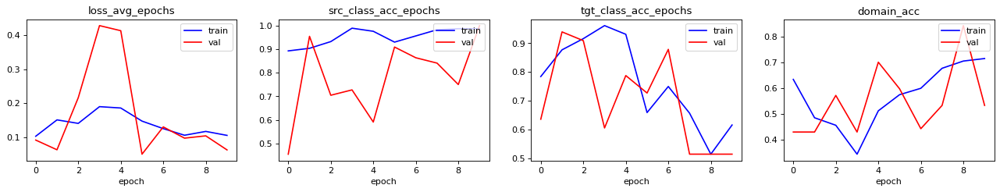

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
acc performance: 0.9824945295404814 0.3435448577680525 0.6805251641137856 0.925601750547046
acc performance: 1.0 0.3181818181818182 0.38636363636363635 0.6136363636363636


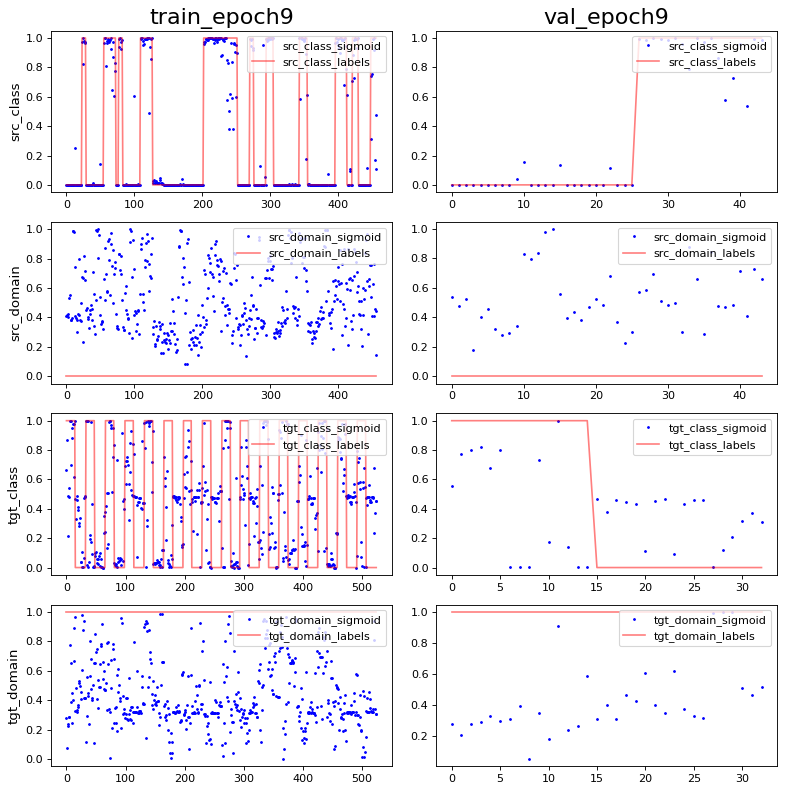

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
show standardize mean and std: -1.9423103e-09 1.0
PCA var: [46.2      60.4      65.5      70.       73.3      76.200005 78.200005
 80.00001  81.700005 83.100006]
show standardize mean and std: 0.0 0.99303126
PCA var: [49.5      64.8      71.4      77.       81.6      85.299995 87.899994
 90.2      91.5      92.7     ]


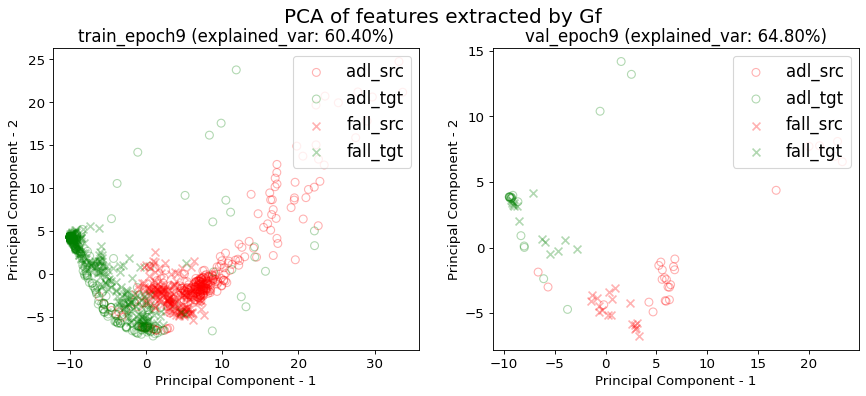

------------------------------Working on i_CV 1------------------------------
Working on get_UMAFall_loader...
train_data shape: (472, 3, 66)
val_data shape: (29, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
acc performance: 0.6567796610169492 0.24152542372881355 0.6228813559322034 0.1843220338983051
acc performance: 0.7931034482758621 0.20689655172413793 0.6206896551724138 0.0


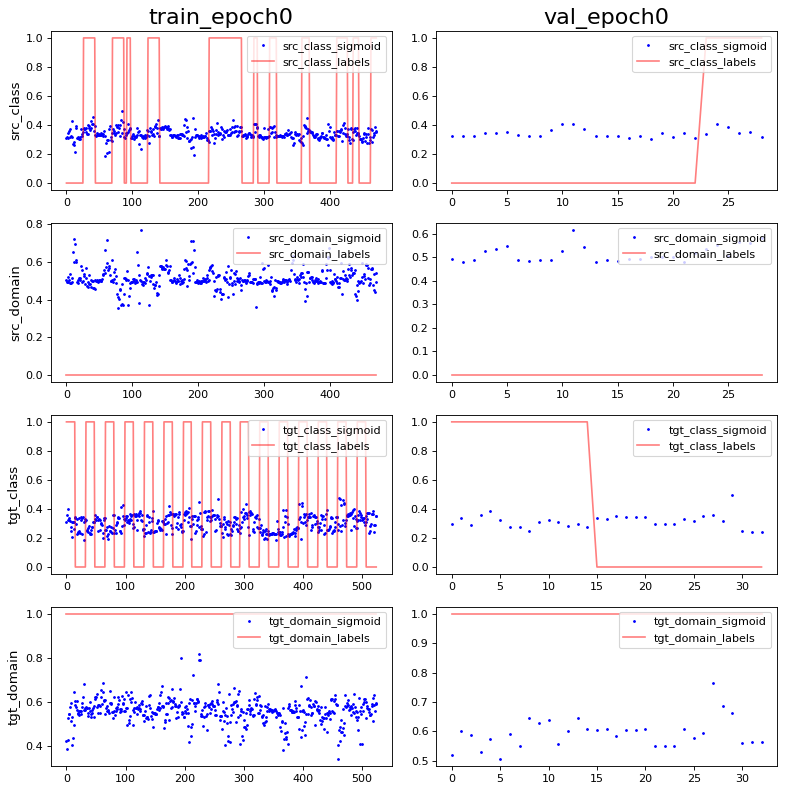

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
show standardize mean and std: -1.913088e-09 0.9860133
PCA var: [24.9      35.3      42.5      48.7      52.5      55.9      58.9
 61.600002 63.800003 65.8     ]
show standardize mean and std: 1.7090938e-09 0.9895286
PCA var: [27.1      39.5      49.7      59.5      66.4      72.5      77.1
 80.4      82.8      84.700005]


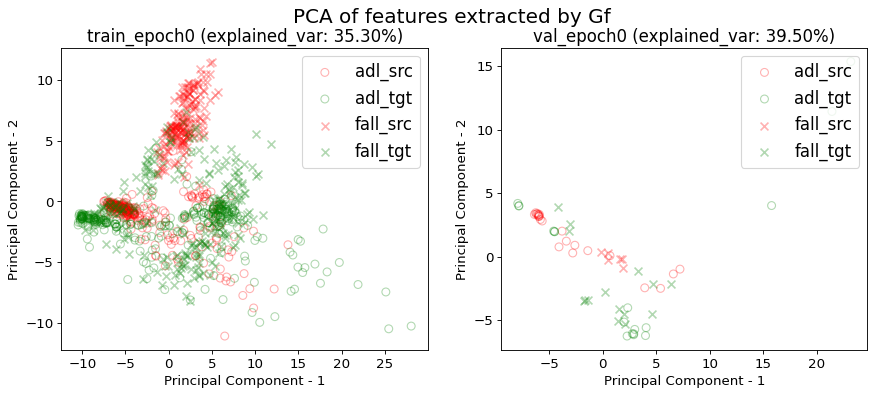

outputdir for dann_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/


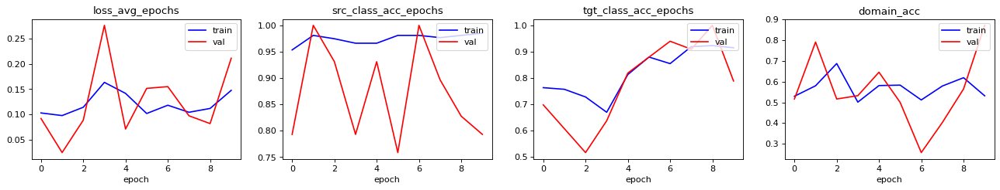

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
acc performance: 0.6461864406779662 0.972457627118644 0.9957627118644068 0.7838983050847458
acc performance: 0.7931034482758621 0.9655172413793104 0.896551724137931 0.896551724137931


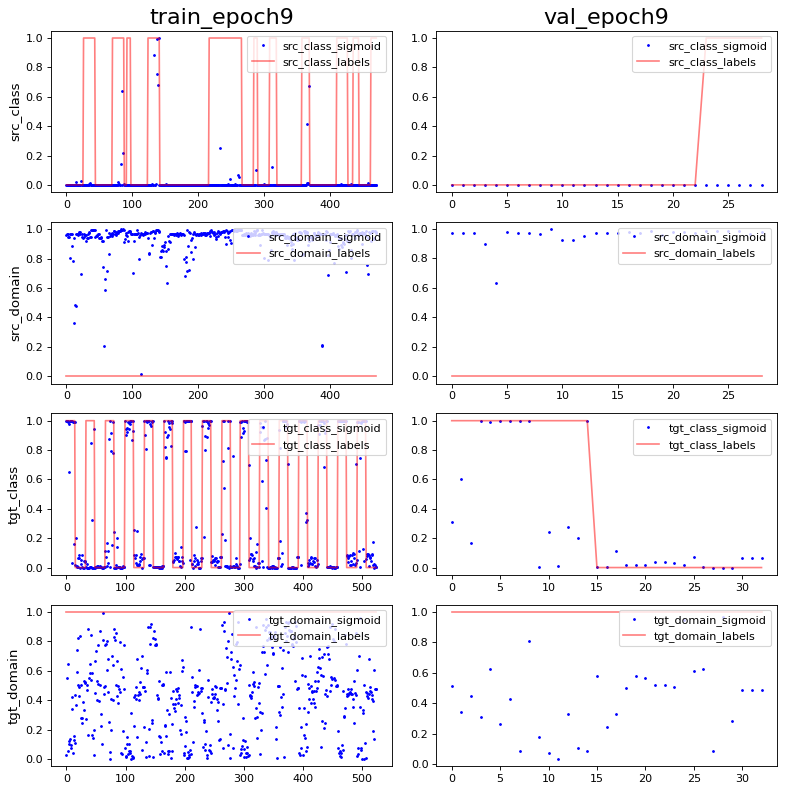

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
show standardize mean and std: -1.0628266e-09 1.0
PCA var: [36.       50.300003 59.600002 65.9      69.6      72.2      74.7
 76.7      78.399994 79.799995]
show standardize mean and std: 6.836375e-09 1.0
PCA var: [36.       55.9      65.4      73.9      78.700005 83.4      87.1
 90.1      92.2      93.399994]


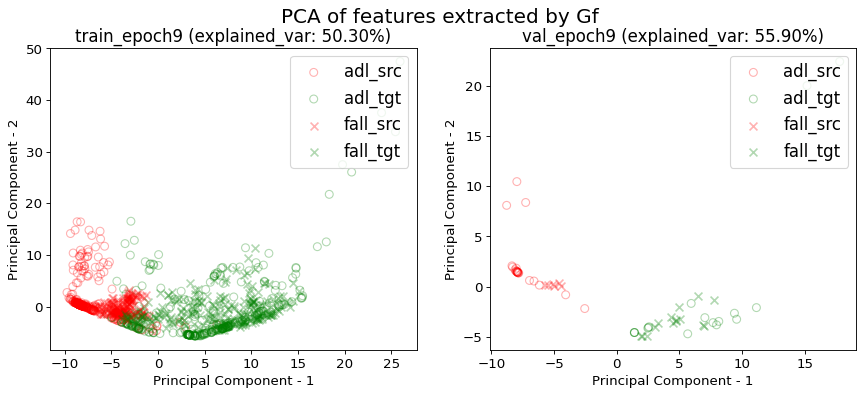

------------------------------Working on i_CV 2------------------------------
Working on get_UMAFall_loader...
train_data shape: (489, 3, 66)
val_data shape: (12, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
acc performance: 0.3312883435582822 0.0 0.44171779141104295 1.0736196319018405
acc performance: 0.0 0.0 1.25 2.75


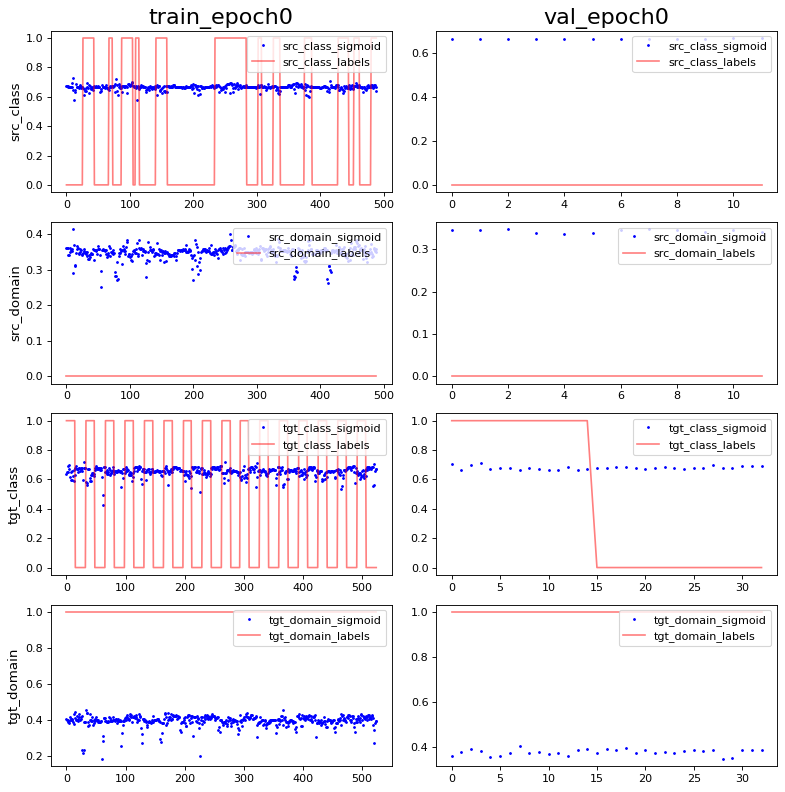

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
show standardize mean and std: 5.22504e-10 0.9965218
PCA var: [22.6      30.2      36.9      42.100002 46.000004 49.000004 51.700005
 54.200005 56.400005 58.500004]
show standardize mean and std: 2.3547515e-09 0.96824586
PCA var: [15.5 27.6 38.2 47.5 54.8 61.3 67.  71.3 75.  78.5]


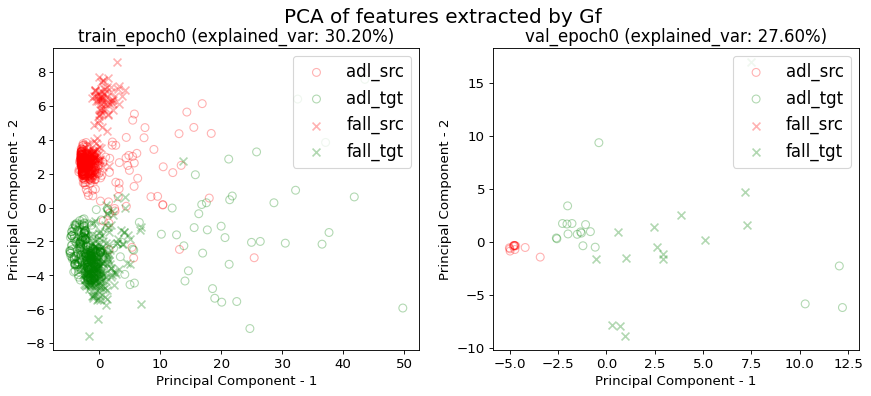

outputdir for dann_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/


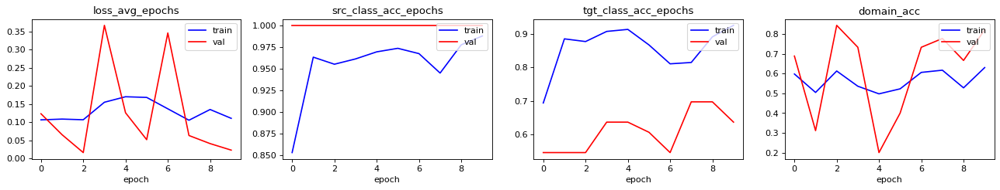

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
acc performance: 0.8997955010224948 0.9059304703476483 0.9631901840490797 0.6053169734151329
acc performance: 1.0 1.0 1.75 2.0833333333333335


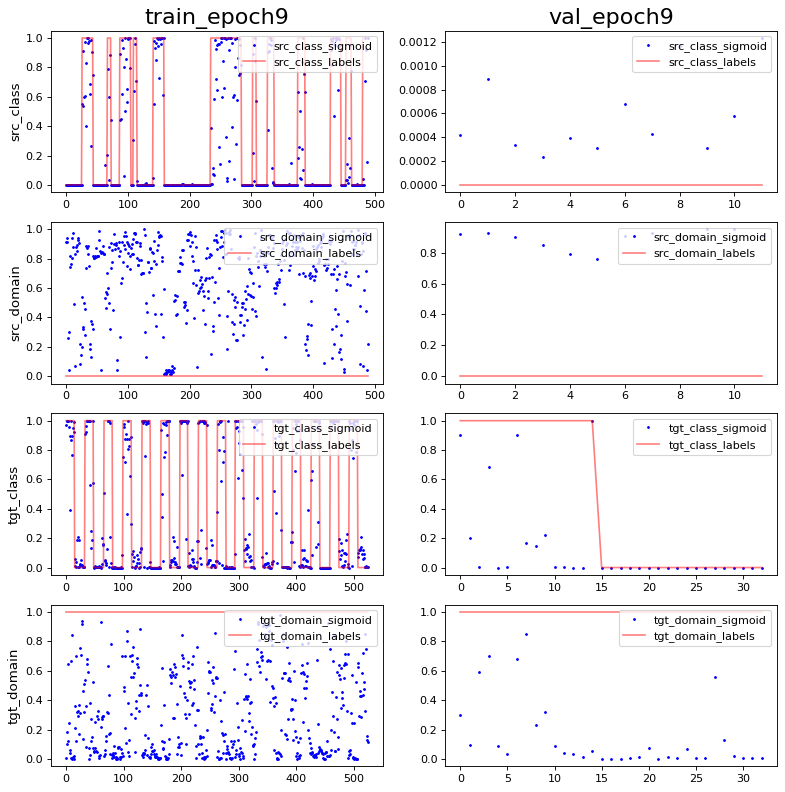

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
show standardize mean and std: 7.524058e-09 1.0
PCA var: [27.7      41.4      51.       56.6      60.5      63.7      66.6
 69.299995 71.7      73.899994]
show standardize mean and std: -1.1773758e-09 0.978945
PCA var: [36.399998 53.899998 64.799995 71.799995 78.2      82.7      85.7
 88.2      90.1      91.6     ]


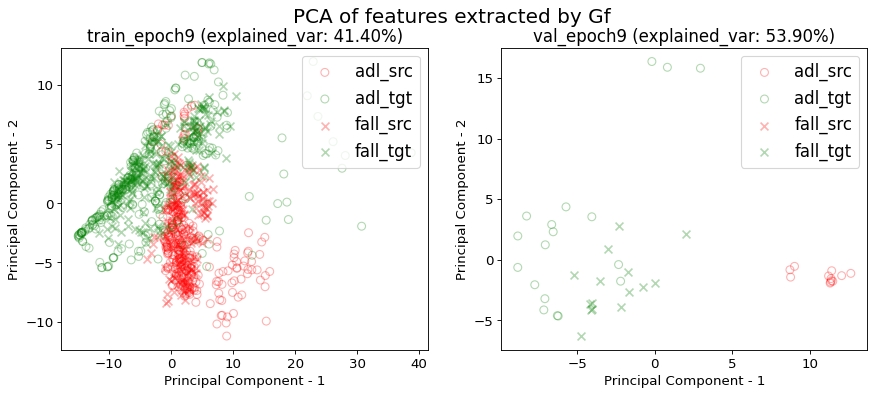

------------------------------Working on i_CV 3------------------------------
Working on get_UMAFall_loader...
train_data shape: (469, 3, 66)
val_data shape: (32, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
acc performance: 0.652452025586354 1.0 0.5927505330490405 0.0021321961620469083
acc performance: 0.4375 1.0 0.5625 0.0


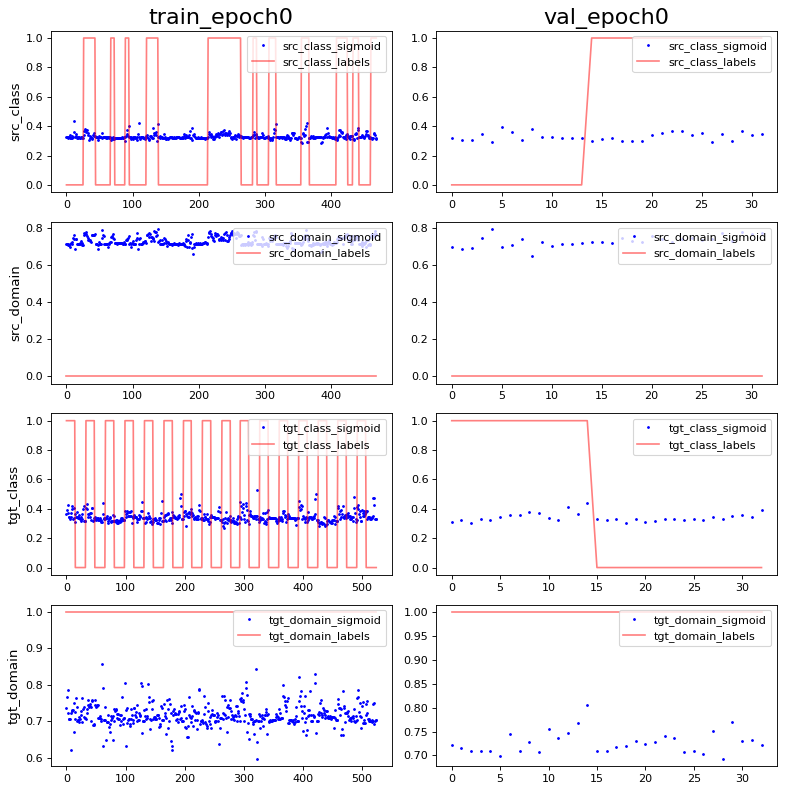

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
show standardize mean and std: -8.528275e-10 0.9930312
PCA var: [23.4      33.9      43.300003 51.100002 55.600002 58.800003 61.800003
 64.200005 66.4      68.4     ]
show standardize mean and std: 0.0 0.98952854
PCA var: [24.1      36.       46.       53.7      59.7      64.5      68.9
 73.200005 76.8      79.4     ]


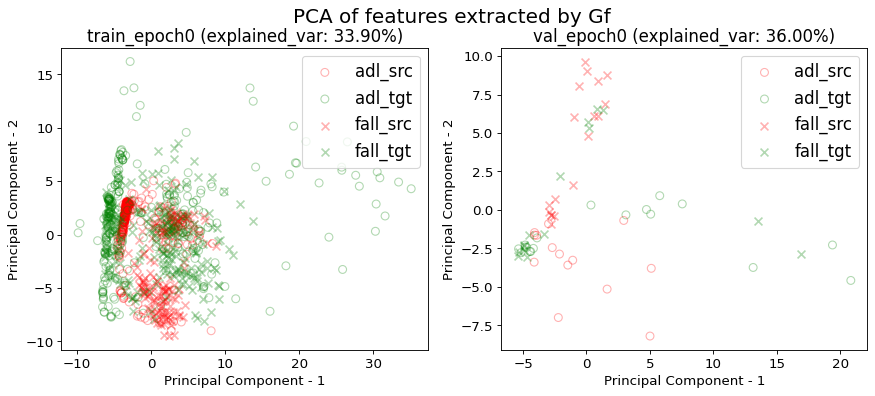

outputdir for dann_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/


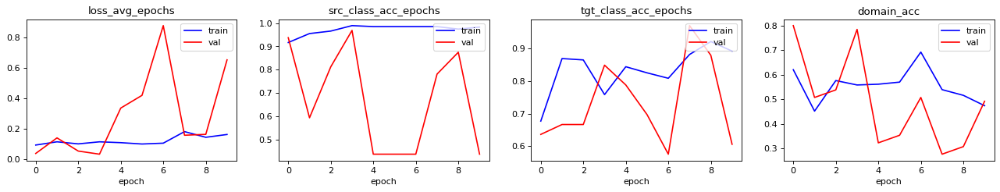

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
acc performance: 0.6652452025586354 0.006396588486140725 0.8507462686567164 0.603411513859275
acc performance: 0.4375 0.0625 0.625 0.9375


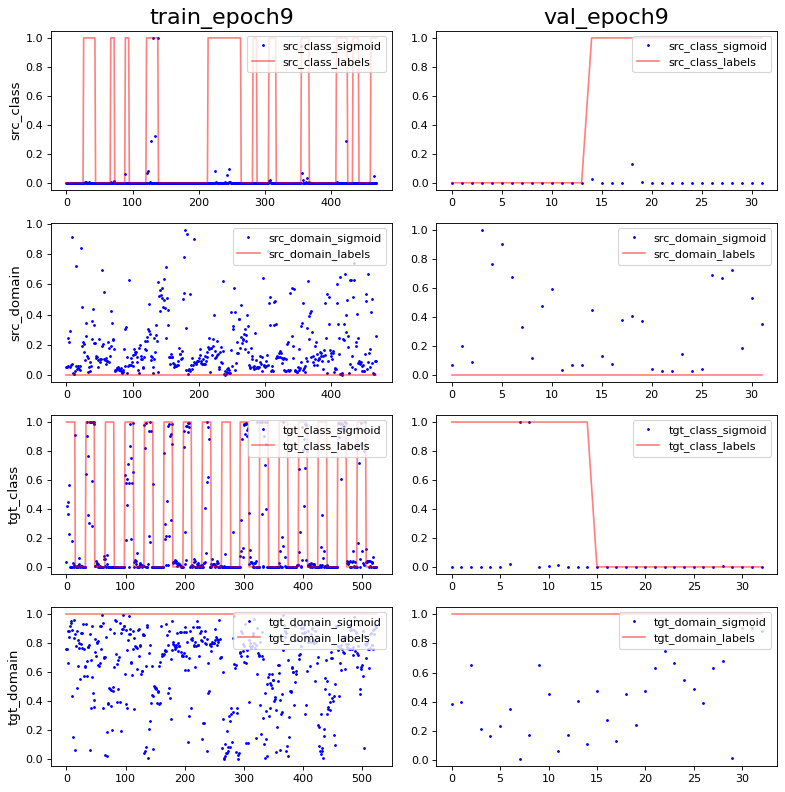

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
show standardize mean and std: 1.0233929e-08 0.9965218
PCA var: [59.8      70.2      75.399994 79.799995 82.899994 85.2      87.2
 88.7      89.7      90.7     ]
show standardize mean and std: -6.52085e-09 0.9965218
PCA var: [46.6      59.5      68.2      74.299995 79.49999  83.99999  86.899994
 89.2      90.799995 92.299995]


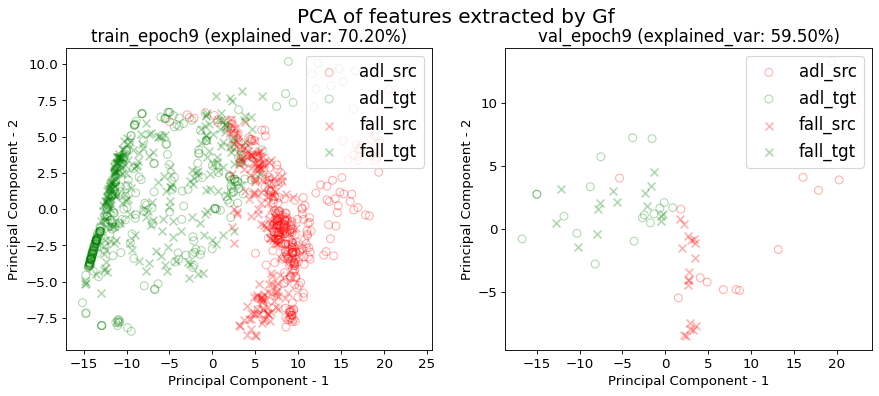

------------------------------Working on i_CV 4------------------------------
Working on get_UMAFall_loader...
train_data shape: (491, 3, 66)
val_data shape: (10, 3, 66)
Working on get_UPFall_loader...
train_data shape: (525, 3, 66)
val_data shape: (33, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
acc performance: 0.6456211812627292 0.7230142566191446 0.5824847250509165 0.17311608961303462
acc performance: 0.4 0.5 1.8 0.2


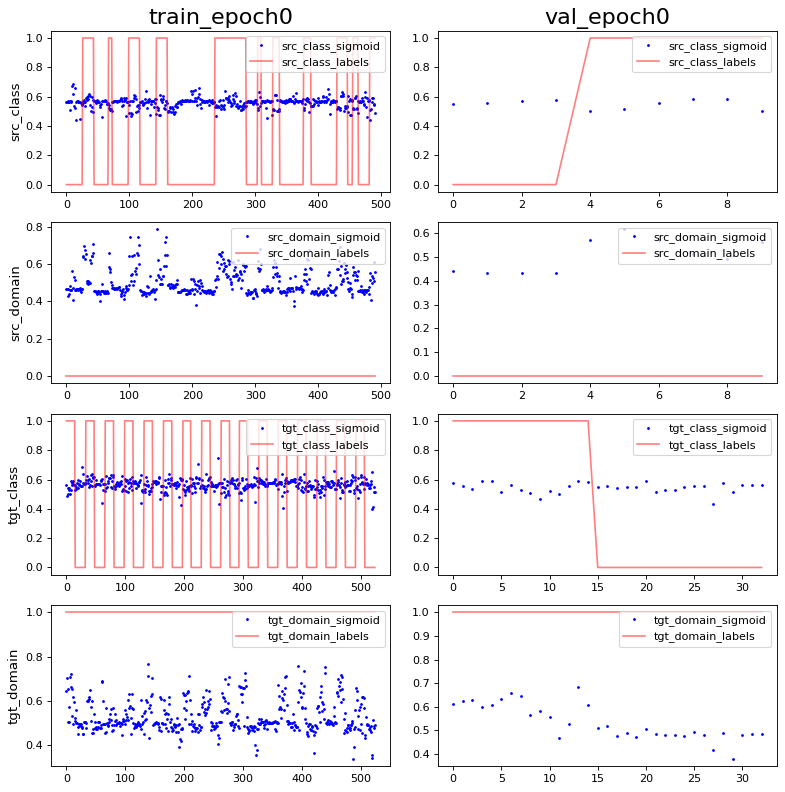

outputdir for model_features_diagnosis_trainval output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/
show standardize mean and std: -2.5030822e-09 0.99303126
PCA var: [24.8      36.399998 46.899998 53.699997 59.399998 62.399998 65.2
 67.5      69.4      71.200005]
show standardize mean and std: -3.696412e-09 0.99303126
PCA var: [24.3      38.6      49.3      57.6      63.6      69.1      73.5
 77.       80.1      82.299995]


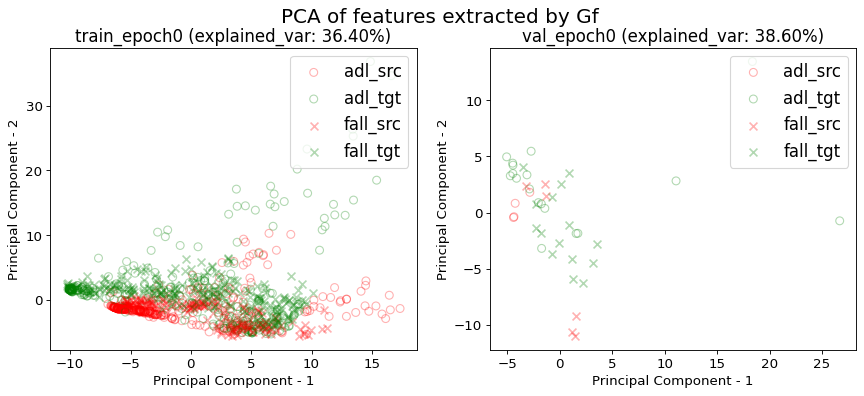

outputdir for dann_learning_diagnosis output: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_waist_UPFall_wrist/dann/


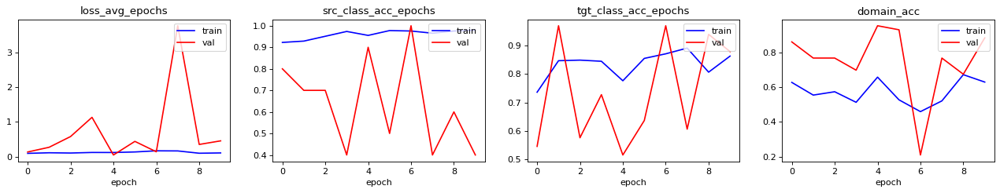

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748


In [0]:
# fine-tuning

tasks_list = [('UMAFall_waist', 'UPFall_wrist')]

extractor_type = 'CNN'
num_epochs = 10
CV_n = 17
rep_n = 10
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

training_params_list = [
  {
    'HP_name': 'HP_i0',
    'classes_n': 2,
    'CV_n': CV_n,
    'num_epochs': num_epochs,
    'channel_n': 4,
    'batch_size': 16,
    'learning_rate': 0.01,
    'extractor_type': extractor_type,
    'device': device,
    'dropout': 0.5,
    'hiddenDim_f': 3,
    'hiddenDim_y': 3,
    'hiddenDim_d': 3,
    'win_size': 18,
    'win_stride': 6,
    'step_n': 9,
  },

  {
    'HP_name': 'HP_i1',
    'classes_n': 2,
    'CV_n': CV_n,
    'num_epochs': num_epochs,
    'channel_n': 4,
    'batch_size': 4,
    'learning_rate': 0.01,
    'extractor_type': extractor_type,
    'device': device,
    'dropout': 0.5,
    'hiddenDim_f': 3,
    'hiddenDim_y': 3,
    'hiddenDim_d': 3,
    'win_size': 18,
    'win_stride': 6,
    'step_n': 9,
  },

  {
    'HP_name': 'HP_i2',
    'classes_n': 2,
    'CV_n': CV_n,
    'num_epochs': num_epochs,
    'channel_n': 4,
    'batch_size': 64,
    'learning_rate': 0.01,
    'extractor_type': extractor_type,
    'device': device,
    'dropout': 0.5,
    'hiddenDim_f': 3,
    'hiddenDim_y': 3,
    'hiddenDim_d': 3,
    'win_size': 18,
    'win_stride': 6,
    'step_n': 9,
  },
    
  {
    'HP_name': 'HP_i3',
    'classes_n': 2,
    'CV_n': CV_n,
    'num_epochs': num_epochs,
    'channel_n': 16,
    'batch_size': 4,
    'learning_rate': 0.01,
    'extractor_type': extractor_type,
    'device': device,
    'dropout': 0.5,
    'hiddenDim_f': 3,
    'hiddenDim_y': 3,
    'hiddenDim_d': 3,
    'win_size': 18,
    'win_stride': 6,
    'step_n': 9,
  },

  {
    'HP_name': 'HP_i4',
    'classes_n': 2,
    'CV_n': CV_n,
    'num_epochs': num_epochs,
    'channel_n': 32,
    'batch_size': 4,
    'learning_rate': 0.01,
    'extractor_type': extractor_type,
    'device': device,
    'dropout': 0.5,
    'hiddenDim_f': 3,
    'hiddenDim_y': 3,
    'hiddenDim_d': 3,
    'win_size': 18,
    'win_stride': 6,
    'step_n': 9,
  },

  {
    'HP_name': 'HP_i5',
    'classes_n': 2,
    'CV_n': CV_n,
    'num_epochs': num_epochs,
    'channel_n': 4,
    'batch_size': 4,
    'learning_rate': 0.001,
    'extractor_type': extractor_type,
    'device': device,
    'dropout': 0.5,
    'hiddenDim_f': 3,
    'hiddenDim_y': 3,
    'hiddenDim_d': 3,
    'win_size': 18,
    'win_stride': 6,
    'step_n': 9,
  },

  {
    'HP_name': 'HP_i6',
    'classes_n': 2,
    'CV_n': CV_n,
    'num_epochs': num_epochs,
    'channel_n': 4,
    'batch_size': 4,
    'learning_rate': 0.0001,
    'extractor_type': extractor_type,
    'device': device,
    'dropout': 0.5,
    'hiddenDim_f': 3,
    'hiddenDim_y': 3,
    'hiddenDim_d': 3,
    'win_size': 18,
    'win_stride': 6,
    'step_n': 9,
  }, ]

stage2_folder = 'stage2_modeloutput_18hz_LOO'

for task_item in tasks_list:
  (src_name, tgt_name) = task_item

  inputdir = '/content/drive/My Drive/中研院/data_mic/stage1_preprocessed_18hz_LOO/'

  outputdir = '/content/drive/My Drive/中研院/data_mic/{}/{}_{}/'.format(stage2_folder, src_name, tgt_name)
  if not os.path.exists(outputdir):
      os.makedirs(outputdir)
  print('outputdir for stage2 {} output: {}'.format(task_item, outputdir))

  df_outputdir = outputdir+'HP_search/'
  if not os.path.exists(df_outputdir):
    os.makedirs(df_outputdir)
  print('df_performance_table_agg saved at', df_outputdir)

  df_performance_table_agg = pd.DataFrame('', index=['channel_n', 'batch_size', 'learning_rate', 
                                                  'source', 'DANN', 'target', 'domain', 'time_elapsed', 'num_params'], columns=[])

  # 1. try all HP
  for i, training_params in enumerate(training_params_list):
    if 'rightpocket' in src_name or 'leg' in tgt_name or 'rightpocket' in tgt_name or 'leg' in src_name:
      training_params['CV_n'] = 15
    else:
      training_params['CV_n'] = 17
    df_performance_table = performance_table(src_name, tgt_name, training_params, inputdir, outputdir)
    df_performance_table_agg[training_params['HP_name']] = df_performance_table


  # 2. agg all HP
  df_performance_table_agg['HP_i3_1'] = df_performance_table_agg['HP_i1']
  df_performance_table_agg['HP_i5_1'] = df_performance_table_agg['HP_i1']
  # df_performance_table_agg = df_performance_table_agg[['HP_i0','HP_i1','HP_i2','HP_i3','HP_i3_1','HP_i4','HP_i5','HP_i5_1','HP_i6']]

  # 3 run optimal param for a task
  batch_size_optimal, channel_n_optimal, learning_rate_optimal = get_optimal(df_performance_table_agg)
  training_params_optimal = training_params.copy()
  training_params_optimal['HP_name'] = 'HP_optimal'
  training_params_optimal['batch_size'] = batch_size_optimal
  training_params_optimal['channel_n'] = channel_n_optimal
  training_params_optimal['learning_rate'] = learning_rate_optimal

  df_performance_table = performance_table(src_name, tgt_name, training_params_optimal, inputdir, outputdir)
  df_performance_table_agg[training_params_optimal['HP_name']] = df_performance_table
  
  df_performance_table_agg = df_performance_table_agg[['HP_i0','HP_i1','HP_i2','HP_i3','HP_i3_1','HP_i4','HP_i5','HP_i5_1','HP_i6','HP_optimal']]
  display(df_performance_table_agg)

  print('df_outputdir for stage2 df_performance_table_agg:', df_outputdir)
  df_performance_table_agg.to_csv(df_outputdir+'df_performance_table_agg.csv', encoding='utf-8')

  # Serialize data into file:
  json.dump({key:val for key, val in training_params.items() if key != 'device'}, open(df_outputdir+'optimal_training_params.json', 'w'))






In [0]:
# df_performance_table = pd.DataFrame('', index=['source', 'DANN', 'target', 'domain', 'time_elapsed'], columns=[])
# df_performance_table.loc['source', 'q1'] = 0
# df_performance_table.loc['target', 'q2'] = -1

# df_performance_table_agg['HP_3_1'] = df_performance_table_agg['HP_1']
# df_performance_table_agg['HP_5_1'] = df_performance_table_agg['HP_1']
# # df_performance_table_agg = df_performance_table_agg[['HP_i0','HP_i1','HP_i2','HP_i3','HP_i3_1','HP_i4','HP_i5','HP_i5_1','HP_i6']]
# display(df_performance_table_agg)
# df_performance_table_agg
# batch_size_optimal, channel_n_optimal, learning_rate_optimal = get_optimal(df_performance_table_agg)
# batch_size_optimal, channel_n_optimal, learning_rate_optimal

# df_performance_table_agg.iloc['HP_i0', 'source'] = 'sds+ds'
# df_performance_table_agg.loc['source','HP_i0'] = '{:.3f}±{:.3f}'.format(0.0232, 123.2321)

# batch_size_optimal, channel_n_optimal, learning_rate_optimal = get_optimal(df_performance_table_agg)
# batch_size_optimal, channel_n_optimal, learning_rate_optimal
optimal_training_params = training_params.copy()
optimal_training_params
# df_performance_table_agg

{'CV_n': 1,
 'HP_name': 'HP_optimal',
 'batch_size': 16,
 'channel_n': 32,
 'classes_n': 2,
 'device': device(type='cpu'),
 'dropout': 0.5,
 'extractor_type': 'CNN',
 'hiddenDim_d': 3,
 'hiddenDim_f': 3,
 'hiddenDim_y': 3,
 'learning_rate': 0.001,
 'num_epochs': 1,
 'step_n': 9,
 'win_size': 18,
 'win_stride': 6}

In [0]:
## fine-tuning

# # tasks_list = [('UMAFall_wrist', 'UPFall_neck'), ('UMAFall_wrist', 'UPFall_belt'), ('UMAFall_wrist', 'UPFall_ankle'),
# #               ('UMAFall_waist', 'UPFall_neck'), ('UMAFall_waist', 'UPFall_wrist'), ('UMAFall_waist', 'UPFall_ankle'),
# #               ('UMAFall_ankle', 'UPFall_neck'), ('UMAFall_ankle', 'UPFall_wrist'), ('UMAFall_ankle', 'UPFall_belt')]

# # tasks_list = [('UMAFall_wrist', 'UPFall_ankle'),
# #               ('UMAFall_waist', 'UPFall_neck'), ('UMAFall_waist', 'UPFall_wrist'), ('UMAFall_waist', 'UPFall_ankle'),
# #               ('UMAFall_ankle', 'UPFall_neck'), ('UMAFall_ankle', 'UPFall_wrist'), ('UMAFall_ankle', 'UPFall_belt')]

# # tasks_list = [('UMAFall_waist', 'UPFall_ankle'),
# #               ('UMAFall_ankle', 'UPFall_neck'), ('UMAFall_ankle', 'UPFall_wrist'), ('UMAFall_ankle', 'UPFall_belt')]

# # tasks_list = [('UMAFall_ankle', 'UPFall_wrist'), ('UMAFall_ankle', 'UPFall_belt')]
# # tasks_list = [('UMAFall_chest', 'UPFall_wrist'),
# # tasks_list = [('UMAFall_chest', 'UPFall_belt'),('UMAFall_chest', 'UPFall_rightpocket'),('UMAFall_chest', 'UPFall_ankle')]
# tasks_list = [('UMAFall_leg', 'UPFall_wrist'),('UMAFall_leg', 'UPFall_neck')]


# extractor_type = 'CNN'
# num_epochs = 2
# CV_n = 2
# device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# training_params_list = [
#   {
#     'HP_name': 'HP_0',
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': num_epochs,
#     'channel_n': 4,
#     'batch_size': 16,
#     'learning_rate': 0.01,
#     'extractor_type': extractor_type,
#     'device': device,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   },

#   {
#     'HP_name': 'HP_1',
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': num_epochs,
#     'channel_n': 4,
#     'batch_size': 4,
#     'learning_rate': 0.01,
#     'extractor_type': extractor_type,
#     'device': device,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   },

#   {
#     'HP_name': 'HP_2',
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': num_epochs,
#     'channel_n': 4,
#     'batch_size': 64,
#     'learning_rate': 0.01,
#     'extractor_type': extractor_type,
#     'device': device,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   },
    
#   {
#     'HP_name': 'HP_3',
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': num_epochs,
#     'channel_n': 16,
#     'batch_size': 4,
#     'learning_rate': 0.01,
#     'extractor_type': extractor_type,
#     'device': device,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   },

#   {
#     'HP_name': 'HP_4',
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': num_epochs,
#     'channel_n': 32,
#     'batch_size': 4,
#     'learning_rate': 0.01,
#     'extractor_type': extractor_type,
#     'device': device,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   },

#   {
#     'HP_name': 'HP_5',
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': num_epochs,
#     'channel_n': 4,
#     'batch_size': 4,
#     'learning_rate': 0.001,
#     'extractor_type': extractor_type,
#     'device': device,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   },

#   {
#     'HP_name': 'HP_6',
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': num_epochs,
#     'channel_n': 4,
#     'batch_size': 4,
#     'learning_rate': 0.0001,
#     'extractor_type': extractor_type,
#     'device': device,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   }, ]

# stage2_folder = 'stage2_modeloutput_18hz_LOO'

# for task_item in tasks_list:
#   (src_name, tgt_name) = task_item

#   # 1. try all HP
#   for i, training_params in enumerate(training_params_list):
#     # if tgt_name == 'UPFall_rightpocket':
#     #   training_params['CV_n'] = 15
#     # else:
#     #   training_params['CV_n'] = 17

#     start_time = time.time()
#     df_performance_table = pd.DataFrame('', index=['source', 'DANN', 'target', 'domain'], columns=[])

#     inputdir = '/content/drive/My Drive/中研院/data_mic/stage1_preprocessed_18hz_LOO/'
#     outputdir = '/content/drive/My Drive/中研院/data_mic/{}/{}_{}/'.format(stage2_folder, src_name, tgt_name)
#     if not os.path.exists(outputdir):
#         os.makedirs(outputdir)
#     print('outputdir for stage2 output:', outputdir)

#     df_performance_table = performance_table(df_performance_table, src_name, tgt_name, training_params, inputdir, outputdir)

#     time_elapsed = time.time() - start_time
#     print('time elapsed:', time_elapsed)
#     df_performance_table.loc['time_elapsed'] = time_elapsed
    

#     df_performance_table_agg[training_params['HP_name']] = df_performance_table
#     display(df_performance_table)

#   df_outputdir = outputdir+'HP_search/'
#   if not os.path.exists(df_outputdir):
#     os.makedirs(df_outputdir)

#   print('df_outputdir for stage2 df_performance_table_agg:', df_outputdir)
#   df_performance_table_agg.to_csv(df_outputdir+'df_performance_table_HP_agg.csv', encoding='utf-8')
#   display(df_performance_table_agg)

#   # 2. agg all HP
#   df_performance_table_agg = pd.DataFrame('', index=['channel_n', 'batch_size', 'learning_rate', 
#                                                   'source', 'DANN', 'target', 'domain', 'time_elapsed'], columns=[])
#   for i, training_params in enumerate(training_params_list):
#     # df_inputdir = outputdir+'HP_search/df_performance_table_HP_i{}.csv'.format(i)

#     # df_performance_table = pd.read_csv(df_inputdir, index_col=0)
    
#     # df_performance_table = df_performance_table.rename(columns={src_name+'_'+tgt_name: 'HP_i{}'.format(i)})
#     # df_performance_table_agg['HP_i{}'.format(i)] = df_performance_table
#     df_performance_table_agg['HP_i{}'.format(i)]['channel_n'] = training_params['channel_n']
#     df_performance_table_agg['HP_i{}'.format(i)]['batch_size'] = training_params['batch_size']
#     df_performance_table_agg['HP_i{}'.format(i)]['learning_rate'] = training_params['learning_rate']

#   df_performance_table_agg['HP_i3_1'] = df_performance_table_agg['HP_i1']
#   df_performance_table_agg['HP_i5_1'] = df_performance_table_agg['HP_i1']
#   df_performance_table_agg = df_performance_table_agg[['HP_i0','HP_i1','HP_i2','HP_i3','HP_i3_1','HP_i4','HP_i5','HP_i5_1','HP_i6']]
#   display(df_performance_table_agg)

#   # 3 run optimal param for a task
#   df_performance_table_agg_temp = df_performance_table_agg.copy()
#   df_performance_table_agg_temp.loc['DANN'] = df_performance_table_agg_temp.loc['DANN'].str.split('±').str[0].astype(float)

#   result = df_performance_table_agg_temp[['HP_i0','HP_i1','HP_i2']].sort_values(by='DANN', ascending=False, axis=1)
#   batch_size_optimal = result.loc['batch_size'][0]

#   result = df_performance_table_agg_temp[['HP_i3','HP_i3_1','HP_i4']].sort_values(by='DANN', ascending=False, axis=1)
#   channel_n_optimal = result.loc['channel_n'][0]

#   result = df_performance_table_agg_temp[['HP_i5','HP_i5_1','HP_i6']].sort_values(by='DANN', ascending=False, axis=1)
#   learning_rate_optimal = result.loc['learning_rate'][0]

#   training_params['batch_size'] = batch_size_optimal
#   training_params['channel_n'] = channel_n_optimal
#   training_params['learning_rate'] = learning_rate_optimal

#   start_time = time.time()

#   df_performance_table = pd.DataFrame('', index=['source', 'DANN', 'target', 'domain'], columns=[])

#   inputdir = '/content/drive/My Drive/中研院/data_mic/stage1_preprocessed_18hz_LOO/'
#   outputdir = '/content/drive/My Drive/中研院/data_mic/{}/{}_{}/'.format(stage2_folder, src_name, tgt_name)

#   df_performance_table = performance_table(df_performance_table, src_name, tgt_name, training_params, inputdir, outputdir)

#   time_elapsed = time.time() - start_time
#   print('time elapsed:', time_elapsed)
#   df_performance_table.loc['time_elapsed'] = time_elapsed

#   df_performance_table_agg['HP_optimal'] = df_performance_table
#   df_performance_table_agg['HP_optimal']['channel_n'] = channel_n_optimal
#   df_performance_table_agg['HP_optimal']['batch_size'] = batch_size_optimal
#   df_performance_table_agg['HP_optimal']['learning_rate'] = learning_rate_optimal

#   df_outputdir = outputdir+'HP_search/'
#   if not os.path.exists(df_outputdir):
#     os.makedirs(df_outputdir)

#   print('df_outputdir for stage2 df_performance_table_agg:', df_outputdir)
#   df_performance_table_agg.to_csv(df_outputdir+'df_performance_table_HP_agg.csv', encoding='utf-8')

#   # print('df_performance_table saved at', df_outputdir)
#   # df_performance_table.to_csv(df_outputdir+'df_performance_table_HP_optimal.csv', encoding='utf-8')

#   # Serialize data into file:
#   json.dump({key:val for key, val in training_params.items() if key != 'device'}, open(df_outputdir+'optimal_training_params.json', 'w'))

#   print('batch_size_optimal, channel_n_optimal, learning_rate_optimal:', batch_size_optimal, channel_n_optimal, learning_rate_optimal)

#   display(df_performance_table)




In [0]:
training_params['HP_name']

'HP_0'

In [0]:
# stage2_folder = 'stage2_modeloutput_18hz_LOO'

# for task_item in tasks_list:
#   (src_name, tgt_name) = task_item

#   df_performance_table_agg = pd.DataFrame('', index=['channel_n', 'batch_size', 'learning_rate', 
#                                                     'source', 'DANN', 'target', 'domain', 'time_elapsed'], columns=[])

#   for i, training_params in enumerate(training_params_list):
#     inputdir = '/content/drive/My Drive/中研院/data_mic/{}/{}_{}/'.format(stage2_folder, src_name, tgt_name)

#     df_inputdir = inputdir+'HP_search/df_performance_table_HP_i{}.csv'.format(i)


#     df_performance_table = pd.read_csv(df_inputdir, index_col=0)
    
#     df_performance_table = df_performance_table.rename(columns={src_name+'_'+tgt_name: 'HP_i{}'.format(i)})
#     df_performance_table_agg['HP_i{}'.format(i)] = df_performance_table
#     df_performance_table_agg['HP_i{}'.format(i)]['channel_n'] = training_params['channel_n']
#     df_performance_table_agg['HP_i{}'.format(i)]['batch_size'] = training_params['batch_size']
#     df_performance_table_agg['HP_i{}'.format(i)]['learning_rate'] = training_params['learning_rate']

#   df_performance_table_agg['HP_i3_1'] = df_performance_table_agg['HP_i1']
#   df_performance_table_agg['HP_i5_1'] = df_performance_table_agg['HP_i1']
#   df_performance_table_agg = df_performance_table_agg[['HP_i0','HP_i1','HP_i2','HP_i3','HP_i3_1','HP_i4','HP_i5','HP_i5_1','HP_i6']]
#   display(df_performance_table_agg)

#   print('df_outputdir for stage2 df_performance_table_agg:', inputdir)

#   df_performance_table_agg.to_csv(inputdir+'HP_search/df_performance_table_HP_agg.csv', encoding='utf-8')


,HP_i0,HP_i1,HP_i2,HP_i3,HP_i3_1,HP_i4,HP_i5,HP_i5_1,HP_i6
channel_n,4,4,4,16,4,32,4,4,4
batch_size,16,4,64,4,4,4,4,4,4
learning_rate,0.01,0.01,0.01,0.01,0.01,0.01,0.001,0.01,0.0001
source,0.821±0.135,0.722±0.127,0.779±0.146,0.811±0.136,0.722±0.127,0.754±0.110,0.758±0.114,0.722±0.127,0.697±0.205
DANN,0.748±0.155,0.841±0.148,0.680±0.141,0.799±0.117,0.841±0.148,0.801±0.097,0.864±0.109,0.841±0.148,0.765±0.126
target,0.929±0.067,0.968±0.031,0.948±0.070,0.937±0.116,0.968±0.031,0.928±0.091,0.988±0.019,0.968±0.031,0.937±0.062
domain,0.555±0.248,0.403±0.173,0.468±0.258,0.624±0.213,0.403±0.173,0.531±0.249,0.535±0.316,0.403±0.173,0.567±0.243
time_elapsed,411.6417305469513,704.6574213504791,325.5955321788788,722.8891479969025,704.6574213504791,728.4015955924988,719.3020045757294,704.6574213504791,735.7207098007202


df_outputdir for stage2 df_performance_table_agg: /content/drive/My Drive/中研院/data_mic/stage2_modeloutput_18hz_LOO/UMAFall_chest_UPFall_neck/


# hyperparameter fine-tuning

In [0]:
# # fine-tuning

# CV_n = 17
# extractor_type = 'CNN'

# training_params_list = [
#   {
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': 10,
#     'channel_n': 4,
#     'batch_size': 16,
#     'learning_rate': 0.01,
#     'extractor_type': extractor_type,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   },

#   {
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': 10,
#     'channel_n': 4,
#     'batch_size': 4,
#     'learning_rate': 0.01,
#     'extractor_type': extractor_type,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   },

#   {
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': 10,
#     'channel_n': 4,
#     'batch_size': 64,
#     'learning_rate': 0.01,
#     'extractor_type': extractor_type,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   },
    
#   {
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': 10,
#     'channel_n': 16,
#     'batch_size': 4,
#     'learning_rate': 0.01,
#     'extractor_type': extractor_type,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   },

#   {
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': 10,
#     'channel_n': 32,
#     'batch_size': 4,
#     'learning_rate': 0.01,
#     'extractor_type': extractor_type,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   },

#   {
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': 10,
#     'channel_n': 4,
#     'batch_size': 4,
#     'learning_rate': 0.001,
#     'extractor_type': extractor_type,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   },

#   {
#     'classes_n': 2,
#     'CV_n': CV_n,
#     'num_epochs': 10,
#     'channel_n': 4,
#     'batch_size': 4,
#     'learning_rate': 0.0001,
#     'extractor_type': extractor_type,
#     'dropout': 0.5,
#     'hiddenDim_f': 3,
#     'hiddenDim_y': 3,
#     'hiddenDim_d': 3,
#     'win_size': 18,
#     'win_stride': 6,
#     'step_n': 9,
#   }, ]

# tasks_list = [('UMAFall_waist', 'UPFall_belt')]

# # tasks_list = [('UMAFall_ankle', 'UPFall_ankle')]
# # tasks_list = [('UMAFall_wrist', 'UPFall_wrist')]
# # tasks_list = [('UMAFall_leg', 'UPFall_rightpocket')]
# # tasks_list = [('UPFall_belt', 'UMAFall_waist')]

# stage2_folder = 'stage2_modeloutput_18hz_LOO'

# for task_item in tasks_list:
#   (src_name, tgt_name) = task_item

#   for i, training_params in enumerate(training_params_list):
#     start_time = time.time()
#     df_performance_table = pd.DataFrame('', index=['source', 'DANN', 'target', 'domain'], columns=[])

#   # for task_item in tasks_list:
#   #   (src_name, tgt_name) = task_item

#     inputdir = '/content/drive/My Drive/中研院/data_mic/stage1_preprocessed_18hz_LOO/'
#     outputdir = '/content/drive/My Drive/中研院/data_mic/{}/{}_{}/'.format(stage2_folder, src_name, tgt_name)
#     if not os.path.exists(outputdir):
#         os.makedirs(outputdir)
#     print('outputdir for stage2 output:', outputdir)

#     df_performance_table = performance_table(df_performance_table, src_name, tgt_name, training_params, inputdir, outputdir)

#     time_elapsed = time.time() - start_time
#     print('time elapsed:', time_elapsed)
#     df_performance_table.loc['time_elapsed'] = time_elapsed

#     df_outputdir = outputdir+'HP_search/'
#     if not os.path.exists(df_outputdir):
#       os.makedirs(df_outputdir)

#     print('df_performance_table saved at', df_outputdir)
#     df_performance_table.to_csv(df_outputdir+'df_performance_table_HP_i{}.csv'.format(i), encoding='utf-8')

#     display(df_performance_table)